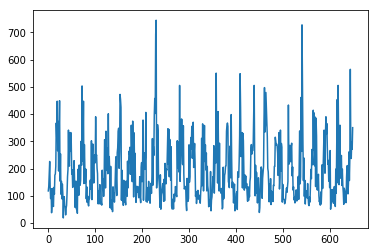

('Var:', 0.38475958)


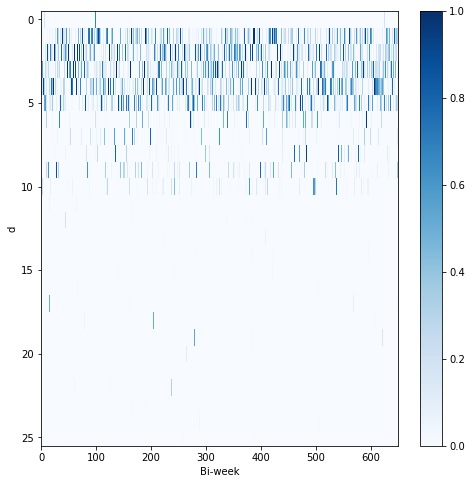

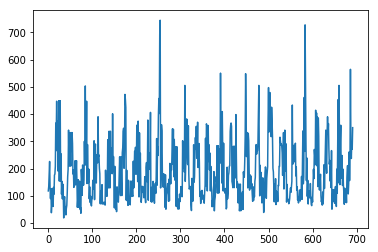

0.0


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import expit
from contextlib import contextmanager
import os
@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:  
            yield
        finally:
            sys.stdout = old_stdout
            

import csv 
import sys

def sim_data(D,r,doPlot):
    os.system("Rscript blrp.R")
    ts = []
    skipFirst = 0
    with open('simData.csv', 'rb') as csvfile:
        for line in csvfile.readlines():
            if skipFirst >= 1:
                ts.append(int(line.split(',')[1]))
            skipFirst += 1
    plt.plot(ts)
    plt.show()
        

    arr_list = ts

    sim_n_t_d = []
    for i in range(len(ts)):

        if np.random.binomial(1,.1) == 1 and i % 26 ==0 and i < len(ts)-10:
            sim_n_t_d.append(np.random.multinomial(ts[i],np.random.dirichlet(np.append([0.01,0.01,0.01,0.01,100],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+1],np.random.dirichlet(np.append([0.01,0.01,0.01,100,.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+2],np.random.dirichlet(np.append([0.01,0.01,100,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+3],np.random.dirichlet(np.append([0.01,100,0.01,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            
            i+=4
        elif np.random.binomial(1,.1) == 1 and i % 11 == 0 and i < len(ts)-10:
            
            sim_n_t_d.append(np.random.multinomial(ts[i],np.random.dirichlet(np.append([0.01,0.01,0.01,0.01,100],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+1],np.random.dirichlet(np.append([0.01,0.01,0.01,100,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+2],np.random.dirichlet(np.append([0.01,0.01,100,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+3],np.random.dirichlet(np.append([0.01,100,0.01,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            i+=4
        elif np.random.binomial(1,.1) == 1 and i % 16 == 0 and i < len(ts)-10 :
            
            sim_n_t_d.append(np.random.multinomial(ts[i],np.random.dirichlet(np.append([0.01,0.01,0.01,0.01,100],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+1],np.random.dirichlet(np.append([0.01,0.01,0.01,100,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+2],np.random.dirichlet(np.append([0.01,0.01,100,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            sim_n_t_d.append(np.random.multinomial(ts[i+3],np.random.dirichlet(np.append([0.01,100,0.01,0.01,0.01],.1*np.ones(D-5))),size=D).tolist()[0])
            i+=4
        else:
            rand_dir = [.005*np.ones(1),.25*np.ones(5),.05*np.ones(5),.001*np.ones(10),.0001*np.ones(D-21)]
            rand_dir =  np.random.dirichlet(np.hstack(rand_dir))
        
            tmp1 = np.random.multinomial(ts[i],rand_dir,size=D).tolist()[0]
            sim_n_t_d.append(tmp1)

    sim_n_t_d = np.array(sim_n_t_d,dtype=np.float32)
    #print (sim_n_t_d)
    p_hat_sim = []
    from matplotlib.pyplot import cm

    for i in range(len(arr_list)):
        #print (sum(sim_n_t_d[i]/np.sum(sim_n_t_d[i])))
        p_hat_sim.append(sim_n_t_d[i]/np.sum(sim_n_t_d[i]))


    if doPlot == True:
        print ("Var:",np.sum(np.var(p_hat_sim,axis=0)))
        plt.figure(figsize=(8,8))
        plt.xlabel("Bi-week")
        plt.ylabel("d")
        plt.imshow(np.transpose(p_hat_sim),aspect='auto',cmap=cm.Blues)
        plt.legend()
        plt.colorbar()
        plt.show()

        plt.plot(sim_n_t_d.sum(axis=1))
        plt.show()

    sim_n_t_d = sim_n_t_d.reshape((-1,D))
    return sim_n_t_d,np.linalg.det(np.cov(p_hat_sim))

sim_data_1,var = sim_data(26,10,True)
print (var)

In [2]:
np.arange(5-1,-1,-1)

array([4, 3, 2, 1, 0])

In [3]:
import numpy as np
import emcee
from scipy.stats import binom
from scipy.stats import norm
import pymc3 as pm
import numpy as np


def bayes_estimate(po_data,m2,phat,LO):
    count = LO
    print (len(po_data),len(m2))
    ret_arr = []
    for row in np.arange(LO,0,-1):
        print (m2[D-row],po_data[D-row],sum(phat[:count]))
        with pm.Model() as model:
            tmp = np.max((m2[(D-row)],po_data[D-row]))
            x = pm.Normal('x', mu=tmp, sd=10)
            z = pm.Binomial('z', n=tmp,p=sum(phat[:count]),observed=po_data[D-row])
        
        with model:
            trace = pm.sample(10000)
            
        ret_arr.append(trace['x'])
        count -=1
    
    return ret_arr

/usr/local/lib/python2.7/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [4]:
def bayes_estimate_prob(po_data,m2,alphas,LO,N_SIM):
    ret_arr = []
    phat = alphas/sum(alphas)
    for s_ in range(N_SIM):
        count = LO
        for row in np.arange(LO,0,-1):
                tmp_n_t_inf = np.max((m2[s_][(D-row)],po_data[D-row]))
                sigma_2_0 = 10
                sigma_2 =   tmp_n_t_inf*sum(phat[:row])*(1-sum(phat[:row]))
                post_mean = (1.*sigma_2_0/(sigma_2_0+sigma_2))*po_data[D-row] \
                          +(1.*sigma_2/(sigma_2_0+sigma_2))*tmp_n_t_inf
                post_var = 1./(1./sigma_2_0 + 1./sigma_2)
                
                

                ret_arr.append(np.random.normal(post_mean, 25*np.sqrt(post_var),size=100))
                count -=1
    
    return ret_arr

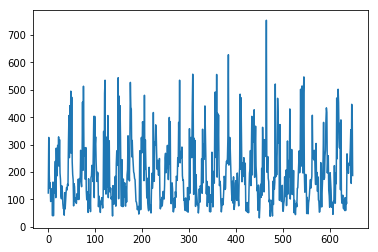

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[23198.248598777012, 27000.345705038897, 29580.785132735018]
(array([531., 535.]), array([ 18., 398.]), array([-13., 463.]), 354.0)
(array([162., 163.]), array([ 52., 440.]), array([-13., 463.]), 158.0)
(array([224., 228.]), array([  9., 416.]), array([-13., 461.]), 447.0)
(array([441., 452.]), array([ 12., 412.]), array([-14., 462.]), 429.0)
(array([0., 0.]), array([  2., 394.]), array([-13., 460.]), 187.0)
(0.0, 0.6, 1.0)


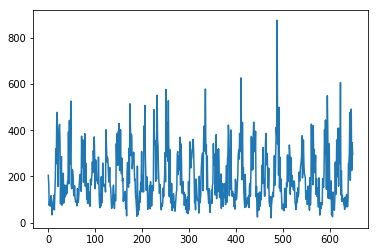

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[39338.540656574354, 28750.927978099568, 31575.77878621946]
(array([422., 425.]), array([ 81., 506.]), array([-17., 462.]), 373.0)
(array([498., 503.]), array([-24., 372.]), array([-17., 463.]), 491.0)
(array([152., 155.]), array([ 30., 408.]), array([-17., 463.]), 226.0)
(array([28., 28.]), array([ -1., 373.]), array([-17., 464.]), 346.0)
(array([0., 0.]), array([ -3., 384.]), array([-17., 463.]), 296.0)
(0.0, 0.8, 0.8)


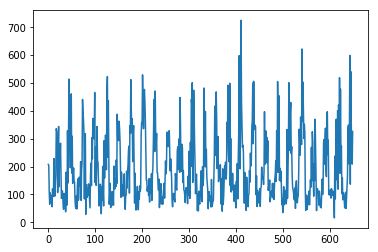

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[65893.94617498569, 7272.520552663074, 18640.9799792115]
(array([231., 233.]), array([237., 653.]), array([ -7., 578.]), 541.0)
(array([667., 674.]), array([ 50., 463.]), array([ -8., 579.]), 362.0)
(array([251., 254.]), array([154., 539.]), array([ -8., 577.]), 247.0)
(array([28., 28.]), array([ 92., 459.]), array([ -7., 580.]), 209.0)
(array([0., 0.]), array([114., 493.]), array([ -7., 580.]), 326.0)
(0.0, 1.0, 1.0)


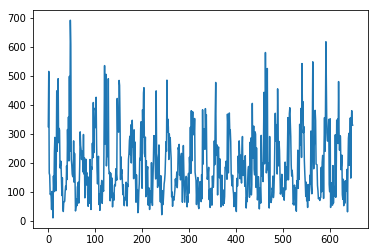

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[90179.77794472894, 9924.693521625722, 14475.100918310538]
(array([218., 220.]), array([100., 485.]), array([ -9., 479.]), 148.0)
(array([525., 530.]), array([ 95., 476.]), array([ -8., 478.]), 328.0)
(array([59., 60.]), array([ 72., 457.]), array([ -8., 477.]), 380.0)
(array([766., 786.]), array([ 76., 437.]), array([ -8., 477.]), 335.0)
(array([0., 0.]), array([ 42., 440.]), array([ -8., 480.]), 330.0)
(0.0, 1.0, 1.0)


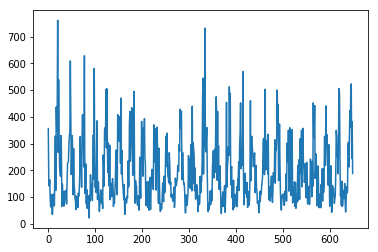

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[15179.410628773618, 34646.477663022386, 46891.57584944697]
(array([336., 338.]), array([ 59., 469.]), array([-11., 457.]), 506.0)
(array([588., 594.]), array([ 37., 427.]), array([-11., 455.]), 523.0)
(array([276., 281.]), array([ 26., 433.]), array([-11., 455.]), 244.0)
(array([455., 466.]), array([  7., 416.]), array([-11., 455.]), 382.0)
(array([0., 0.]), array([  1., 413.]), array([-11., 455.]), 188.0)
(0.0, 0.6, 0.6)


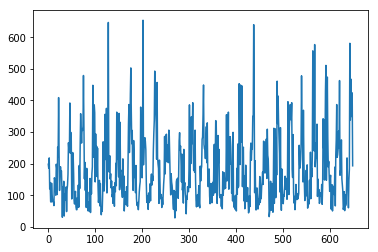

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[110721.97622647675, 6589.873138659141, 16920.42612043736]
(array([350., 353.]), array([219., 594.]), array([ -1., 570.]), 468.0)
(array([108., 109.]), array([169., 562.]), array([ -1., 569.]), 349.0)
(array([138., 140.]), array([163., 550.]), array([ -1., 567.]), 404.0)
(array([1024., 1049.]), array([141., 527.]), array([ -1., 567.]), 424.0)
(array([0., 0.]), array([134., 511.]), array([ -1., 568.]), 193.0)
(0.0, 1.0, 1.0)


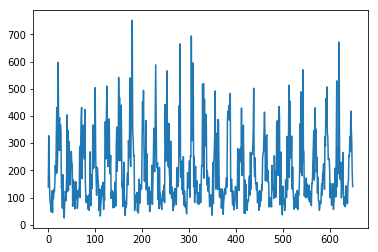

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[55207.04843922097, 6730.421249835932, 15551.784286242944]
(array([143., 144.]), array([123., 539.]), array([-11., 505.]), 418.0)
(array([128., 129.]), array([104., 511.]), array([-10., 508.]), 359.0)
(array([15., 15.]), array([ 78., 504.]), array([-10., 506.]), 314.0)
(array([0., 0.]), array([ 60., 487.]), array([-10., 507.]), 196.0)
(array([0., 0.]), array([ 44., 474.]), array([-10., 508.]), 140.0)
(0.0, 1.0, 1.0)


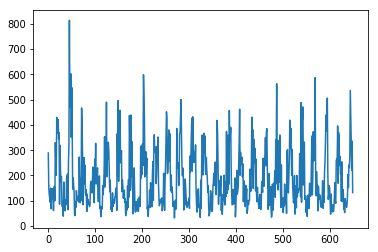

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[151824.20932785384, 46831.91120220507, 19994.119043749582]
(array([462., 465.]), array([279., 689.]), array([ 16., 710.]), 428.0)
(array([458., 463.]), array([312., 752.]), array([ 16., 710.]), 326.0)
(array([556., 564.]), array([287., 686.]), array([ 16., 710.]), 221.0)
(array([1101., 1128.]), array([272., 679.]), array([ 16., 709.]), 336.0)
(array([0., 0.]), array([254., 650.]), array([ 16., 712.]), 132.0)
(0.0, 0.6, 1.0)


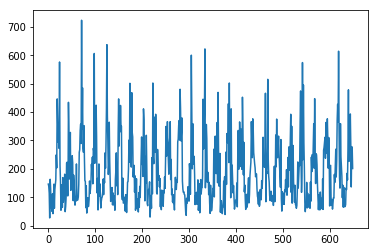

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[16585.503524723932, 19268.44228983905, 5095.620035634277]
(array([400., 403.]), array([168., 565.]), array([  2., 564.]), 288.0)
(array([97., 98.]), array([179., 587.]), array([  2., 564.]), 136.0)
(array([177., 180.]), array([161., 546.]), array([  2., 563.]), 278.0)
(array([136., 140.]), array([147., 546.]), array([  3., 564.]), 273.0)
(array([0., 0.]), array([145., 519.]), array([  2., 565.]), 201.0)
(0.0, 0.8, 1.0)


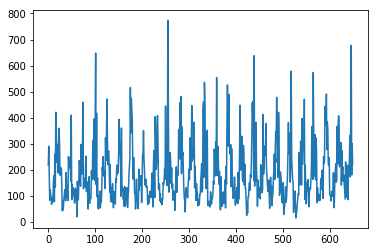

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81526.00105781149, 46474.2720837028, 46343.184102707455]
(array([115., 116.]), array([ 78., 480.]), array([-13., 657.]), 417.0)
(array([1087., 1099.]), array([ 41., 429.]), array([-13., 659.]), 678.0)
(array([12., 12.]), array([ 41., 427.]), array([-13., 657.]), 181.0)
(array([42., 43.]), array([ 34., 414.]), array([-13., 655.]), 301.0)
(array([0., 0.]), array([ 16., 413.]), array([-14., 656.]), 222.0)
(0.0, 0.8, 0.8)


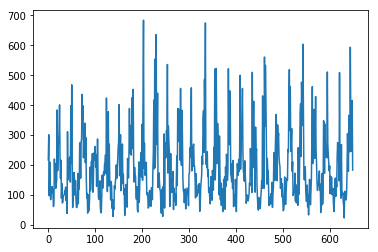

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[149908.0107156947, 49029.94736844903, 13094.061458495571]
(array([257., 259.]), array([263., 700.]), array([ -4., 723.]), 349.0)
(array([144., 146.]), array([349., 767.]), array([ -4., 724.]), 246.0)
(array([337., 343.]), array([312., 713.]), array([ -4., 724.]), 324.0)
(array([1235., 1268.]), array([298., 696.]), array([ -4., 723.]), 416.0)
(array([0., 0.]), array([275., 694.]), array([ -4., 723.]), 183.0)
(0.0, 0.6, 1.0)


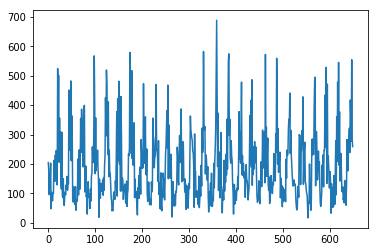

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[217310.77143410285, 15639.13407832857, 19812.325528352965]
(array([296., 298.]), array([116., 493.]), array([  0., 547.]), 361.0)
(array([281., 284.]), array([198., 578.]), array([ -0., 546.]), 278.0)
(array([9., 9.]), array([132., 497.]), array([ -0., 547.]), 554.0)
(array([797., 816.]), array([147., 558.]), array([ -0., 545.]), 285.0)
(array([ 886., 1081.]), array([118., 510.]), array([ -0., 547.]), 259.0)
(0.0, 0.8, 0.8)


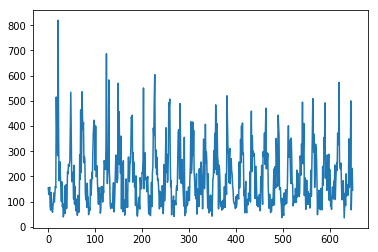

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[14430.203771537397, 21796.180543974624, 24786.803207789526]
(array([400., 403.]), array([  7., 399.]), array([-17., 416.]), 500.0)
(array([46., 46.]), array([ 34., 400.]), array([-17., 414.]), 67.0)
(array([337., 342.]), array([ 26., 381.]), array([-17., 414.]), 160.0)
(array([136., 140.]), array([  4., 391.]), array([-18., 416.]), 232.0)
(array([0., 0.]), array([-13., 366.]), array([-17., 416.]), 145.0)
(0.0, 0.8, 0.8)


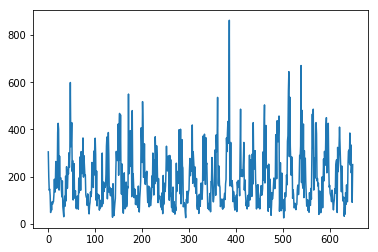

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26292.662872898305, 7997.762631250691, 6258.489303031366]
(array([437., 441.]), array([129., 533.]), array([ -5., 507.]), 335.0)
(array([75., 76.]), array([ 87., 501.]), array([ -5., 508.]), 216.0)
(array([101., 102.]), array([ 97., 485.]), array([ -5., 506.]), 245.0)
(array([220., 225.]), array([ 74., 463.]), array([ -5., 507.]), 91.0)
(array([0., 0.]), array([ 82., 468.]), array([ -5., 507.]), 251.0)
(0.0, 1.0, 1.0)


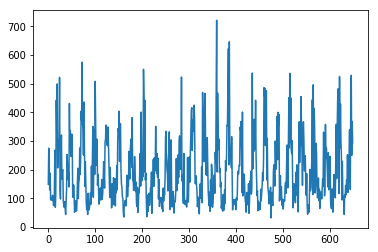

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[63936.30484097234, 45357.9395615628, 59408.500205827215]
(array([425., 428.]), array([ 56., 455.]), array([-16., 435.]), 469.0)
(array([161., 163.]), array([-25., 370.]), array([-16., 432.]), 529.0)
(array([11., 11.]), array([ -3., 399.]), array([-16., 432.]), 250.0)
(array([166., 170.]), array([-23., 380.]), array([-16., 433.]), 368.0)
(array([0., 0.]), array([ -8., 357.]), array([-17., 434.]), 293.0)
(0.0, 0.6, 0.6)


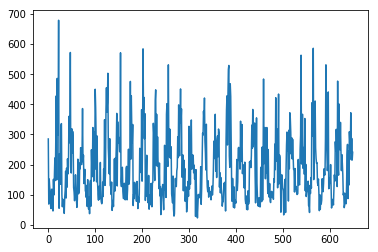

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[38461.94556727004, 3676.413697402936, 7244.938201083591]
(array([527., 531.]), array([ 51., 449.]), array([ -7., 480.]), 372.0)
(array([212., 214.]), array([ 53., 429.]), array([ -7., 478.]), 216.0)
(array([544., 552.]), array([ 36., 424.]), array([ -7., 481.]), 287.0)
(array([11., 12.]), array([ 17., 422.]), array([ -7., 479.]), 215.0)
(array([0., 0.]), array([ 14., 417.]), array([ -8., 479.]), 241.0)
(0.0, 1.0, 1.0)


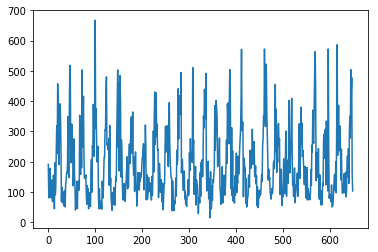

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[63507.2657605974, 26761.010734114698, 41908.74296027297]
(array([488., 492.]), array([121., 493.]), array([-12., 482.]), 504.0)
(array([143., 144.]), array([100., 466.]), array([-12., 479.]), 413.0)
(array([18., 19.]), array([ 75., 434.]), array([-12., 479.]), 477.0)
(array([5., 5.]), array([ 66., 430.]), array([-12., 481.]), 160.0)
(array([0., 0.]), array([ 43., 428.]), array([-12., 480.]), 103.0)
(0.0, 0.6, 0.8)


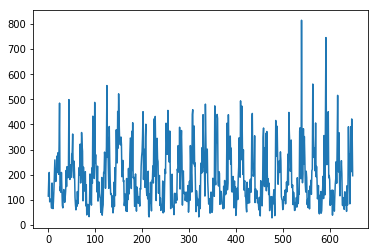

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[148111.8202397285, 20891.78288297391, 23503.439220190514]
(array([96., 97.]), array([ 15., 425.]), array([-17., 498.]), 391.0)
(array([18., 18.]), array([ 39., 454.]), array([-17., 498.]), 212.0)
(array([1135., 1152.]), array([ -2., 392.]), array([-17., 498.]), 422.0)
(array([119., 122.]), array([ -5., 399.]), array([-17., 499.]), 359.0)
(array([0., 0.]), array([-29., 358.]), array([-17., 499.]), 196.0)
(0.0, 0.8, 1.0)


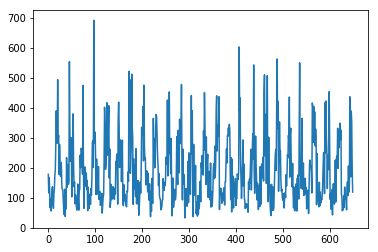

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40012.63234262491, 36377.05615767064, 15871.388997132075]
(array([98., 99.]), array([234., 634.]), array([ -3., 614.]), 169.0)
(array([747., 755.]), array([218., 599.]), array([ -3., 613.]), 388.0)
(array([223., 226.]), array([213., 593.]), array([ -3., 612.]), 352.0)
(array([11., 12.]), array([198., 581.]), array([ -3., 614.]), 193.0)
(array([0., 0.]), array([191., 570.]), array([ -3., 612.]), 118.0)
(0.0, 0.4, 1.0)


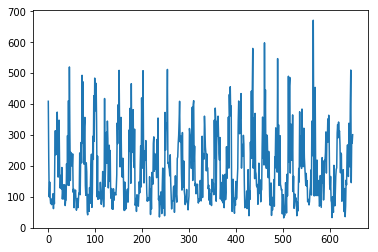

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50904.19776872309, 16155.170705754912, 15392.019483516811]
(array([714., 719.]), array([ 88., 478.]), array([ -8., 587.]), 510.0)
(array([254., 257.]), array([123., 510.]), array([ -8., 588.]), 146.0)
(array([480., 488.]), array([105., 479.]), array([ -8., 587.]), 291.0)
(array([6., 6.]), array([ 90., 464.]), array([ -8., 589.]), 274.0)
(array([0., 0.]), array([ 80., 437.]), array([ -8., 588.]), 301.0)
(0.0, 0.8, 1.0)


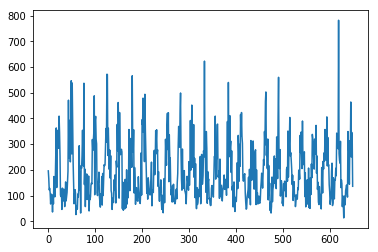

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[80283.95231316169, 15653.831682990243, 15492.59778960895]
(array([665., 670.]), array([ 47., 414.]), array([-11., 554.]), 464.0)
(array([255., 258.]), array([ 62., 455.]), array([-11., 553.]), 250.0)
(array([861., 873.]), array([ 51., 420.]), array([-11., 553.]), 346.0)
(array([65., 67.]), array([ 57., 417.]), array([-11., 554.]), 331.0)
(array([0., 0.]), array([ 31., 393.]), array([-11., 554.]), 136.0)
(0.0, 0.8, 1.0)


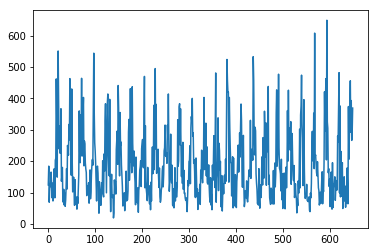

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81959.78715014752, 15796.530562270776, 3143.6407076048754]
(array([462., 466.]), array([236., 623.]), array([ 17., 655.]), 292.0)
(array([815., 825.]), array([296., 685.]), array([ 16., 653.]), 393.0)
(array([20., 20.]), array([242., 622.]), array([ 17., 656.]), 266.0)
(array([322., 330.]), array([255., 638.]), array([ 17., 654.]), 293.0)
(array([0., 0.]), array([223., 610.]), array([ 16., 655.]), 369.0)
(0.0, 1.0, 1.0)


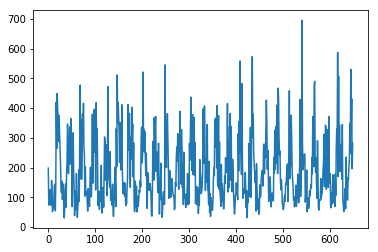

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[30654.142446389178, 51343.66123421933, 45489.76895104003]
(array([669., 674.]), array([ -5., 393.]), array([-23., 551.]), 530.0)
(array([161., 163.]), array([-53., 313.]), array([-23., 550.]), 336.0)
(array([309., 314.]), array([-39., 351.]), array([-23., 552.]), 431.0)
(array([ 99., 102.]), array([-57., 328.]), array([-24., 552.]), 196.0)
(array([0., 0.]), array([-60., 306.]), array([-23., 550.]), 282.0)
(0.0, 0.4, 1.0)


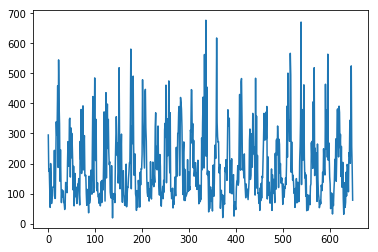

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64096.098484874856, 42154.053881929955, 55421.09092217685]
(array([62., 62.]), array([-99., 292.]), array([-40., 326.]), 320.0)
(array([131., 132.]), array([-54., 353.]), array([-40., 325.]), 525.0)
(array([0., 0.]), array([-98., 319.]), array([-39., 326.]), 256.0)
(array([20., 21.]), array([-83., 327.]), array([-39., 324.]), 186.0)
(array([0., 0.]), array([-81., 311.]), array([-40., 325.]), 78.0)
(0.0, 0.6, 0.8)


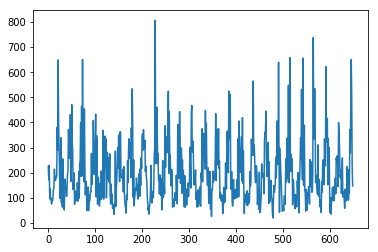

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[147127.42925682775, 41009.48032859231, 72385.49123489314]
(array([6., 6.]), array([123., 539.]), array([ -9., 508.]), 482.0)
(array([128., 130.]), array([ 97., 517.]), array([ -9., 508.]), 651.0)
(array([92., 94.]), array([ 67., 495.]), array([ -9., 510.]), 507.0)
(array([12., 12.]), array([ 61., 479.]), array([ -9., 510.]), 221.0)
(array([0., 0.]), array([ 41., 459.]), array([ -9., 508.]), 147.0)
(0.0, 0.6, 0.8)


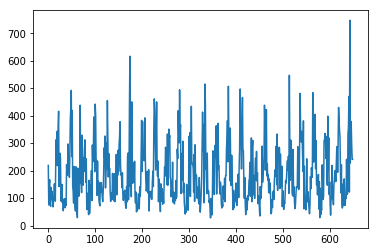

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[97943.47478706177, 2476.6397280446017, 6439.9078613528845]
(array([126., 127.]), array([193., 561.]), array([ -5., 531.]), 380.0)
(array([407., 412.]), array([111., 487.]), array([ -5., 530.]), 367.0)
(array([305., 310.]), array([144., 507.]), array([ -5., 531.]), 292.0)
(array([836., 856.]), array([121., 483.]), array([ -5., 529.]), 241.0)
(array([0., 0.]), array([129., 480.]), array([ -5., 530.]), 241.0)
(0.0, 1.0, 1.0)


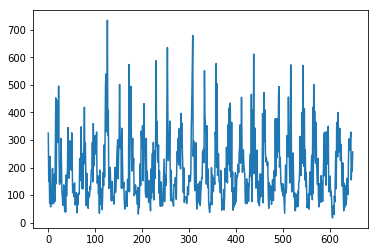

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32018.39022420445, 9070.161013738709, 3735.832856709044]
(array([468., 472.]), array([110., 502.]), array([ -9., 509.]), 329.0)
(array([97., 98.]), array([133., 517.]), array([ -9., 509.]), 155.0)
(array([15., 15.]), array([115., 506.]), array([ -8., 509.]), 204.0)
(array([0., 0.]), array([ 94., 476.]), array([ -8., 509.]), 187.0)
(array([0., 0.]), array([ 92., 476.]), array([ -8., 510.]), 257.0)
(0.0, 1.0, 1.0)


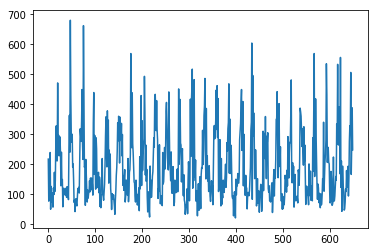

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[226901.97338817417, 13165.178764203229, 19836.11527480515]
(array([230., 232.]), array([138., 532.]), array([ -7., 517.]), 506.0)
(array([236., 238.]), array([129., 523.]), array([ -7., 516.]), 166.0)
(array([129., 131.]), array([120., 490.]), array([ -7., 515.]), 265.0)
(array([1358., 1392.]), array([103., 478.]), array([ -7., 516.]), 388.0)
(array([0., 0.]), array([ 96., 479.]), array([ -7., 517.]), 248.0)
(0.0, 1.0, 1.0)


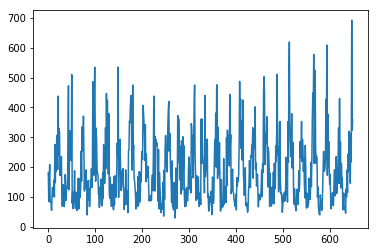

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40270.85976181686, 55221.72463169989, 61873.47900253146]
(array([299., 302.]), array([ 68., 441.]), array([-12., 431.]), 313.0)
(array([413., 417.]), array([ 12., 387.]), array([-12., 430.]), 218.0)
(array([835., 849.]), array([ 27., 389.]), array([-12., 430.]), 692.0)
(array([213., 218.]), array([ 16., 377.]), array([-12., 431.]), 323.0)
(array([0., 0.]), array([  9., 363.]), array([-12., 431.]), 358.0)
(0.0, 0.8, 0.8)


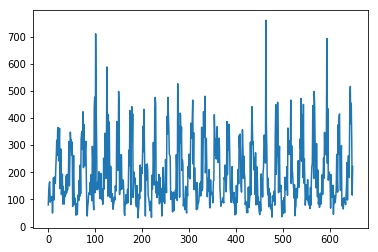

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44300.49061695778, 67788.61296763309, 31059.971342532466]
(array([193., 195.]), array([342., 770.]), array([ 40., 757.]), 379.0)
(array([756., 763.]), array([338., 750.]), array([ 39., 755.]), 454.0)
(array([115., 116.]), array([332., 743.]), array([ 39., 757.]), 327.0)
(array([128., 131.]), array([322., 748.]), array([ 39., 754.]), 116.0)
(array([0., 0.]), array([294., 699.]), array([ 40., 755.]), 221.0)
(0.0, 0.4, 1.0)


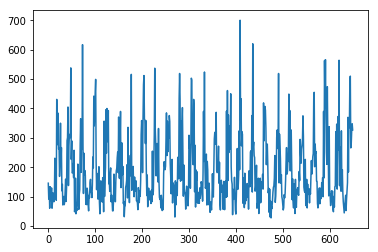

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[82200.57170086505, 5606.904903123776, 2518.3636590037936]
(array([361., 363.]), array([222., 629.]), array([ -1., 577.]), 266.0)
(array([217., 219.]), array([ 94., 513.]), array([ -0., 577.]), 280.0)
(array([370., 376.]), array([150., 547.]), array([  0., 577.]), 327.0)
(array([875., 896.]), array([103., 502.]), array([ -0., 579.]), 348.0)
(array([0., 0.]), array([136., 527.]), array([ -0., 577.]), 327.0)
(0.0, 1.0, 1.0)


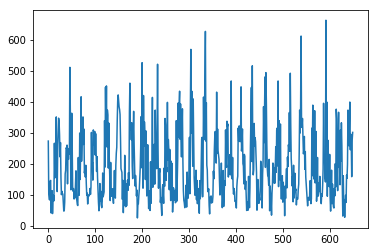

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[42717.71964189103, 3073.4731057335016, 5584.747431103186]
(array([292., 294.]), array([112., 489.]), array([ -9., 467.]), 295.0)
(array([447., 452.]), array([ 61., 436.]), array([ -9., 466.]), 266.0)
(array([317., 321.]), array([ 57., 443.]), array([ -9., 467.]), 158.0)
(array([523., 535.]), array([ 38., 421.]), array([-10., 466.]), 277.0)
(array([0., 0.]), array([ 22., 428.]), array([ -9., 467.]), 301.0)
(0.0, 1.0, 1.0)


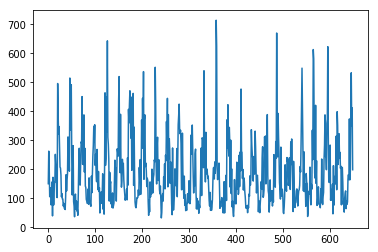

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[121373.83174396702, 83336.95423912746, 47965.85307462962]
(array([554., 558.]), array([-60., 305.]), array([-22., 474.]), 396.0)
(array([250., 253.]), array([-68., 297.]), array([-22., 476.]), 533.0)
(array([916., 929.]), array([-73., 276.]), array([-22., 473.]), 351.0)
(array([42., 43.]), array([-69., 290.]), array([-22., 476.]), 412.0)
(array([0., 0.]), array([-85., 272.]), array([-22., 476.]), 199.0)
(0.0, 0.2, 0.8)


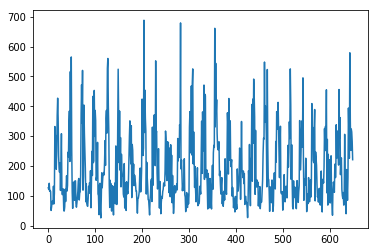

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[57666.7171653637, 10549.398693875668, 1483.3283152676845]
(array([373., 376.]), array([242., 649.]), array([ -7., 596.]), 252.0)
(array([150., 151.]), array([131., 517.]), array([ -7., 597.]), 324.0)
(array([700., 711.]), array([189., 555.]), array([ -6., 598.]), 314.0)
(array([78., 80.]), array([119., 517.]), array([ -7., 599.]), 282.0)
(array([0., 0.]), array([118., 522.]), array([ -7., 596.]), 221.0)
(0.0, 1.0, 1.0)


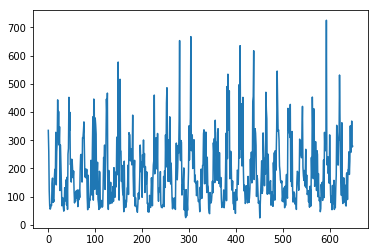

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[116827.220885335, 2484.994479227084, 5700.081081328328]
(array([41., 42.]), array([ 80., 491.]), array([ -9., 502.]), 257.0)
(array([114., 115.]), array([114., 524.]), array([ -9., 503.]), 283.0)
(array([956., 972.]), array([ 77., 486.]), array([ -9., 499.]), 368.0)
(array([0., 0.]), array([ 61., 461.]), array([-10., 501.]), 276.0)
(array([0., 0.]), array([ 36., 443.]), array([ -9., 501.]), 279.0)
(0.0, 1.0, 1.0)


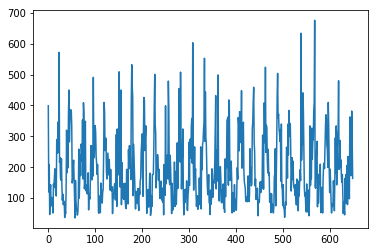

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[29375.383556945228, 15243.71781866189, 6756.497798069735]
(array([244., 246.]), array([167., 549.]), array([ -7., 543.]), 211.0)
(array([31., 31.]), array([156., 553.]), array([ -7., 542.]), 173.0)
(array([259., 263.]), array([155., 544.]), array([ -7., 543.]), 382.0)
(array([0., 0.]), array([115., 512.]), array([ -7., 542.]), 290.0)
(array([0., 0.]), array([115., 506.]), array([ -7., 543.]), 164.0)
(0.0, 1.0, 1.0)


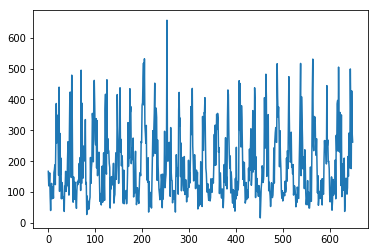

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[23821.040205886395, 65440.23168877142, 38857.903087365194]
(array([521., 525.]), array([-97., 283.]), array([-36., 436.]), 362.0)
(array([29., 30.]), array([-134.,  239.]), array([-36., 438.]), 176.0)
(array([417., 424.]), array([-131.,  242.]), array([-37., 437.]), 428.0)
(array([232., 237.]), array([-117.,  244.]), array([-36., 437.]), 291.0)
(array([0., 0.]), array([-138.,  236.]), array([-36., 435.]), 262.0)
(0.0, 0.2, 1.0)


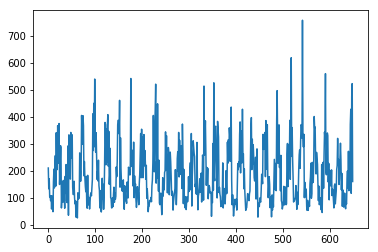

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[279132.1377664703, 31812.383931712073, 38239.95955584849]
(array([374., 376.]), array([102., 495.]), array([ -7., 498.]), 429.0)
(array([211., 214.]), array([140., 509.]), array([ -7., 499.]), 117.0)
(array([23., 24.]), array([112., 470.]), array([ -6., 501.]), 476.0)
(array([1578., 1616.]), array([111., 462.]), array([ -7., 500.]), 524.0)
(array([0., 0.]), array([ 74., 455.]), array([ -7., 499.]), 161.0)
(0.0, 0.4, 0.8)


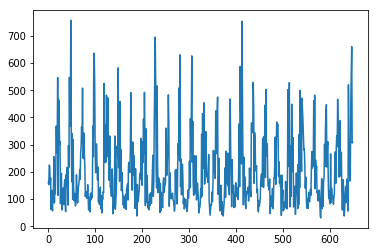

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[190211.16443088857, 110021.41711734554, 60475.62483737251]
(array([651., 655.]), array([-53., 382.]), array([-14., 611.]), 455.0)
(array([130., 131.]), array([-56., 369.]), array([-14., 611.]), 562.0)
(array([1433., 1453.]), array([-52., 365.]), array([-14., 610.]), 660.0)
(array([426., 437.]), array([-62., 360.]), array([-14., 611.]), 306.0)
(array([0., 0.]), array([-74., 364.]), array([-14., 611.]), 310.0)
(0.0, 0.4, 0.8)


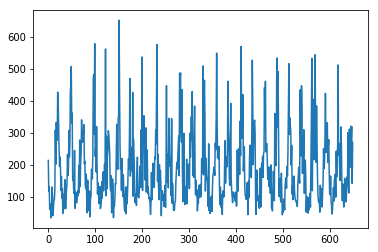

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31219.746211026435, 7469.30858000321, 12979.224882596274]
(array([304., 306.]), array([ 38., 421.]), array([-14., 418.]), 320.0)
(array([526., 532.]), array([ 20., 402.]), array([-15., 419.]), 282.0)
(array([253., 257.]), array([ -3., 391.]), array([-15., 418.]), 319.0)
(array([6., 6.]), array([ 13., 372.]), array([-14., 418.]), 141.0)
(array([0., 0.]), array([-15., 361.]), array([-15., 418.]), 269.0)
(0.0, 1.0, 1.0)


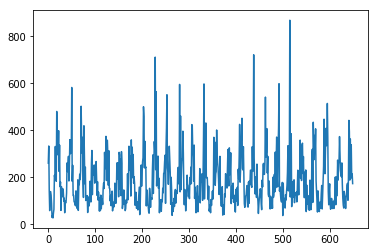

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[30718.273140558635, 2410.1712197519287, 6026.389612195383]
(array([283., 286.]), array([ 44., 458.]), array([-16., 442.]), 198.0)
(array([35., 36.]), array([ 31., 464.]), array([-16., 443.]), 339.0)
(array([84., 86.]), array([ 33., 427.]), array([-16., 445.]), 199.0)
(array([110., 113.]), array([ 24., 422.]), array([-16., 442.]), 215.0)
(array([0., 0.]), array([ 11., 412.]), array([-16., 444.]), 174.0)
(0.0, 1.0, 1.0)


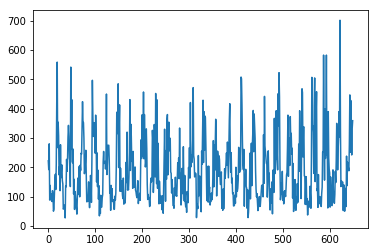

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[101787.9715866183, 5554.703487111772, 17441.338112342368]
(array([170., 171.]), array([152., 534.]), array([ -9., 497.]), 428.0)
(array([28., 28.]), array([108., 479.]), array([ -9., 497.]), 330.0)
(array([573., 582.]), array([104., 475.]), array([ -9., 500.]), 242.0)
(array([0., 0.]), array([ 69., 448.]), array([ -9., 498.]), 332.0)
(array([0., 0.]), array([ 53., 438.]), array([ -8., 498.]), 359.0)
(0.0, 1.0, 1.0)


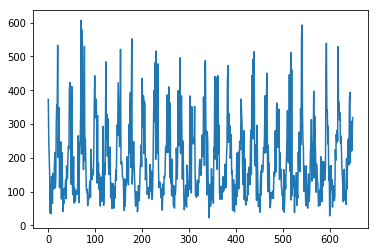

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[69426.75569247076, 28304.489394999342, 26821.525284772586]
(array([268., 270.]), array([-88., 303.]), array([-20., 332.]), 296.0)
(array([230., 233.]), array([-52., 318.]), array([-20., 331.]), 308.0)
(array([26., 27.]), array([-79., 315.]), array([-21., 330.]), 220.0)
(array([710., 727.]), array([-77., 303.]), array([-21., 332.]), 269.0)
(array([0., 0.]), array([-70., 284.]), array([-21., 332.]), 319.0)
(0.0, 0.8, 1.0)


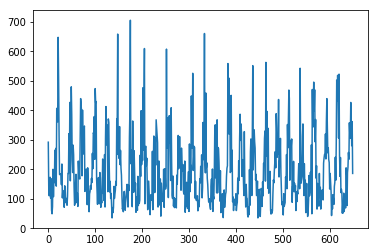

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[60436.07490584934, 4745.394419730186, 10357.817755887856]
(array([624., 629.]), array([142., 565.]), array([ -5., 561.]), 427.0)
(array([117., 119.]), array([141., 555.]), array([ -5., 559.]), 364.0)
(array([18., 19.]), array([133., 517.]), array([ -5., 560.]), 280.0)
(array([47., 48.]), array([133., 505.]), array([ -5., 560.]), 362.0)
(array([0., 0.]), array([ 94., 521.]), array([ -5., 559.]), 186.0)
(0.0, 1.0, 1.0)


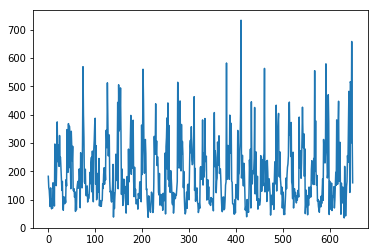

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[118432.84769862641, 41016.5441391864, 56573.86350739312]
(array([317., 319.]), array([ 93., 498.]), array([ -7., 508.]), 510.0)
(array([238., 240.]), array([135., 532.]), array([ -7., 506.]), 300.0)
(array([49., 50.]), array([ 90., 478.]), array([ -6., 508.]), 658.0)
(array([709., 725.]), array([ 93., 461.]), array([ -7., 508.]), 322.0)
(array([0., 0.]), array([ 55., 459.]), array([ -7., 508.]), 159.0)
(0.0, 0.6, 0.6)


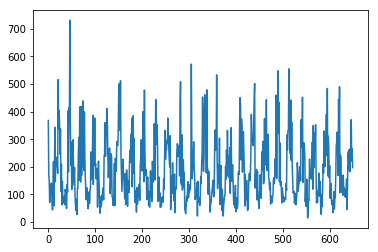

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[77441.15603365863, 10845.983355874363, 16970.646481798107]
(array([196., 198.]), array([-44., 342.]), array([-16., 380.]), 257.0)
(array([102., 103.]), array([ 14., 405.]), array([-16., 381.]), 371.0)
(array([664., 675.]), array([-36., 345.]), array([-16., 381.]), 220.0)
(array([0., 0.]), array([-25., 384.]), array([-16., 380.]), 266.0)
(array([0., 0.]), array([-52., 334.]), array([-16., 381.]), 197.0)
(0.0, 1.0, 1.0)


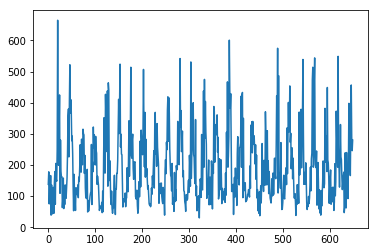

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32062.278442828923, 61920.381580887784, 42396.68902873254]
(array([321., 323.]), array([-85., 309.]), array([-27., 360.]), 323.0)
(array([478., 483.]), array([-123.,  251.]), array([-26., 359.]), 457.0)
(array([3., 3.]), array([-124.,  279.]), array([-26., 360.]), 288.0)
(array([232., 238.]), array([-123.,  259.]), array([-27., 359.]), 246.0)
(array([0., 0.]), array([-127.,  254.]), array([-27., 360.]), 280.0)
(0.2, 0.2, 0.8)


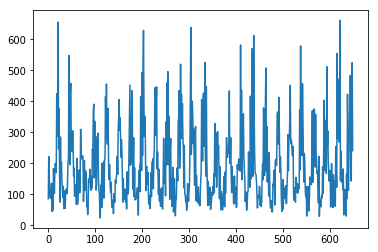

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[1124725.8073496332, 35844.36097159986, 21511.145522829134]
(array([559., 563.]), array([299., 701.]), array([ 11., 699.]), 390.0)
(array([35., 35.]), array([297., 714.]), array([ 11., 698.]), 143.0)
(array([908., 920.]), array([263., 655.]), array([ 12., 698.]), 452.0)
(array([2797., 2864.]), array([245., 663.]), array([ 11., 697.]), 525.0)
(array([0., 0.]), array([220., 628.]), array([ 11., 697.]), 241.0)
(0.0, 0.8, 1.0)


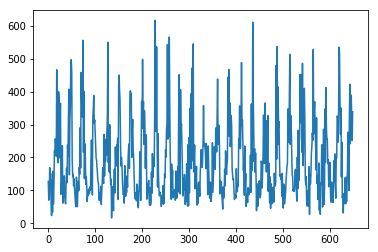

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81775.2234843016, 33384.108408497705, 18590.948711522873]
(array([423., 426.]), array([-45., 327.]), array([-11., 438.]), 337.0)
(array([637., 643.]), array([-12., 377.]), array([-12., 436.]), 390.0)
(array([722., 732.]), array([-48., 319.]), array([-12., 436.]), 323.0)
(array([6., 6.]), array([-49., 343.]), array([-11., 436.]), 252.0)
(array([0., 0.]), array([-34., 316.]), array([-12., 436.]), 339.0)
(0.0, 0.2, 1.0)


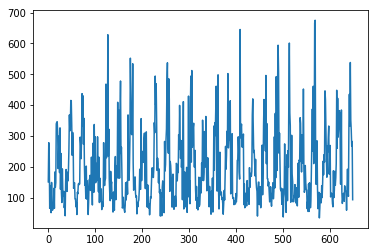

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18844.811354070953, 33398.38352831766, 27507.761492802027]
(array([383., 386.]), array([-77., 343.]), array([-31., 371.]), 351.0)
(array([34., 35.]), array([-100.,  314.]), array([-30., 372.]), 319.0)
(array([304., 309.]), array([-105.,  313.]), array([-30., 371.]), 267.0)
(array([324., 331.]), array([-151.,  300.]), array([-30., 371.]), 282.0)
(array([0., 0.]), array([-142.,  276.]), array([-30., 371.]), 93.0)
(0.0, 0.6, 1.0)


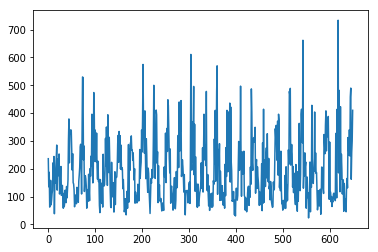

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64302.599594669184, 21463.010425447952, 15404.812837236517]
(array([224., 226.]), array([147., 572.]), array([ -5., 590.]), 490.0)
(array([299., 302.]), array([219., 628.]), array([ -5., 589.]), 162.0)
(array([6., 6.]), array([131., 557.]), array([ -5., 589.]), 259.0)
(array([287., 294.]), array([178., 574.]), array([ -5., 587.]), 300.0)
(array([0., 0.]), array([136., 547.]), array([ -5., 589.]), 410.0)
(0.0, 0.8, 1.0)


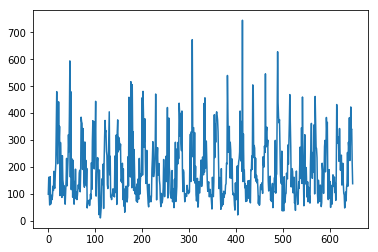

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[105086.76395254955, 37401.88295328465, 30884.902325259638]
(array([523., 527.]), array([-57., 318.]), array([-27., 445.]), 423.0)
(array([93., 95.]), array([-48., 295.]), array([-27., 446.]), 338.0)
(array([18., 18.]), array([-67., 310.]), array([-27., 446.]), 341.0)
(array([783., 803.]), array([-76., 318.]), array([-28., 445.]), 216.0)
(array([0., 0.]), array([-94., 300.]), array([-27., 444.]), 138.0)
(0.0, 0.4, 1.0)


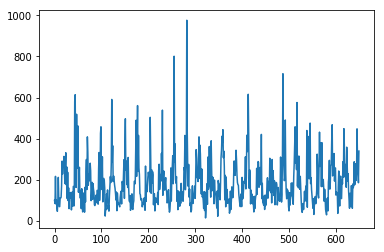

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[55046.9759311256, 16439.221959355596, 19966.90987102936]
(array([362., 365.]), array([ 21., 423.]), array([-14., 430.]), 448.0)
(array([451., 456.]), array([ 35., 416.]), array([-14., 430.]), 304.0)
(array([549., 557.]), array([ 13., 407.]), array([-13., 433.]), 244.0)
(array([0., 0.]), array([-19., 402.]), array([-13., 432.]), 186.0)
(array([0., 0.]), array([ -5., 396.]), array([-13., 433.]), 340.0)
(0.0, 0.8, 0.8)


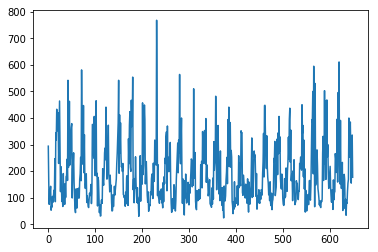

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47539.874554522146, 4986.701598848515, 11589.857599736317]
(array([86., 86.]), array([ 63., 446.]), array([-18., 418.]), 283.0)
(array([256., 259.]), array([ 23., 396.]), array([-18., 417.]), 155.0)
(array([49., 50.]), array([ 27., 401.]), array([-18., 418.]), 269.0)
(array([6., 6.]), array([ 22., 384.]), array([-18., 417.]), 336.0)
(array([0., 0.]), array([ -9., 400.]), array([-18., 417.]), 177.0)
(0.0, 1.0, 1.0)


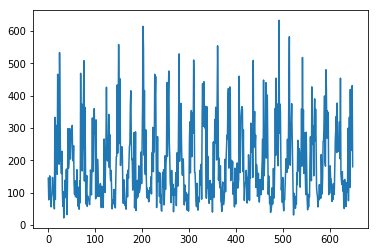

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[55257.10270017886, 7775.368291376086, 14207.57827866223]
(array([283., 285.]), array([ 27., 418.]), array([-10., 485.]), 230.0)
(array([518., 524.]), array([104., 523.]), array([ -9., 488.]), 291.0)
(array([408., 414.]), array([ 30., 455.]), array([ -9., 488.]), 327.0)
(array([5., 6.]), array([ 79., 469.]), array([ -9., 487.]), 431.0)
(array([0., 0.]), array([ 31., 437.]), array([ -9., 489.]), 180.0)
(0.0, 1.0, 1.0)


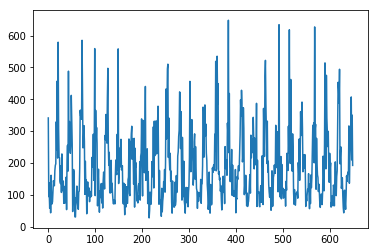

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32139.482225181175, 7972.851731367149, 16969.36930307655]
(array([288., 290.]), array([ 62., 447.]), array([-14., 443.]), 253.0)
(array([141., 142.]), array([ 67., 444.]), array([-14., 443.]), 407.0)
(array([97., 99.]), array([ 47., 431.]), array([-14., 443.]), 209.0)
(array([149., 153.]), array([ 36., 425.]), array([-14., 444.]), 350.0)
(array([0., 0.]), array([ 10., 404.]), array([-14., 443.]), 192.0)
(0.0, 1.0, 1.0)


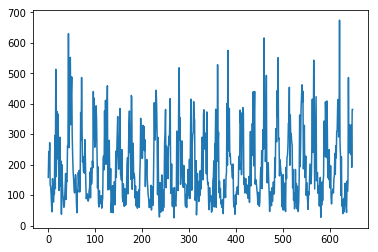

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[77211.89517456933, 10170.228251147459, 17537.80510891237]
(array([337., 340.]), array([ 81., 480.]), array([-12., 465.]), 233.0)
(array([21., 22.]), array([ 82., 454.]), array([-12., 467.]), 331.0)
(array([302., 307.]), array([ 59., 440.]), array([-12., 464.]), 191.0)
(array([33., 33.]), array([ 55., 434.]), array([-12., 466.]), 381.0)
(array([0., 0.]), array([ 56., 422.]), array([-13., 465.]), 381.0)
(0.0, 1.0, 1.0)


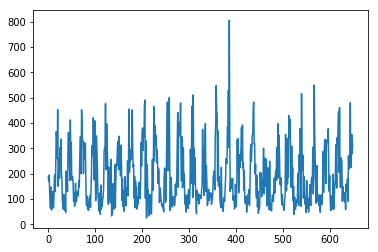

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26533.684623231326, 21837.82030009364, 24751.585672424982]
(array([277., 279.]), array([  9., 370.]), array([-22., 358.]), 224.0)
(array([240., 243.]), array([-58., 327.]), array([-22., 358.]), 235.0)
(array([187., 190.]), array([-44., 339.]), array([-22., 359.]), 355.0)
(array([229., 234.]), array([-47., 328.]), array([-22., 359.]), 279.0)
(array([0., 0.]), array([-79., 326.]), array([-22., 359.]), 316.0)
(0.0, 0.8, 1.0)


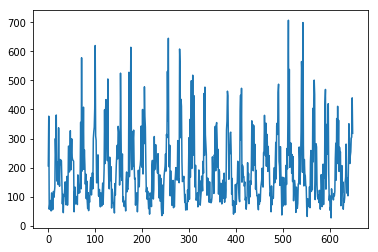

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[43114.06995951355, 27189.992404080556, 36091.374253464826]
(array([316., 318.]), array([ 11., 391.]), array([-16., 389.]), 254.0)
(array([150., 152.]), array([-20., 379.]), array([-16., 387.]), 301.0)
(array([144., 146.]), array([-29., 373.]), array([-16., 388.]), 305.0)
(array([188., 192.]), array([-18., 352.]), array([-16., 389.]), 440.0)
(array([0., 0.]), array([-34., 358.]), array([-16., 387.]), 318.0)
(0.0, 0.8, 0.8)


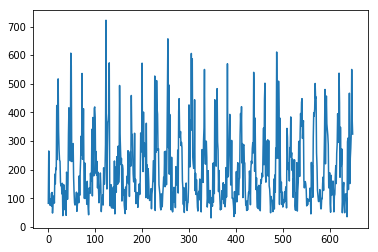

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[95636.48140236802, 65598.98885891832, 77275.33868212307]
(array([221., 223.]), array([-53., 364.]), array([-34., 343.]), 275.0)
(array([27., 27.]), array([-69., 345.]), array([-34., 344.]), 326.0)
(array([44., 45.]), array([-82., 345.]), array([-34., 344.]), 550.0)
(array([214., 219.]), array([-89., 343.]), array([-35., 344.]), 377.0)
(array([0., 0.]), array([-93., 311.]), array([-34., 343.]), 324.0)
(0.0, 0.4, 0.6)


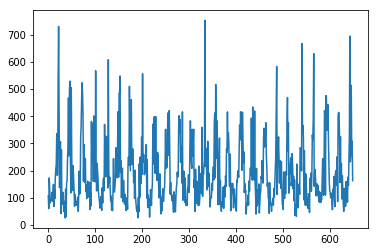

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[21047.682456989296, 19203.887368643715, 15348.849075066933]
(array([294., 297.]), array([186., 659.]), array([ -7., 593.]), 257.0)
(array([395., 399.]), array([ 77., 536.]), array([ -7., 593.]), 514.0)
(array([135., 137.]), array([122., 556.]), array([ -7., 593.]), 274.0)
(array([96., 98.]), array([ 91., 522.]), array([ -7., 594.]), 308.0)
(array([0., 0.]), array([ 69., 503.]), array([ -7., 592.]), 163.0)
(0.0, 1.0, 1.0)


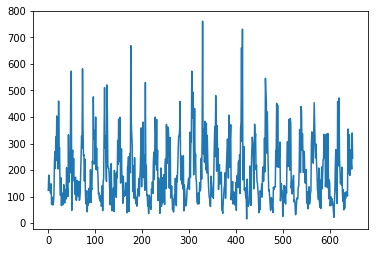

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[36418.177353922874, 7865.824317816169, 12417.904580299615]
(array([248., 250.]), array([ 15., 399.]), array([-20., 397.]), 276.0)
(array([429., 433.]), array([  6., 388.]), array([-20., 398.]), 227.0)
(array([121., 123.]), array([ -4., 390.]), array([-19., 397.]), 204.0)
(array([69., 71.]), array([-12., 359.]), array([-19., 398.]), 340.0)
(array([0., 0.]), array([-21., 368.]), array([-20., 398.]), 245.0)
(0.0, 1.0, 1.0)


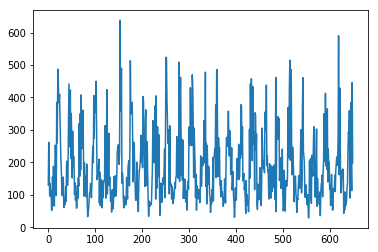

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[28240.967360359566, 23748.373518633478, 28361.136242087552]
(array([396., 399.]), array([  4., 368.]), array([-22., 393.]), 385.0)
(array([60., 60.]), array([ 32., 394.]), array([-22., 395.]), 179.0)
(array([69., 71.]), array([  7., 364.]), array([-23., 394.]), 113.0)
(array([152., 156.]), array([ -6., 355.]), array([-23., 393.]), 446.0)
(array([0., 0.]), array([-28., 354.]), array([-22., 394.]), 199.0)
(0.0, 0.6, 0.8)


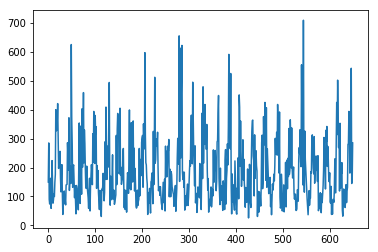

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[41199.18647764642, 43081.655848385686, 29081.5384260488]
(array([370., 372.]), array([-45., 354.]), array([-14., 483.]), 264.0)
(array([736., 744.]), array([-73., 321.]), array([-14., 482.]), 543.0)
(array([367., 372.]), array([-69., 328.]), array([-14., 483.]), 145.0)
(array([303., 310.]), array([-75., 302.]), array([-14., 482.]), 151.0)
(array([0., 0.]), array([-74., 312.]), array([-14., 482.]), 285.0)
(0.0, 0.8, 0.8)


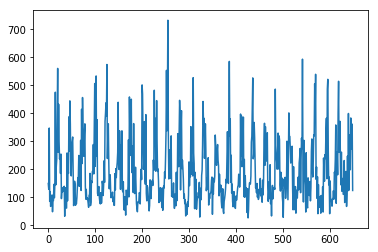

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[53835.38095521628, 11436.939281416391, 24646.804085448242]
(array([246., 248.]), array([ 57., 451.]), array([-17., 433.]), 383.0)
(array([120., 121.]), array([ 34., 426.]), array([-17., 435.]), 271.0)
(array([49., 50.]), array([ 31., 420.]), array([-17., 434.]), 337.0)
(array([0., 0.]), array([  1., 401.]), array([-17., 435.]), 361.0)
(array([0., 0.]), array([ -1., 403.]), array([-17., 436.]), 124.0)
(0.0, 1.0, 1.0)


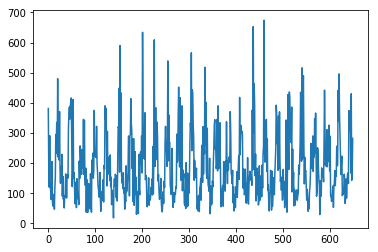

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34782.56355428364, 27883.0033674995, 14051.295981937912]
(array([246., 248.]), array([179., 579.]), array([ -5., 571.]), 167.0)
(array([675., 683.]), array([201., 576.]), array([ -5., 572.]), 430.0)
(array([56., 57.]), array([183., 558.]), array([ -5., 572.]), 143.0)
(array([17., 18.]), array([167., 549.]), array([ -5., 574.]), 153.0)
(array([0., 0.]), array([133., 515.]), array([ -5., 571.]), 282.0)
(0.0, 0.4, 1.0)


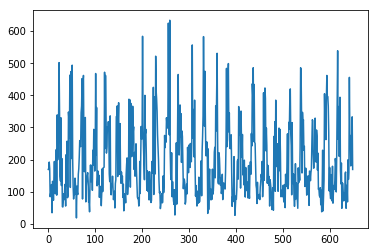

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[218463.5421920708, 5319.937051394762, 3636.964370572713]
(array([245., 247.]), array([109., 484.]), array([ -7., 484.]), 180.0)
(array([439., 443.]), array([103., 487.]), array([ -7., 485.]), 254.0)
(array([26., 26.]), array([ 62., 456.]), array([ -6., 484.]), 252.0)
(array([1304., 1335.]), array([ 70., 450.]), array([ -7., 485.]), 333.0)
(array([0., 0.]), array([ 64., 445.]), array([ -7., 484.]), 169.0)
(0.0, 1.0, 1.0)


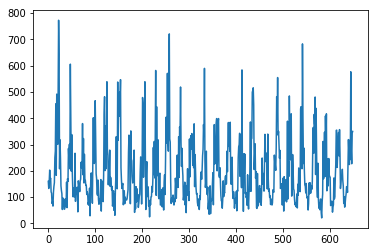

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64882.75541670741, 58401.37495484095, 42287.11500858583]
(array([657., 661.]), array([-38., 377.]), array([-24., 566.]), 577.0)
(array([433., 437.]), array([-68., 351.]), array([-25., 566.]), 276.0)
(array([0., 0.]), array([-70., 338.]), array([-25., 566.]), 227.0)
(array([0., 0.]), array([-65., 328.]), array([-24., 567.]), 344.0)
(array([0., 0.]), array([-73., 331.]), array([-25., 567.]), 350.0)
(0.0, 0.4, 0.8)


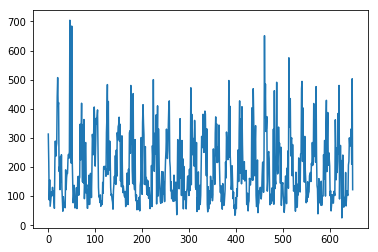

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[73311.78247795817, 28528.991180328263, 40240.59996911775]
(array([267., 269.]), array([ -4., 409.]), array([-24., 389.]), 292.0)
(array([23., 23.]), array([ -6., 387.]), array([-24., 392.]), 331.0)
(array([150., 152.]), array([-19., 381.]), array([-24., 389.]), 209.0)
(array([0., 0.]), array([-31., 375.]), array([-24., 389.]), 503.0)
(array([0., 0.]), array([-34., 344.]), array([-24., 391.]), 122.0)
(0.0, 0.8, 0.8)


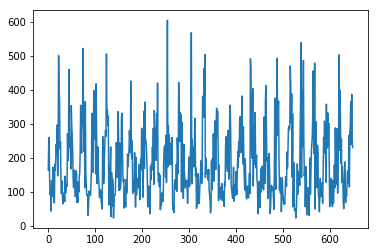

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[73905.6568344079, 3967.199553970334, 7245.736763420678]
(array([520., 524.]), array([106., 504.]), array([ -8., 508.]), 365.0)
(array([28., 29.]), array([114., 500.]), array([ -8., 508.]), 239.0)
(array([660., 670.]), array([103., 470.]), array([ -8., 508.]), 387.0)
(array([656., 672.]), array([ 87., 449.]), array([ -8., 509.]), 252.0)
(array([0., 0.]), array([ 82., 455.]), array([ -8., 508.]), 230.0)
(0.0, 1.0, 1.0)


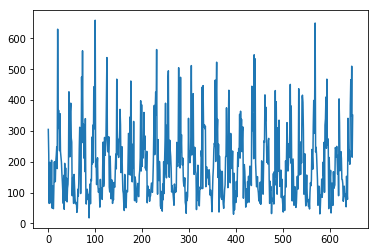

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[73468.99423152469, 12979.519990985662, 24772.735558317974]
(array([466., 470.]), array([129., 537.]), array([ -6., 548.]), 466.0)
(array([409., 414.]), array([172., 557.]), array([ -6., 545.]), 350.0)
(array([61., 62.]), array([122., 537.]), array([ -6., 547.]), 510.0)
(array([17., 18.]), array([132., 510.]), array([ -5., 547.]), 215.0)
(array([0., 0.]), array([112., 496.]), array([ -6., 548.]), 351.0)
(0.2, 1.0, 1.0)


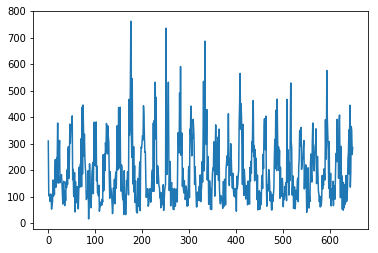

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[51316.605057628556, 14103.352977007069, 9932.954220036183]
(array([272., 274.]), array([ 95., 497.]), array([-15., 480.]), 191.0)
(array([687., 695.]), array([ -4., 377.]), array([-14., 482.]), 365.0)
(array([445., 452.]), array([ 36., 415.]), array([-15., 481.]), 349.0)
(array([29., 30.]), array([  4., 383.]), array([-14., 481.]), 259.0)
(array([0., 0.]), array([  5., 394.]), array([-14., 480.]), 285.0)
(0.0, 1.0, 1.0)


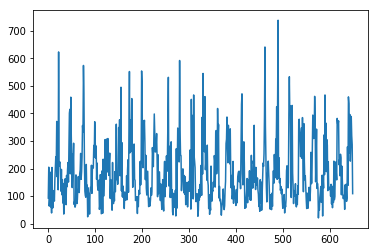

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26469.844110187772, 13679.89575223385, 20422.169558573394]
(array([371., 374.]), array([  1., 414.]), array([-15., 412.]), 286.0)
(array([135., 137.]), array([  3., 395.]), array([-15., 413.]), 389.0)
(array([291., 295.]), array([ -7., 392.]), array([-15., 412.]), 319.0)
(array([501., 513.]), array([-10., 389.]), array([-14., 412.]), 287.0)
(array([0., 0.]), array([-22., 375.]), array([-14., 412.]), 109.0)
(0.0, 1.0, 1.0)


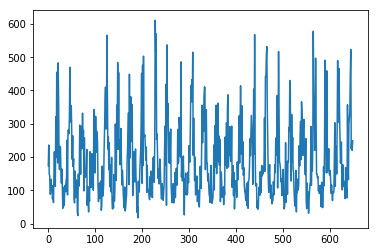

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44094.533532037836, 15494.866603333521, 16561.638095422888]
(array([772., 778.]), array([ 63., 446.]), array([-11., 610.]), 523.0)
(array([321., 324.]), array([ 95., 458.]), array([-11., 612.]), 225.0)
(array([54., 55.]), array([ 59., 430.]), array([-11., 612.]), 247.0)
(array([0., 0.]), array([ 52., 408.]), array([-12., 611.]), 220.0)
(array([0., 0.]), array([ 34., 400.]), array([-12., 612.]), 249.0)
(0.0, 0.8, 1.0)


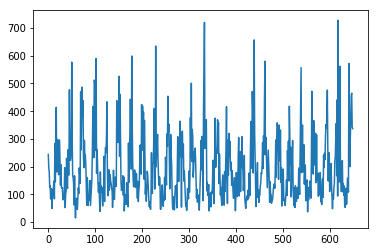

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[77116.63547518286, 35208.7190367178, 29035.096375548386]
(array([522., 526.]), array([ -9., 448.]), array([-14., 526.]), 371.0)
(array([807., 816.]), array([ 31., 447.]), array([-14., 528.]), 457.0)
(array([304., 309.]), array([  6., 433.]), array([-14., 527.]), 465.0)
(array([29., 29.]), array([-15., 403.]), array([-14., 527.]), 342.0)
(array([0., 0.]), array([ -4., 399.]), array([-13., 528.]), 337.0)
(0.0, 0.6, 1.0)


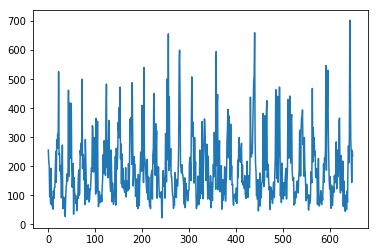

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[25586.562971556275, 127908.17830655091, 57110.62661891796]
(array([327., 330.]), array([429., 841.]), array([ 48., 804.]), 288.0)
(array([476., 481.]), array([375., 779.]), array([ 48., 806.]), 245.0)
(array([25., 25.]), array([393., 782.]), array([ 48., 807.]), 144.0)
(array([295., 303.]), array([388., 776.]), array([ 49., 805.]), 255.0)
(array([0., 0.]), array([358., 757.]), array([ 48., 807.]), 236.0)
(0.0, 0.0, 1.0)


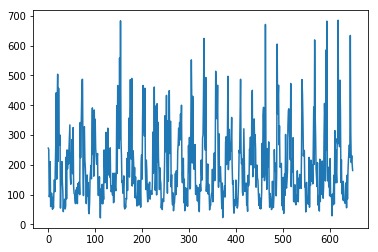

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[15966.08437276213, 68248.57103415142, 22300.61766999102]
(array([253., 255.]), array([219., 682.]), array([ 11., 710.]), 307.0)
(array([8., 8.]), array([344., 770.]), array([ 11., 712.]), 208.0)
(array([283., 287.]), array([239., 690.]), array([ 11., 713.]), 231.0)
(array([165., 169.]), array([262., 695.]), array([ 11., 712.]), 201.0)
(array([0., 0.]), array([231., 665.]), array([ 11., 711.]), 181.0)
(0.0, 0.2, 1.0)


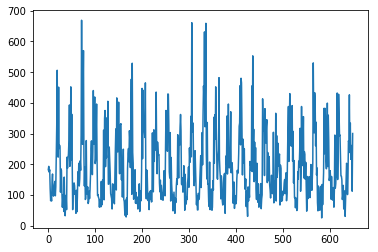

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[22168.204807733542, 17372.023413770938, 19710.11353688167]
(array([107., 108.]), array([-79., 326.]), array([-25., 320.]), 216.0)
(array([271., 274.]), array([-62., 317.]), array([-26., 321.]), 261.0)
(array([261., 265.]), array([-72., 313.]), array([-26., 320.]), 255.0)
(array([18., 18.]), array([-95., 308.]), array([-26., 321.]), 112.0)
(array([0., 0.]), array([-91., 300.]), array([-26., 321.]), 300.0)
(0.0, 1.0, 1.0)


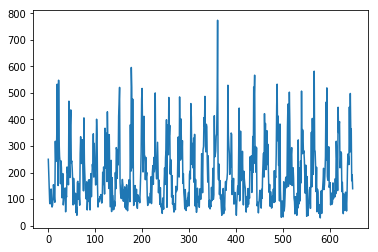

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[25271.777572764047, 41732.420447520446, 17683.39879280234]
(array([475., 479.]), array([219., 636.]), array([  8., 649.]), 350.0)
(array([565., 571.]), array([275., 680.]), array([  7., 651.]), 365.0)
(array([55., 56.]), array([223., 630.]), array([  7., 649.]), 169.0)
(array([0., 0.]), array([225., 625.]), array([  7., 651.]), 192.0)
(array([0., 0.]), array([202., 605.]), array([  7., 651.]), 139.0)
(0.0, 0.4, 1.0)


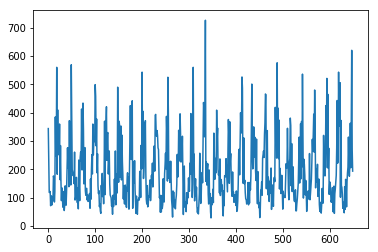

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[215522.75625312066, 38235.21775714286, 30713.448455500802]
(array([291., 294.]), array([ 47., 415.]), array([-13., 643.]), 206.0)
(array([453., 457.]), array([  6., 427.]), array([-13., 645.]), 353.0)
(array([1598., 1623.]), array([ 13., 402.]), array([-13., 646.]), 620.0)
(array([68., 69.]), array([ 12., 406.]), array([-13., 645.]), 270.0)
(array([0., 0.]), array([ -5., 405.]), array([-13., 645.]), 194.0)
(0.0, 0.8, 1.0)


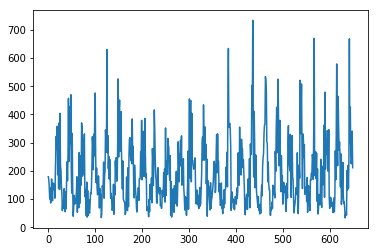

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31710.676899231283, 5482.789716389518, 2217.20755462192]
(array([268., 270.]), array([ 71., 470.]), array([ -2., 518.]), 250.0)
(array([339., 342.]), array([179., 563.]), array([ -1., 517.]), 225.0)
(array([526., 534.]), array([ 98., 462.]), array([ -1., 517.]), 241.0)
(array([465., 476.]), array([ 92., 487.]), array([ -2., 517.]), 341.0)
(array([0., 0.]), array([ 83., 448.]), array([ -2., 517.]), 211.0)
(0.0, 1.0, 1.0)


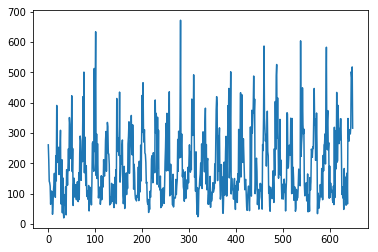

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[80917.40286010953, 26300.532298014885, 48069.92299139743]
(array([137., 138.]), array([117., 498.]), array([ -8., 497.]), 320.0)
(array([536., 541.]), array([103., 490.]), array([ -8., 498.]), 502.0)
(array([17., 18.]), array([117., 477.]), array([ -8., 498.]), 484.0)
(array([739., 757.]), array([ 69., 489.]), array([ -8., 500.]), 518.0)
(array([0., 0.]), array([ 78., 465.]), array([ -8., 501.]), 316.0)
(0.0, 0.4, 0.6)


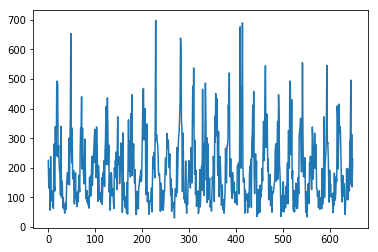

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26783.88794540418, 16824.907903776282, 25348.56076545577]
(array([227., 228.]), array([ 49., 443.]), array([-12., 435.]), 496.0)
(array([232., 234.]), array([ 43., 425.]), array([-12., 433.]), 144.0)
(array([279., 284.]), array([ 25., 424.]), array([-13., 435.]), 313.0)
(array([131., 134.]), array([ 28., 397.]), array([-12., 434.]), 136.0)
(array([0., 0.]), array([ 17., 396.]), array([-13., 433.]), 230.0)
(0.0, 0.8, 0.8)


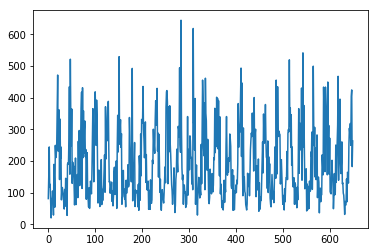

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[37457.189040638084, 43117.010312883336, 44569.82172954113]
(array([312., 315.]), array([-66., 319.]), array([-28., 338.]), 249.0)
(array([128., 130.]), array([-62., 323.]), array([-28., 336.]), 404.0)
(array([258., 262.]), array([-67., 300.]), array([-28., 337.]), 424.0)
(array([74., 76.]), array([-80., 286.]), array([-29., 336.]), 182.0)
(array([0., 0.]), array([-71., 285.]), array([-28., 336.]), 263.0)
(0.0, 0.6, 0.6)


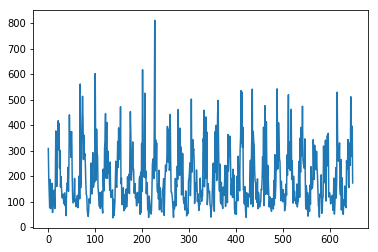

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47519.9908548001, 26279.552413581783, 33007.99981727525]
(array([483., 486.]), array([ 56., 447.]), array([-15., 462.]), 511.0)
(array([293., 296.]), array([ 15., 427.]), array([-14., 460.]), 277.0)
(array([568., 577.]), array([ 12., 416.]), array([-14., 461.]), 349.0)
(array([0., 0.]), array([  4., 407.]), array([-15., 461.]), 396.0)
(array([0., 0.]), array([-18., 389.]), array([-14., 461.]), 173.0)
(0.0, 0.8, 0.8)


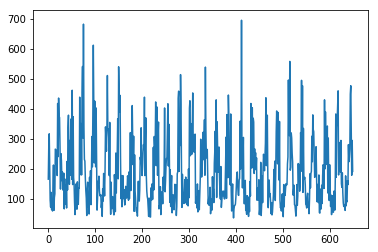

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26747.808901116317, 11455.820113989972, 13435.071002836721]
(array([320., 322.]), array([119., 518.]), array([  3., 531.]), 477.0)
(array([290., 293.]), array([177., 544.]), array([  3., 531.]), 336.0)
(array([158., 160.]), array([125., 506.]), array([  3., 530.]), 179.0)
(array([553., 567.]), array([125., 509.]), array([  4., 531.]), 295.0)
(array([0., 0.]), array([111., 506.]), array([  4., 530.]), 192.0)
(0.0, 1.0, 1.0)


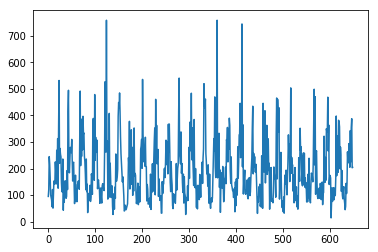

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50933.561481294295, 12245.53498472007, 17696.0341488261]
(array([132., 133.]), array([-24., 367.]), array([-17., 418.]), 225.0)
(array([258., 261.]), array([ 32., 438.]), array([-17., 418.]), 354.0)
(array([794., 806.]), array([-12., 381.]), array([-16., 419.]), 388.0)
(array([43., 44.]), array([ -9., 384.]), array([-17., 416.]), 203.0)
(array([0., 0.]), array([-15., 353.]), array([-17., 418.]), 205.0)
(0.0, 0.8, 1.0)


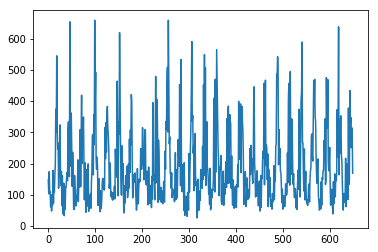

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[49737.135686418114, 3081.282791960451, 8220.850170678788]
(array([202., 204.]), array([ 78., 478.]), array([-11., 470.]), 348.0)
(array([469., 474.]), array([ 64., 464.]), array([-11., 469.]), 251.0)
(array([531., 540.]), array([ 52., 445.]), array([-12., 469.]), 266.0)
(array([34., 35.]), array([ 26., 434.]), array([-12., 470.]), 314.0)
(array([0., 0.]), array([ 25., 435.]), array([-11., 467.]), 169.0)
(0.0, 1.0, 1.0)


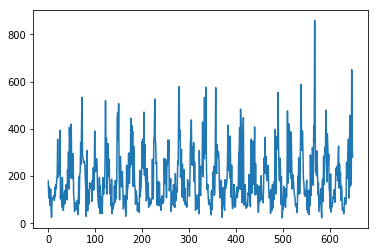

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[37583.65538860705, 63026.49801879122, 59009.43624357229]
(array([267., 269.]), array([-34., 352.]), array([-11., 371.]), 203.0)
(array([163., 165.]), array([-34., 335.]), array([-11., 372.]), 164.0)
(array([672., 682.]), array([-49., 343.]), array([-11., 371.]), 651.0)
(array([644., 659.]), array([-60., 333.]), array([-11., 373.]), 329.0)
(array([0., 0.]), array([-54., 327.]), array([-11., 372.]), 281.0)
(0.2, 0.8, 0.8)


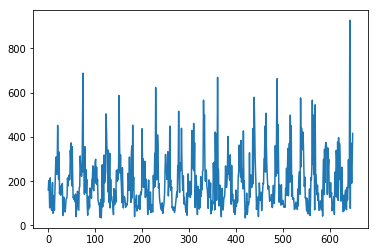

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[58921.86065183015, 60488.36250269167, 9521.300268746234]
(array([372., 375.]), array([ 493., 1025.]), array([ 10., 914.]), 373.0)
(array([201., 203.]), array([  1., 459.]), array([ 10., 915.]), 265.0)
(array([389., 396.]), array([354., 818.]), array([ 10., 918.]), 191.0)
(array([5., 6.]), array([ 76., 516.]), array([  9., 916.]), 283.0)
(array([0., 0.]), array([266., 687.]), array([  9., 918.]), 416.0)
(0.2, 0.6, 1.0)


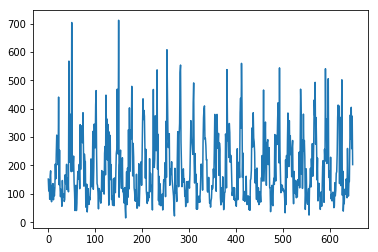

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[54119.05654331044, 5414.127066048575, 6487.004332446985]
(array([431., 435.]), array([155., 554.]), array([ -5., 565.]), 294.0)
(array([636., 643.]), array([161., 567.]), array([ -5., 564.]), 405.0)
(array([379., 385.]), array([152., 545.]), array([ -5., 564.]), 259.0)
(array([0., 0.]), array([139., 524.]), array([ -5., 566.]), 374.0)
(array([0., 0.]), array([122., 509.]), array([ -4., 564.]), 203.0)
(0.0, 1.0, 1.0)


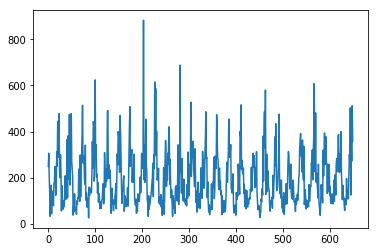

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[216147.4808375936, 39273.324487761805, 19492.897750034896]
(array([87., 87.]), array([257., 682.]), array([ 25., 701.]), 126.0)
(array([687., 694.]), array([302., 713.]), array([ 25., 702.]), 386.0)
(array([630., 640.]), array([296., 677.]), array([ 25., 701.]), 273.0)
(array([1349., 1383.]), array([279., 674.]), array([ 25., 701.]), 512.0)
(array([0., 0.]), array([274., 677.]), array([ 25., 702.]), 358.0)
(0.0, 0.6, 1.0)


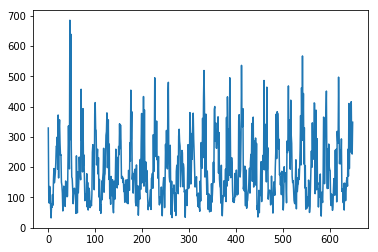

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40499.126736837636, 11876.813193244892, 21371.228333091007]
(array([189., 191.]), array([ 77., 447.]), array([-13., 427.]), 292.0)
(array([426., 430.]), array([ 54., 410.]), array([-13., 427.]), 416.0)
(array([86., 87.]), array([ 41., 419.]), array([-12., 428.]), 261.0)
(array([438., 449.]), array([ 27., 407.]), array([-13., 427.]), 243.0)
(array([0., 0.]), array([ 23., 372.]), array([-12., 428.]), 348.0)
(0.0, 0.8, 1.0)


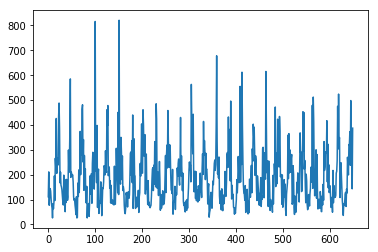

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44157.79727082707, 13576.682662543095, 25263.239146486485]
(array([425., 428.]), array([132., 553.]), array([-10., 511.]), 498.0)
(array([246., 248.]), array([ 84., 492.]), array([-10., 513.]), 347.0)
(array([38., 39.]), array([ 78., 511.]), array([-10., 513.]), 231.0)
(array([6., 6.]), array([ 49., 464.]), array([-10., 511.]), 143.0)
(array([0., 0.]), array([ 46., 457.]), array([-10., 511.]), 387.0)
(0.0, 1.0, 1.0)


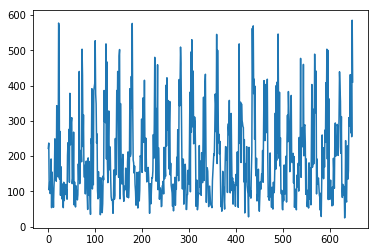

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81071.86026956106, 19898.510230167274, 32173.791818932496]
(array([358., 360.]), array([157., 551.]), array([ -3., 540.]), 266.0)
(array([169., 171.]), array([133., 533.]), array([ -4., 538.]), 398.0)
(array([257., 261.]), array([111., 543.]), array([ -3., 535.]), 255.0)
(array([163., 167.]), array([114., 516.]), array([ -3., 539.]), 585.0)
(array([0., 0.]), array([ 87., 506.]), array([ -4., 538.]), 410.0)
(0.0, 0.8, 0.8)


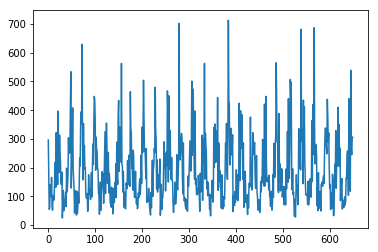

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[75480.28388340212, 64113.82742565863, 45293.6891426818]
(array([353., 356.]), array([-84., 324.]), array([-13., 359.]), 539.0)
(array([214., 216.]), array([-105.,  316.]), array([-13., 359.]), 268.0)
(array([646., 656.]), array([-109.,  300.]), array([-13., 358.]), 245.0)
(array([581., 596.]), array([-114.,  289.]), array([-13., 359.]), 302.0)
(array([0., 0.]), array([-124.,  297.]), array([-13., 359.]), 306.0)
(0.0, 0.4, 0.8)


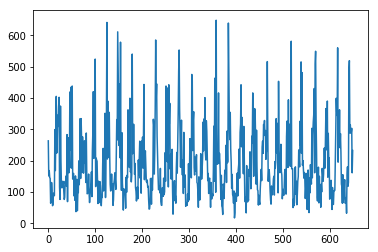

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[20663.463569280284, 3113.198980005115, 3380.2589435455147]
(array([343., 345.]), array([109., 503.]), array([ -8., 514.]), 288.0)
(array([420., 425.]), array([ 95., 534.]), array([ -8., 515.]), 289.0)
(array([403., 409.]), array([ 88., 497.]), array([ -8., 513.]), 303.0)
(array([27., 28.]), array([ 51., 505.]), array([ -8., 514.]), 161.0)
(array([0., 0.]), array([ 61., 478.]), array([ -8., 514.]), 232.0)
(0.0, 1.0, 1.0)


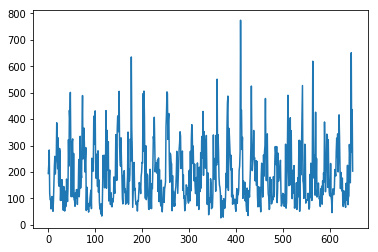

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[98443.06748098617, 68570.06200827347, 43431.22405458412]
(array([361., 364.]), array([ 22., 394.]), array([-18., 678.]), 293.0)
(array([1112., 1124.]), array([-17., 350.]), array([-19., 678.]), 651.0)
(array([466., 473.]), array([-33., 351.]), array([-18., 679.]), 275.0)
(array([0., 0.]), array([-40., 323.]), array([-19., 679.]), 436.0)
(array([0., 0.]), array([-39., 325.]), array([-18., 677.]), 203.0)
(0.0, 0.6, 1.0)


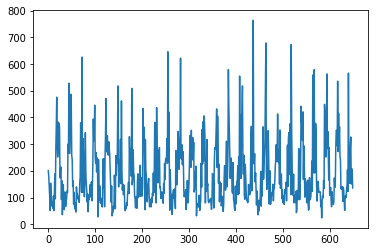

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26079.661808642613, 6178.613474396019, 4718.151798426229]
(array([87., 87.]), array([ 64., 478.]), array([-14., 472.]), 327.0)
(array([244., 246.]), array([ 57., 502.]), array([-14., 473.]), 151.0)
(array([235., 238.]), array([ 43., 487.]), array([-14., 474.]), 186.0)
(array([0., 0.]), array([ 14., 441.]), array([-14., 472.]), 207.0)
(array([0., 0.]), array([ 12., 436.]), array([-14., 476.]), 136.0)
(0.0, 1.0, 1.0)


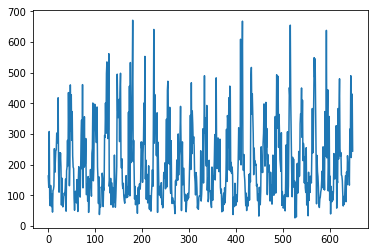

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[80569.77694056604, 15533.198588044921, 25238.917302863865]
(array([428., 431.]), array([ 86., 506.]), array([-10., 483.]), 490.0)
(array([79., 80.]), array([ 66., 471.]), array([-10., 485.]), 223.0)
(array([818., 831.]), array([ 54., 466.]), array([-10., 484.]), 292.0)
(array([239., 245.]), array([ 43., 445.]), array([-10., 485.]), 430.0)
(array([0., 0.]), array([ 28., 419.]), array([-11., 484.]), 244.0)
(0.0, 1.0, 0.8)


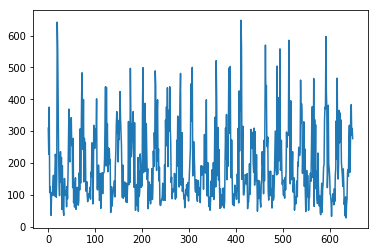

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[169251.77598668117, 22013.7387643908, 17712.27697456269]
(array([527., 531.]), array([ -4., 396.]), array([-11., 460.]), 371.0)
(array([307., 311.]), array([  5., 396.]), array([-11., 456.]), 383.0)
(array([305., 309.]), array([-24., 362.]), array([-10., 456.]), 286.0)
(array([1154., 1182.]), array([-25., 367.]), array([-11., 457.]), 308.0)
(array([0., 0.]), array([-37., 351.]), array([-11., 458.]), 276.0)
(0.0, 1.0, 1.0)


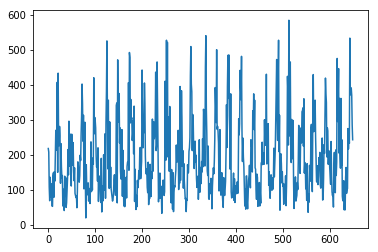

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40556.16275886904, 4311.4967081517225, 3910.4537706786696]
(array([536., 540.]), array([229., 580.]), array([ 18., 585.]), 371.0)
(array([352., 355.]), array([229., 584.]), array([ 19., 585.]), 391.0)
(array([95., 97.]), array([209., 557.]), array([ 18., 586.]), 370.0)
(array([86., 88.]), array([191., 552.]), array([ 19., 584.]), 285.0)
(array([0., 0.]), array([170., 539.]), array([ 19., 584.]), 243.0)
(0.0, 1.0, 1.0)


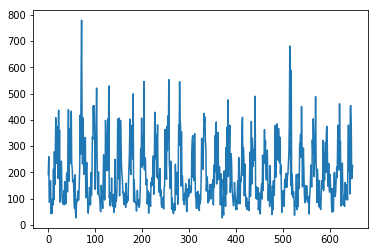

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[37831.42353165524, 54886.151782525856, 45337.39509277481]
(array([440., 443.]), array([-112.,  284.]), array([-36., 389.]), 454.0)
(array([119., 120.]), array([-114.,  280.]), array([-37., 388.]), 386.0)
(array([0., 0.]), array([-117.,  280.]), array([-36., 388.]), 176.0)
(array([13., 13.]), array([-133.,  277.]), array([-37., 389.]), 203.0)
(array([0., 0.]), array([-124.,  259.]), array([-36., 387.]), 226.0)
(0.0, 0.6, 0.8)


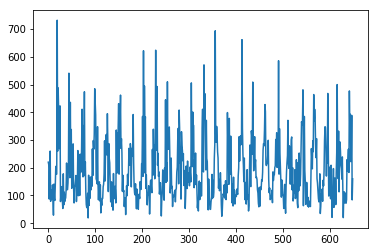

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[43183.82887688044, 31126.054440989676, 13287.198499900649]
(array([39., 40.]), array([198., 585.]), array([ -2., 572.]), 222.0)
(array([146., 147.]), array([190., 590.]), array([ -2., 573.]), 240.0)
(array([6., 6.]), array([167., 576.]), array([ -2., 573.]), 389.0)
(array([42., 43.]), array([154., 545.]), array([ -2., 571.]), 84.0)
(array([0., 0.]), array([141., 541.]), array([ -2., 573.]), 160.0)
(0.0, 0.8, 1.0)


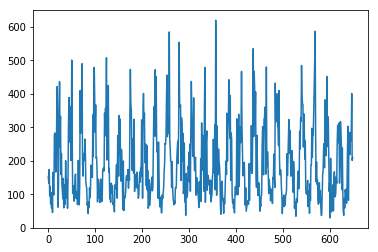

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[33653.415105944325, 4756.923636251289, 8659.594552203142]
(array([336., 339.]), array([ 97., 452.]), array([-10., 461.]), 258.0)
(array([417., 421.]), array([ 94., 449.]), array([-10., 462.]), 273.0)
(array([673., 684.]), array([ 78., 436.]), array([-10., 463.]), 401.0)
(array([58., 60.]), array([ 67., 426.]), array([ -9., 462.]), 201.0)
(array([0., 0.]), array([ 60., 414.]), array([-10., 462.]), 209.0)
(0.0, 1.0, 1.0)


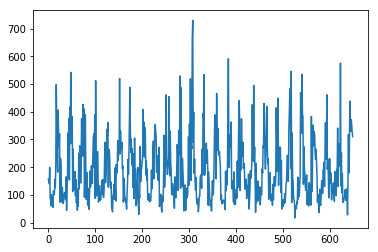

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[104988.16230761104, 1609.3203786958766, 2799.9386599171003]
(array([16., 16.]), array([201., 595.]), array([  2., 579.]), 330.0)
(array([693., 699.]), array([204., 574.]), array([  2., 581.]), 372.0)
(array([8., 8.]), array([166., 558.]), array([  3., 579.]), 352.0)
(array([0., 0.]), array([164., 552.]), array([  2., 580.]), 327.0)
(array([0., 0.]), array([154., 542.]), array([  3., 577.]), 310.0)
(0.0, 1.0, 1.0)


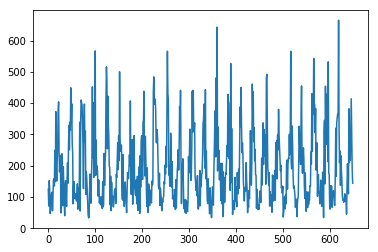

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[96872.04387068076, 14517.197735660986, 22466.696405218252]
(array([26., 26.]), array([ 22., 384.]), array([-22., 405.]), 323.0)
(array([119., 121.]), array([ 28., 381.]), array([-21., 406.]), 414.0)
(array([805., 818.]), array([ -1., 359.]), array([-22., 404.]), 306.0)
(array([5., 6.]), array([  5., 360.]), array([-21., 403.]), 189.0)
(array([0., 0.]), array([-14., 345.]), array([-21., 404.]), 144.0)
(0.0, 0.8, 0.8)


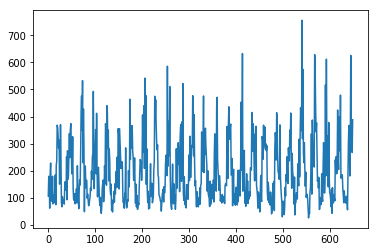

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[51191.10857972937, 29728.919082225348, 39236.36756067805]
(array([484., 487.]), array([ 84., 471.]), array([ -9., 495.]), 626.0)
(array([411., 415.]), array([109., 486.]), array([ -9., 495.]), 293.0)
(array([279., 283.]), array([ 80., 465.]), array([ -9., 494.]), 277.0)
(array([0., 0.]), array([ 74., 456.]), array([-10., 494.]), 267.0)
(array([0., 0.]), array([ 39., 435.]), array([ -9., 495.]), 388.0)
(0.0, 0.8, 0.8)


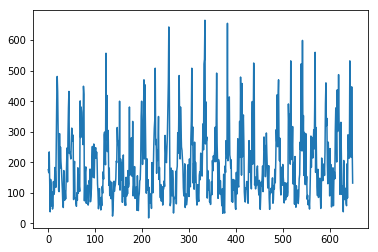

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31488.912371679704, 23521.8984099522, 14568.631929906292]
(array([522., 526.]), array([267., 656.]), array([ -3., 625.]), 408.0)
(array([89., 90.]), array([223., 596.]), array([ -3., 624.]), 216.0)
(array([123., 125.]), array([217., 592.]), array([ -3., 624.]), 447.0)
(array([166., 170.]), array([194., 577.]), array([ -3., 623.]), 246.0)
(array([0., 0.]), array([193., 558.]), array([ -3., 623.]), 132.0)
(0.0, 0.6, 1.0)


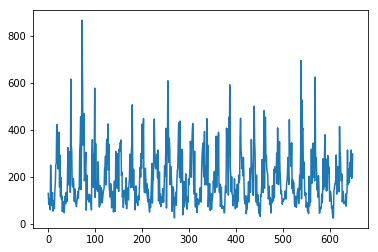

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47276.97886831191, 13129.732020121515, 11745.533292572398]
(array([433., 436.]), array([ 20., 390.]), array([-24., 417.]), 306.0)
(array([568., 574.]), array([-60., 329.]), array([-25., 417.]), 314.0)
(array([33., 33.]), array([-23., 358.]), array([-25., 417.]), 194.0)
(array([0., 0.]), array([-60., 339.]), array([-25., 418.]), 199.0)
(array([0., 0.]), array([-52., 328.]), array([-25., 417.]), 297.0)
(0.0, 1.0, 1.0)


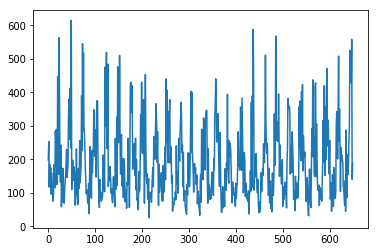

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[87683.77328164039, 41287.49530652992, 44224.469212831624]
(array([344., 347.]), array([ 97., 507.]), array([-16., 525.]), 435.0)
(array([795., 804.]), array([-36., 357.]), array([-16., 524.]), 428.0)
(array([55., 56.]), array([ 24., 425.]), array([-16., 523.]), 558.0)
(array([72., 74.]), array([-12., 367.]), array([-16., 526.]), 140.0)
(array([0., 0.]), array([-32., 374.]), array([-17., 524.]), 188.0)
(0.0, 0.6, 0.8)


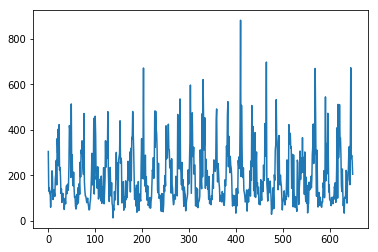

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50161.3157572802, 48037.823428234406, 53300.87914463538]
(array([522., 526.]), array([-11., 418.]), array([-16., 454.]), 673.0)
(array([476., 482.]), array([ -4., 419.]), array([-16., 453.]), 274.0)
(array([3., 3.]), array([-27., 405.]), array([-16., 453.]), 288.0)
(array([11., 12.]), array([-25., 387.]), array([-16., 456.]), 263.0)
(array([0., 0.]), array([-54., 376.]), array([-15., 453.]), 205.0)
(0.0, 0.8, 0.8)


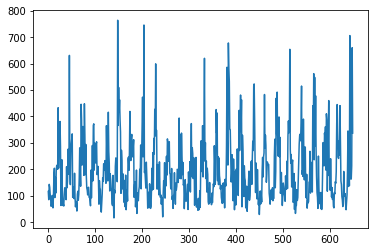

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[1460943.5455324631, 82802.37132159395, 47966.59887581041]
(array([212., 214.]), array([-49., 368.]), array([-23., 638.]), 164.0)
(array([4., 4.]), array([-113.,  277.]), array([-22., 637.]), 163.0)
(array([388., 394.]), array([-106.,  293.]), array([-23., 640.]), 213.0)
(array([3290., 3373.]), array([-139.,  273.]), array([-23., 636.]), 660.0)
(array([0., 0.]), array([-109.,  297.]), array([-23., 638.]), 337.0)
(0.0, 0.6, 0.8)


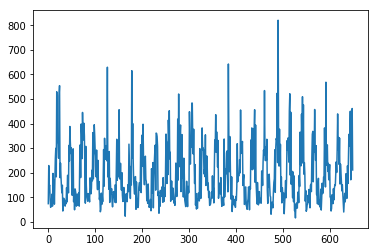

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[102569.81634165172, 33359.6443026013, 14783.856595407065]
(array([212., 213.]), array([264., 655.]), array([  7., 669.]), 171.0)
(array([20., 20.]), array([298., 707.]), array([  7., 668.]), 337.0)
(array([49., 49.]), array([269., 669.]), array([  7., 668.]), 448.0)
(array([6., 6.]), array([252., 657.]), array([  7., 667.]), 461.0)
(array([0., 0.]), array([245., 642.]), array([  7., 668.]), 211.0)
(0.0, 0.6, 1.0)


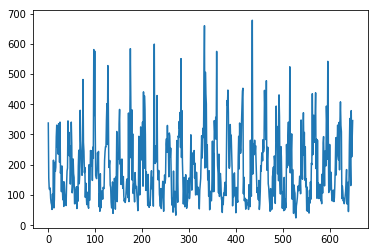

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[53587.38986072338, 12460.670221862194, 11233.484776144032]
(array([168., 169.]), array([ 84., 477.]), array([-11., 482.]), 131.0)
(array([711., 718.]), array([ 58., 440.]), array([-10., 481.]), 379.0)
(array([402., 408.]), array([ 57., 437.]), array([-10., 483.]), 226.0)
(array([326., 335.]), array([ 27., 433.]), array([-10., 480.]), 285.0)
(array([0., 0.]), array([ 22., 410.]), array([-10., 482.]), 346.0)
(0.0, 1.0, 1.0)


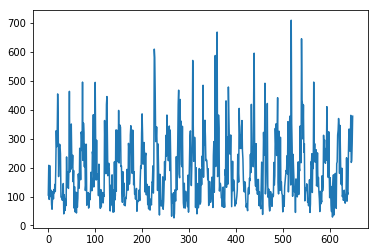

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[408006.5892150376, 15497.707279399188, 13673.552556954306]
(array([526., 530.]), array([ 26., 419.]), array([-17., 468.]), 381.0)
(array([7., 8.]), array([  5., 403.]), array([-17., 468.]), 218.0)
(array([0., 0.]), array([  9., 395.]), array([-18., 467.]), 223.0)
(array([1601., 1639.]), array([ -5., 399.]), array([-17., 469.]), 285.0)
(array([0., 0.]), array([-29., 358.]), array([-17., 468.]), 378.0)
(0.0, 0.8, 1.0)


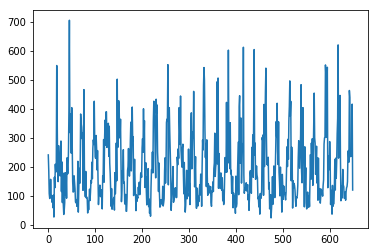

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[33571.4239438213, 8966.500949502479, 11362.638080533077]
(array([368., 371.]), array([ 72., 468.]), array([-10., 456.]), 254.0)
(array([440., 445.]), array([ 60., 436.]), array([-10., 458.]), 238.0)
(array([465., 473.]), array([ 59., 439.]), array([-11., 458.]), 236.0)
(array([204., 209.]), array([ 55., 422.]), array([-10., 457.]), 416.0)
(array([0., 0.]), array([ 30., 413.]), array([-10., 458.]), 120.0)
(0.0, 1.0, 1.0)


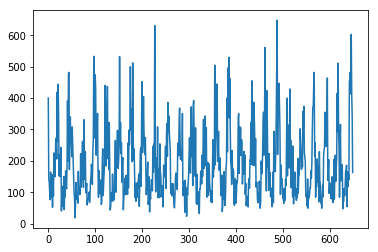

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[41718.71002987182, 33238.56142744827, 20780.047949713935]
(array([434., 438.]), array([352., 720.]), array([ 47., 725.]), 413.0)
(array([470., 475.]), array([332., 724.]), array([ 47., 723.]), 603.0)
(array([ 98., 100.]), array([316., 709.]), array([ 47., 724.]), 414.0)
(array([86., 88.]), array([325., 717.]), array([ 49., 725.]), 342.0)
(array([0., 0.]), array([297., 692.]), array([ 48., 725.]), 163.0)
(0.0, 0.8, 1.0)


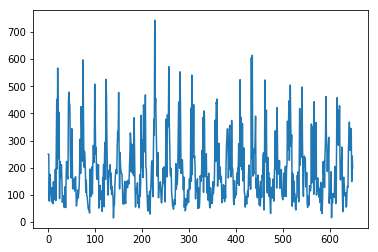

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[36786.17242127236, 5772.628941596134, 13693.54408482181]
(array([214., 216.]), array([ -2., 428.]), array([-13., 438.]), 345.0)
(array([89., 90.]), array([ 62., 484.]), array([-13., 438.]), 339.0)
(array([69., 70.]), array([ 38., 417.]), array([-14., 437.]), 149.0)
(array([0., 0.]), array([ 44., 440.]), array([-14., 437.]), 243.0)
(array([0., 0.]), array([  4., 393.]), array([-13., 438.]), 199.0)
(0.0, 1.0, 1.0)


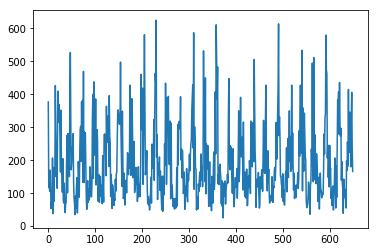

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[20747.215339717182, 10288.486200246782, 12793.078861647182]
(array([232., 234.]), array([ 77., 491.]), array([-12., 457.]), 180.0)
(array([511., 516.]), array([ 40., 427.]), array([-13., 457.]), 322.0)
(array([293., 297.]), array([ 36., 434.]), array([-13., 456.]), 406.0)
(array([86., 88.]), array([ 34., 417.]), array([-13., 457.]), 243.0)
(array([0., 0.]), array([ 21., 408.]), array([-13., 456.]), 166.0)
(0.0, 1.0, 1.0)


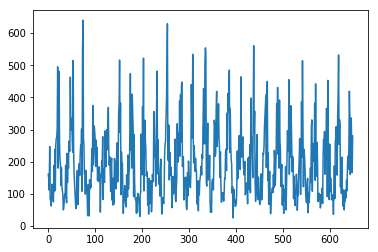

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[38605.470038798194, 21423.793732188144, 22256.678049862487]
(array([378., 381.]), array([-65., 318.]), array([-30., 363.]), 284.0)
(array([59., 60.]), array([-49., 334.]), array([-30., 364.]), 336.0)
(array([202., 205.]), array([-63., 308.]), array([-29., 365.]), 241.0)
(array([0., 0.]), array([-69., 314.]), array([-29., 364.]), 166.0)
(array([0., 0.]), array([-79., 301.]), array([-30., 364.]), 280.0)
(0.0, 0.8, 1.0)


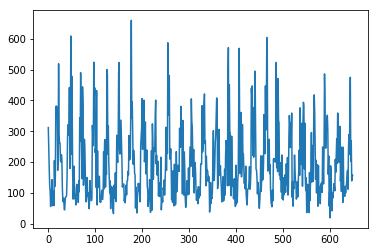

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[23366.764040427184, 46039.901722168266, 17314.755815744717]
(array([203., 205.]), array([179., 596.]), array([ 14., 613.]), 202.0)
(array([528., 534.]), array([233., 651.]), array([ 13., 612.]), 269.0)
(array([90., 92.]), array([207., 574.]), array([ 14., 614.]), 139.0)
(array([12., 12.]), array([206., 590.]), array([ 13., 614.]), 159.0)
(array([0., 0.]), array([163., 564.]), array([ 14., 615.]), 156.0)
(0.0, 0.4, 1.0)


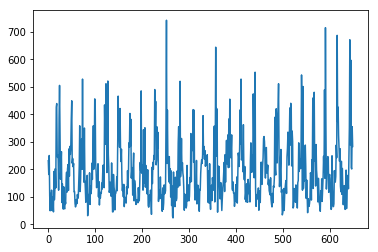

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47298.54529416985, 21723.59944053442, 21206.504512756877]
(array([522., 526.]), array([288., 754.]), array([  5., 681.]), 597.0)
(array([201., 204.]), array([206., 615.]), array([  5., 682.]), 206.0)
(array([31., 31.]), array([225., 643.]), array([  4., 682.]), 201.0)
(array([5., 6.]), array([181., 603.]), array([  5., 682.]), 355.0)
(array([0., 0.]), array([181., 583.]), array([  4., 680.]), 283.0)
(0.0, 0.8, 1.0)


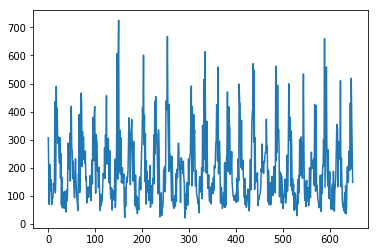

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[33663.034194329906, 12968.511257931885, 20745.00231016748]
(array([284., 286.]), array([100., 506.]), array([ -8., 536.]), 197.0)
(array([698., 705.]), array([127., 564.]), array([ -7., 536.]), 519.0)
(array([198., 201.]), array([104., 494.]), array([ -7., 536.]), 377.0)
(array([0., 0.]), array([ 86., 508.]), array([ -7., 536.]), 272.0)
(array([0., 0.]), array([ 75., 475.]), array([ -8., 536.]), 148.0)
(0.0, 1.0, 1.0)


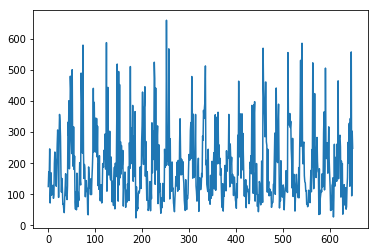

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[87694.42126054925, 24902.07914265518, 39661.471112602056]
(array([198., 199.]), array([ 15., 430.]), array([-19., 433.]), 269.0)
(array([32., 32.]), array([ 41., 460.]), array([-18., 434.]), 558.0)
(array([154., 157.]), array([  7., 406.]), array([-18., 433.]), 95.0)
(array([0., 0.]), array([ 17., 441.]), array([-18., 433.]), 303.0)
(array([0., 0.]), array([ -8., 386.]), array([-18., 434.]), 248.0)
(0.0, 0.8, 0.8)


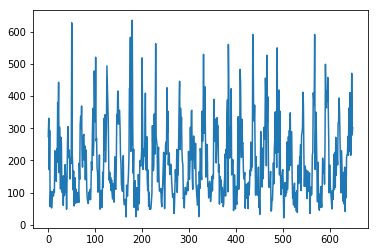

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[105551.94541755065, 10069.284138992776, 10049.60066836193]
(array([240., 242.]), array([179., 550.]), array([ -5., 532.]), 216.0)
(array([10., 10.]), array([139., 501.]), array([ -5., 530.]), 246.0)
(array([ 987., 1003.]), array([143., 524.]), array([ -6., 532.]), 471.0)
(array([596., 611.]), array([127., 503.]), array([ -6., 529.]), 279.0)
(array([0., 0.]), array([113., 468.]), array([ -5., 532.]), 302.0)
(0.0, 1.0, 1.0)


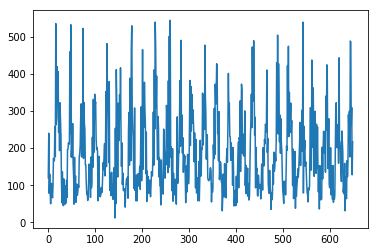

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[27863.184212858632, 33183.22404914798, 15279.667353517352]
(array([510., 514.]), array([164., 529.]), array([  2., 601.]), 485.0)
(array([414., 419.]), array([271., 633.]), array([  1., 600.]), 259.0)
(array([497., 504.]), array([199., 546.]), array([  1., 602.]), 309.0)
(array([298., 305.]), array([234., 590.]), array([  1., 601.]), 128.0)
(array([0., 0.]), array([201., 552.]), array([  1., 600.]), 217.0)
(0.0, 0.6, 1.0)


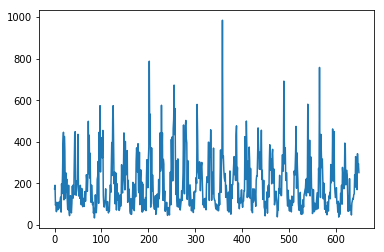

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[156696.2603847602, 5358.40314757037, 7258.762946826791]
(array([131., 131.]), array([ 53., 492.]), array([ -9., 470.]), 170.0)
(array([533., 539.]), array([ 43., 474.]), array([ -9., 471.]), 343.0)
(array([248., 252.]), array([ 24., 441.]), array([ -9., 470.]), 277.0)
(array([1107., 1133.]), array([ 17., 445.]), array([ -9., 469.]), 295.0)
(array([0., 0.]), array([  3., 432.]), array([ -9., 470.]), 252.0)
(0.0, 1.0, 1.0)


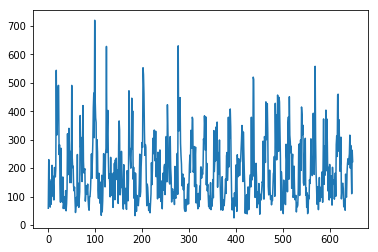

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[53078.04730780049, 6185.826902898145, 12100.2629337612]
(array([4., 4.]), array([  7., 379.]), array([-27., 355.]), 280.0)
(array([96., 97.]), array([-25., 341.]), array([-27., 356.]), 190.0)
(array([3., 3.]), array([ -5., 349.]), array([-27., 354.]), 110.0)
(array([601., 616.]), array([-38., 331.]), array([-27., 354.]), 263.0)
(array([0., 0.]), array([-38., 327.]), array([-27., 354.]), 223.0)
(0.0, 1.0, 1.0)


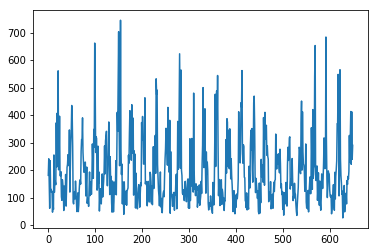

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[65850.85415360777, 7467.498835777742, 15636.926488018924]
(array([532., 536.]), array([ 99., 527.]), array([-12., 509.]), 413.0)
(array([333., 336.]), array([ 79., 493.]), array([-12., 511.]), 221.0)
(array([0., 0.]), array([ 56., 479.]), array([-12., 509.]), 412.0)
(array([20., 20.]), array([ 43., 463.]), array([-12., 511.]), 239.0)
(array([0., 0.]), array([ 18., 448.]), array([-12., 509.]), 290.0)
(0.0, 1.0, 1.0)


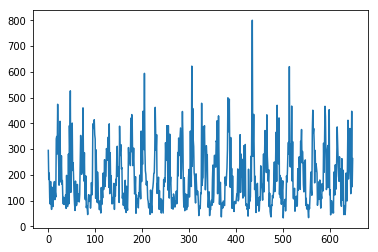

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[82580.50984195547, 15651.600468372262, 16569.744024280102]
(array([171., 173.]), array([ 83., 482.]), array([ -9., 453.]), 127.0)
(array([376., 380.]), array([ 54., 438.]), array([ -9., 453.]), 256.0)
(array([209., 213.]), array([ 41., 431.]), array([ -9., 454.]), 447.0)
(array([666., 683.]), array([ 28., 415.]), array([ -9., 455.]), 154.0)
(array([0., 0.]), array([ 24., 389.]), array([ -9., 454.]), 263.0)
(0.0, 0.8, 1.0)


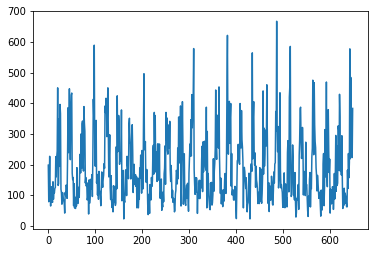

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[51970.93508050724, 24062.714253223214, 31850.738913492125]
(array([362., 364.]), array([ 81., 524.]), array([-17., 459.]), 484.0)
(array([544., 550.]), array([-27., 365.]), array([-18., 461.]), 325.0)
(array([102., 104.]), array([ -5., 409.]), array([-18., 458.]), 274.0)
(array([80., 82.]), array([-46., 372.]), array([-17., 460.]), 223.0)
(array([0., 0.]), array([-23., 342.]), array([-18., 459.]), 383.0)
(0.0, 0.8, 0.8)


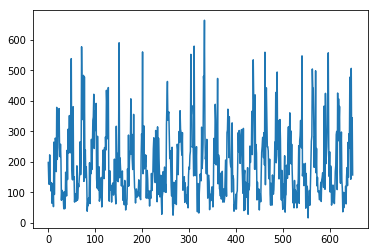

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47735.890738584116, 22896.76548693148, 19519.469510364273]
(array([189., 190.]), array([147., 541.]), array([ -7., 519.]), 143.0)
(array([748., 757.]), array([ 90., 470.]), array([ -8., 519.]), 507.0)
(array([415., 421.]), array([105., 506.]), array([ -8., 519.]), 215.0)
(array([12., 13.]), array([ 75., 467.]), array([ -7., 519.]), 345.0)
(array([0., 0.]), array([ 83., 456.]), array([ -7., 519.]), 157.0)
(0.0, 0.6, 1.0)


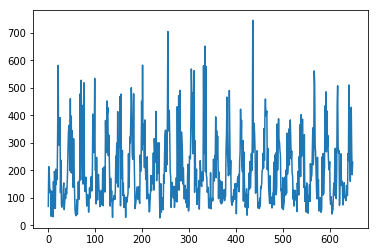

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26090.149045975857, 16042.646225185186, 18972.69487429125]
(array([157., 158.]), array([ 15., 403.]), array([-17., 417.]), 262.0)
(array([592., 598.]), array([-18., 385.]), array([-17., 418.]), 429.0)
(array([341., 346.]), array([-17., 379.]), array([-17., 416.]), 268.0)
(array([0., 0.]), array([-46., 375.]), array([-17., 417.]), 184.0)
(array([0., 0.]), array([-48., 347.]), array([-17., 417.]), 229.0)
(0.0, 0.8, 0.8)


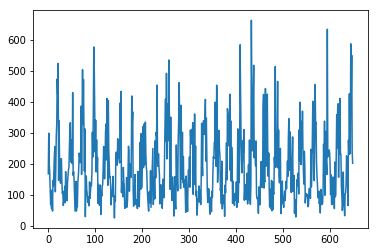

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[45695.67664395093, 47101.91555414445, 69700.98854476798]
(array([376., 378.]), array([ 67., 453.]), array([-14., 450.]), 587.0)
(array([259., 262.]), array([ 51., 453.]), array([-13., 449.]), 418.0)
(array([259., 264.]), array([ 47., 435.]), array([-13., 451.]), 550.0)
(array([50., 51.]), array([ 41., 427.]), array([-13., 450.]), 239.0)
(array([0., 0.]), array([  1., 383.]), array([-13., 449.]), 202.0)
(0.0, 0.6, 0.6)


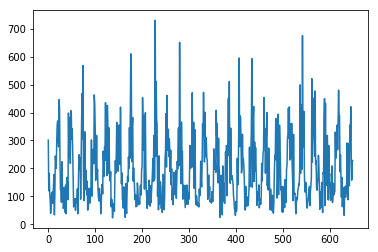

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[97040.7966251861, 10516.91465250416, 14663.353943873171]
(array([396., 399.]), array([ -7., 401.]), array([ -9., 420.]), 421.0)
(array([71., 72.]), array([  4., 419.]), array([-10., 420.]), 245.0)
(array([160., 162.]), array([-19., 389.]), array([-10., 419.]), 158.0)
(array([848., 867.]), array([-19., 386.]), array([ -9., 420.]), 223.0)
(array([0., 0.]), array([-25., 385.]), array([ -9., 420.]), 228.0)
(0.0, 0.8, 0.8)


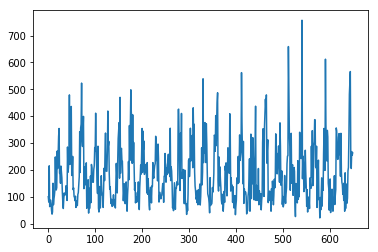

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[65457.99154824009, 115856.79595807688, 45797.301366229876]
(array([132., 133.]), array([429., 806.]), array([ 35., 789.]), 245.0)
(array([340., 344.]), array([410., 791.]), array([ 35., 786.]), 205.0)
(array([666., 676.]), array([390., 763.]), array([ 35., 786.]), 268.0)
(array([0., 0.]), array([368., 769.]), array([ 35., 785.]), 254.0)
(array([0., 0.]), array([362., 721.]), array([ 34., 788.]), 263.0)
(0.0, 0.0, 1.0)


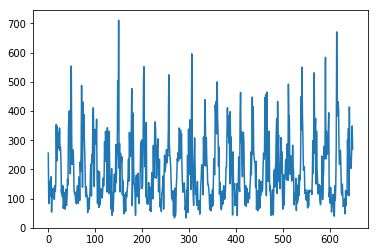

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[29528.3297022406, 5461.504827476338, 12050.169768643067]
(array([227., 229.]), array([ 57., 417.]), array([-10., 422.]), 203.0)
(array([209., 211.]), array([ 39., 423.]), array([-10., 419.]), 217.0)
(array([0., 0.]), array([ 33., 407.]), array([-10., 420.]), 272.0)
(array([336., 344.]), array([ 33., 404.]), array([-10., 420.]), 349.0)
(array([0., 0.]), array([ 15., 386.]), array([-10., 420.]), 270.0)
(0.0, 1.0, 1.0)


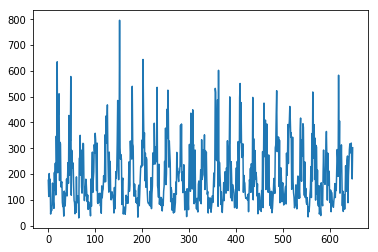

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[67795.1738557642, 3518.5522159278917, 8595.388995955338]
(array([46., 47.]), array([ 55., 461.]), array([-17., 464.]), 310.0)
(array([616., 622.]), array([ 52., 466.]), array([-16., 465.]), 320.0)
(array([14., 14.]), array([ 47., 452.]), array([-16., 464.]), 251.0)
(array([0., 0.]), array([ 32., 451.]), array([-17., 465.]), 181.0)
(array([0., 0.]), array([  0., 421.]), array([-17., 465.]), 302.0)
(0.0, 1.0, 1.0)


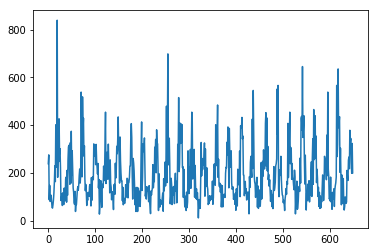

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[85473.98252608205, 9055.728958401753, 3840.671107915988]
(array([390., 393.]), array([182., 561.]), array([  1., 551.]), 344.0)
(array([389., 393.]), array([147., 542.]), array([  1., 552.]), 241.0)
(array([153., 155.]), array([148., 535.]), array([  0., 554.]), 198.0)
(array([912., 935.]), array([135., 524.]), array([  1., 552.]), 323.0)
(array([0., 0.]), array([121., 518.]), array([  1., 552.]), 200.0)
(0.0, 1.0, 1.0)


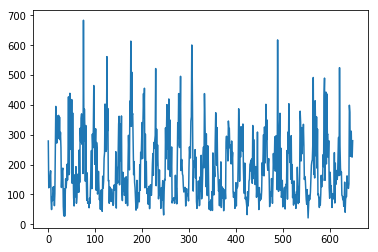

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[160089.12533904094, 2048.751254118902, 2324.9664319979593]
(array([313., 315.]), array([129., 513.]), array([ -6., 484.]), 252.0)
(array([279., 282.]), array([ 95., 459.]), array([ -6., 486.]), 312.0)
(array([30., 31.]), array([ 83., 458.]), array([ -6., 487.]), 226.0)
(array([1037., 1061.]), array([ 85., 446.]), array([ -6., 485.]), 225.0)
(array([0., 0.]), array([ 74., 431.]), array([ -6., 486.]), 280.0)
(0.0, 1.0, 1.0)


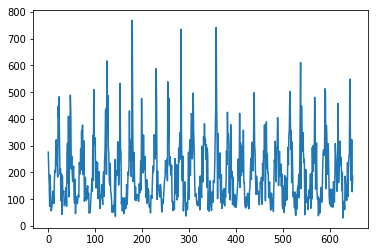

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34145.05782238041, 58335.5554482315, 22674.134010757898]
(array([278., 281.]), array([273., 702.]), array([ 10., 652.]), 193.0)
(array([325., 328.]), array([231., 618.]), array([ 11., 651.]), 169.0)
(array([26., 27.]), array([225., 658.]), array([ 11., 653.]), 323.0)
(array([0., 0.]), array([215., 603.]), array([ 11., 652.]), 128.0)
(array([0., 0.]), array([198., 574.]), array([ 11., 652.]), 185.0)
(0.0, 0.2, 1.0)


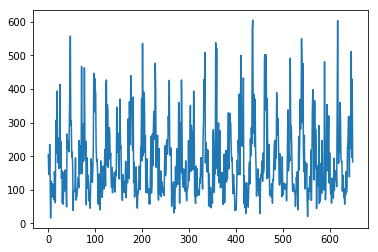

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81978.95736323226, 25495.124953508264, 39319.01067173757]
(array([110., 111.]), array([ 74., 466.]), array([-15., 434.]), 222.0)
(array([85., 86.]), array([ 54., 432.]), array([-15., 434.]), 512.0)
(array([131., 133.]), array([ 32., 418.]), array([-14., 433.]), 196.0)
(array([7., 7.]), array([ 15., 406.]), array([-15., 434.]), 429.0)
(array([0., 0.]), array([  3., 374.]), array([-15., 433.]), 183.0)
(0.0, 0.6, 0.8)


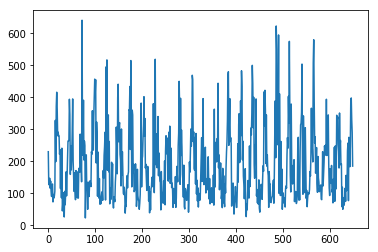

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[41531.44627770074, 12198.8843987285, 19560.545160178735]
(array([316., 318.]), array([ 60., 440.]), array([-15., 460.]), 393.0)
(array([678., 685.]), array([ 57., 446.]), array([-15., 460.]), 398.0)
(array([72., 73.]), array([ 19., 411.]), array([-14., 460.]), 330.0)
(array([144., 147.]), array([ 22., 413.]), array([-15., 460.]), 290.0)
(array([0., 0.]), array([ 31., 398.]), array([-15., 460.]), 185.0)
(0.0, 1.0, 1.0)


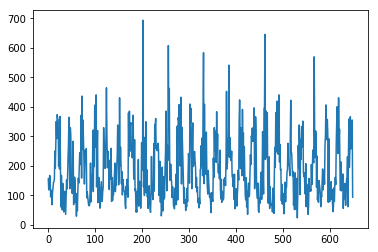

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40016.56311573498, 7396.891391470061, 14841.926737139953]
(array([32., 32.]), array([ 61., 443.]), array([-12., 458.]), 258.0)
(array([312., 316.]), array([126., 476.]), array([-12., 458.]), 318.0)
(array([27., 27.]), array([ 68., 453.]), array([-13., 458.]), 325.0)
(array([128., 131.]), array([ 67., 439.]), array([-12., 459.]), 356.0)
(array([0., 0.]), array([ 59., 426.]), array([-12., 459.]), 94.0)
(0.0, 1.0, 1.0)


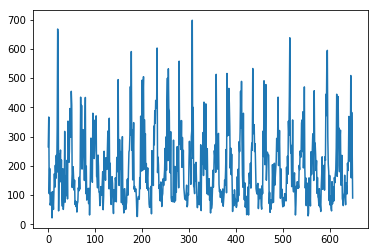

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[163443.92013750394, 24919.738057524137, 27126.94518846732]
(array([689., 694.]), array([ 12., 434.]), array([-17., 558.]), 509.0)
(array([4., 4.]), array([ 21., 401.]), array([-17., 559.]), 159.0)
(array([16., 17.]), array([  9., 422.]), array([-16., 558.]), 383.0)
(array([1032., 1058.]), array([-15., 392.]), array([-17., 557.]), 259.0)
(array([0., 0.]), array([-14., 385.]), array([-17., 558.]), 90.0)
(0.0, 0.8, 1.0)


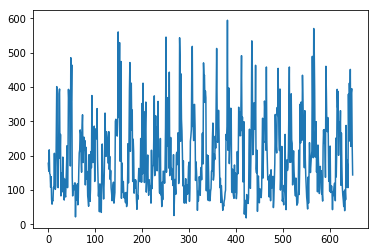

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[127167.12946493647, 21594.93094381196, 11151.719915052585]
(array([331., 334.]), array([212., 592.]), array([ -0., 609.]), 227.0)
(array([454., 459.]), array([225., 609.]), array([ -1., 608.]), 383.0)
(array([1062., 1078.]), array([213., 597.]), array([ -0., 611.]), 395.0)
(array([601., 615.]), array([198., 595.]), array([ -0., 612.]), 230.0)
(array([0., 0.]), array([187., 556.]), array([ -0., 612.]), 144.0)
(0.0, 0.8, 1.0)


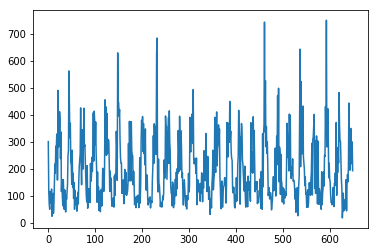

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32069.98117657982, 9426.357562478264, 16398.22050914508]
(array([309., 311.]), array([ 20., 397.]), array([-17., 399.]), 350.0)
(array([189., 191.]), array([ 25., 391.]), array([-16., 397.]), 300.0)
(array([367., 372.]), array([ -0., 394.]), array([-17., 398.]), 219.0)
(array([5., 5.]), array([ -6., 373.]), array([-16., 398.]), 300.0)
(array([0., 0.]), array([-20., 356.]), array([-17., 400.]), 193.0)
(0.0, 1.0, 1.0)


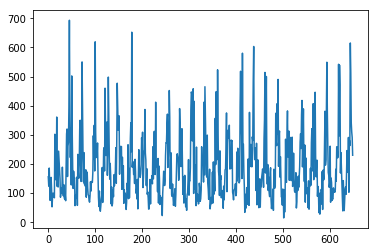

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[169033469.4837094, 44385.476608694145, 22672.613074379005]
(array([749., 755.]), array([276., 726.]), array([163., 753.]), 513.0)
(array([602., 608.]), array([363., 783.]), array([163., 750.]), 341.0)
(array([0., 0.]), array([311., 722.]), array([162., 750.]), 310.0)
(array([138., 141.]), array([313., 730.]), array([162., 750.]), 291.0)
(array([27190., 31728.]), array([293., 710.]), array([163., 751.]), 230.0)
(0.0, 0.2, 1.0)


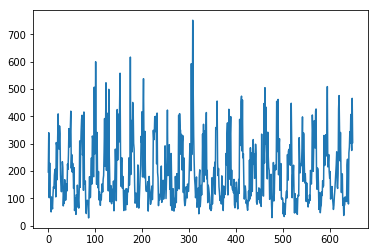

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[67417.98691724105, 65185.467249422625, 42127.22730532908]
(array([580., 584.]), array([-66., 338.]), array([-26., 491.]), 407.0)
(array([400., 404.]), array([-82., 315.]), array([-25., 490.]), 326.0)
(array([164., 166.]), array([-86., 284.]), array([-25., 490.]), 275.0)
(array([23., 23.]), array([-108.,  285.]), array([-25., 492.]), 466.0)
(array([0., 0.]), array([-83., 284.]), array([-25., 490.]), 304.0)
(0.0, 0.2, 1.0)


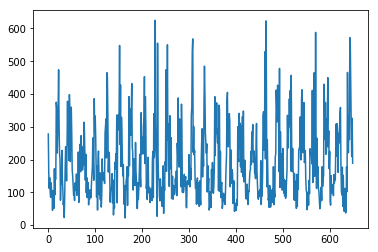

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[107376.33049902381, 17614.944640985155, 7167.682934237759]
(array([168., 169.]), array([212., 615.]), array([  4., 610.]), 416.0)
(array([583., 589.]), array([213., 620.]), array([  4., 610.]), 298.0)
(array([3., 3.]), array([191., 600.]), array([  4., 612.]), 209.0)
(array([161., 165.]), array([183., 599.]), array([  4., 610.]), 326.0)
(array([681., 846.]), array([176., 556.]), array([  5., 612.]), 189.0)
(0.0, 1.0, 1.0)


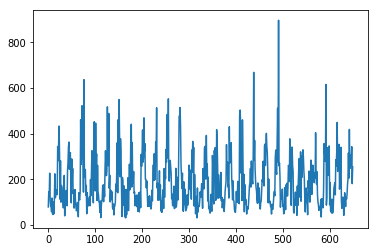

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[63027.96035398182, 5385.940518796854, 7615.3761924118035]
(array([413., 416.]), array([ 32., 439.]), array([-12., 447.]), 307.0)
(array([286., 289.]), array([ 45., 453.]), array([-11., 447.]), 257.0)
(array([815., 828.]), array([ 13., 413.]), array([-12., 447.]), 343.0)
(array([89., 91.]), array([ 16., 405.]), array([-11., 448.]), 181.0)
(array([0., 0.]), array([ -3., 385.]), array([-12., 448.]), 255.0)
(0.0, 1.0, 1.0)


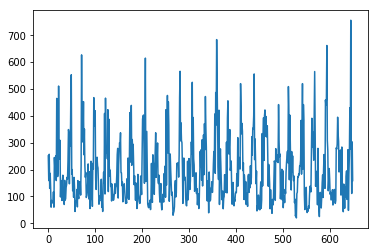

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32497.22703150422, 43525.694827158484, 52231.465080703376]
(array([1086., 1094.]), array([162., 550.]), array([ -8., 814.]), 756.0)
(array([445., 450.]), array([130., 511.]), array([ -8., 816.]), 292.0)
(array([70., 71.]), array([ 99., 508.]), array([ -8., 817.]), 111.0)
(array([303., 310.]), array([ 97., 490.]), array([ -8., 816.]), 303.0)
(array([0., 0.]), array([ 87., 475.]), array([ -8., 816.]), 159.0)
(0.2, 0.8, 1.0)


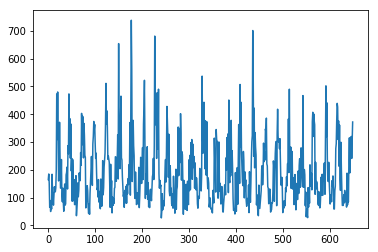

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[85954.08600485824, 8413.242150872567, 15143.449537741999]
(array([367., 370.]), array([ 57., 437.]), array([-13., 436.]), 255.0)
(array([85., 86.]), array([ 52., 424.]), array([-13., 436.]), 320.0)
(array([599., 608.]), array([ 34., 416.]), array([-13., 437.]), 241.0)
(array([0., 0.]), array([ 26., 405.]), array([-13., 435.]), 304.0)
(array([0., 0.]), array([  7., 389.]), array([-13., 435.]), 372.0)
(0.0, 1.0, 1.0)


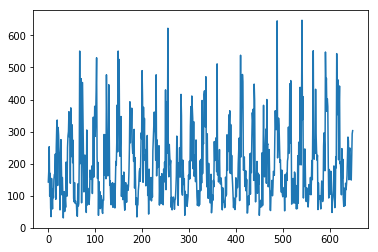

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40484.58631137672, 23126.989250986768, 27259.69510541117]
(array([4., 4.]), array([-63., 334.]), array([-45., 296.]), 170.0)
(array([119., 120.]), array([-126.,  274.]), array([-45., 297.]), 149.0)
(array([53., 53.]), array([-121.,  309.]), array([-45., 299.]), 221.0)
(array([60., 61.]), array([-109.,  265.]), array([-44., 296.]), 293.0)
(array([0., 0.]), array([-109.,  292.]), array([-45., 297.]), 303.0)
(0.0, 0.6, 0.8)


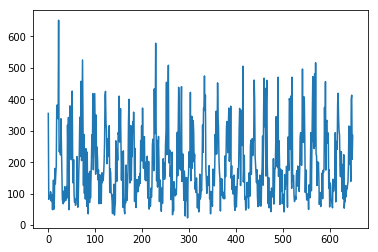

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[71598.69924521467, 16434.89782111728, 27924.5086229594]
(array([199., 201.]), array([ 37., 420.]), array([-16., 414.]), 139.0)
(array([59., 59.]), array([ 34., 407.]), array([-16., 413.]), 401.0)
(array([19., 20.]), array([ 25., 405.]), array([-16., 413.]), 413.0)
(array([244., 250.]), array([ 23., 395.]), array([-16., 415.]), 209.0)
(array([0., 0.]), array([  4., 395.]), array([-16., 413.]), 285.0)
(0.0, 0.8, 1.0)


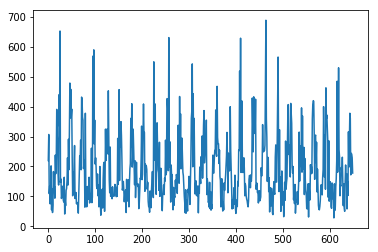

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[12555.503901992033, 22828.873584824974, 5029.79538077392]
(array([220., 221.]), array([183., 586.]), array([  5., 567.]), 172.0)
(array([158., 160.]), array([172., 571.]), array([  4., 564.]), 244.0)
(array([189., 192.]), array([168., 534.]), array([  5., 566.]), 241.0)
(array([90., 92.]), array([148., 534.]), array([  5., 565.]), 229.0)
(array([0., 0.]), array([138., 520.]), array([  5., 565.]), 178.0)
(0.0, 0.8, 1.0)


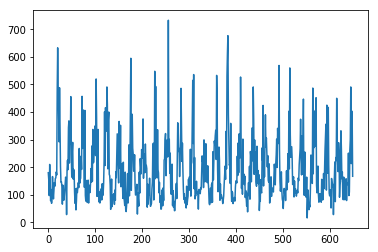

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[33032004.70985476, 16110.060726997981, 19074.11242383012]
(array([654., 659.]), array([115., 493.]), array([ 12., 556.]), 491.0)
(array([410., 415.]), array([100., 483.]), array([ 11., 555.]), 213.0)
(array([809., 821.]), array([ 88., 473.]), array([ 12., 557.]), 404.0)
(array([0., 0.]), array([ 59., 456.]), array([ 12., 556.]), 373.0)
(array([11435., 14712.]), array([ 53., 439.]), array([ 11., 556.]), 167.0)
(0.0, 1.0, 1.0)


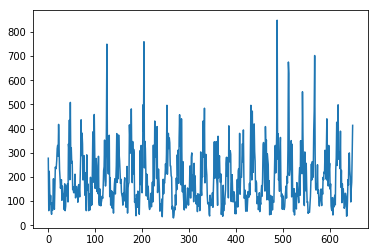

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[49857.5393786661, 19517.46982352073, 23562.072151844353]
(array([44., 45.]), array([-13., 388.]), array([-32., 372.]), 96.0)
(array([42., 42.]), array([ -9., 375.]), array([-33., 370.]), 150.0)
(array([33., 34.]), array([-31., 360.]), array([-32., 370.]), 178.0)
(array([93., 95.]), array([-47., 339.]), array([-32., 370.]), 303.0)
(array([0., 0.]), array([-43., 349.]), array([-31., 371.]), 413.0)
(0.0, 0.8, 0.8)


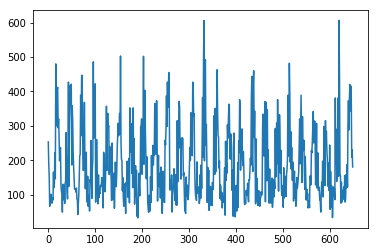

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47855.94154653336, 17307.697710285647, 10075.902120718534]
(array([264., 266.]), array([248., 602.]), array([ -0., 593.]), 416.0)
(array([727., 735.]), array([220., 578.]), array([ -0., 593.]), 395.0)
(array([0., 0.]), array([204., 583.]), array([  0., 591.]), 209.0)
(array([63., 65.]), array([194., 548.]), array([ -0., 591.]), 230.0)
(array([0., 0.]), array([191., 537.]), array([  0., 590.]), 180.0)
(0.0, 0.8, 1.0)


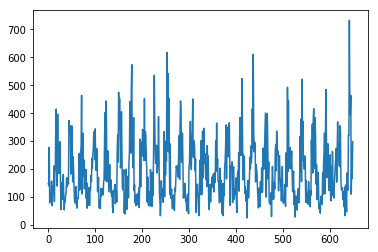

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32890.094920597425, 13128.092642257583, 17152.198475236226]
(array([654., 658.]), array([ 69., 471.]), array([-15., 551.]), 464.0)
(array([169., 171.]), array([ 34., 421.]), array([-14., 549.]), 110.0)
(array([103., 105.]), array([ 26., 404.]), array([-14., 550.]), 211.0)
(array([316., 324.]), array([ 17., 363.]), array([-15., 550.]), 166.0)
(array([0., 0.]), array([  3., 382.]), array([-15., 550.]), 298.0)
(0.0, 1.0, 1.0)


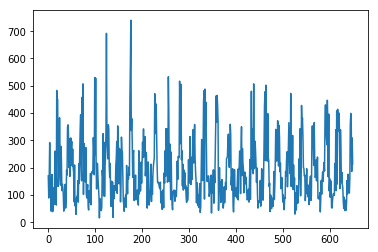

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[23281.619288757596, 5807.0469848505045, 12793.378090717797]
(array([263., 265.]), array([ 66., 487.]), array([ -9., 494.]), 399.0)
(array([206., 208.]), array([133., 522.]), array([ -9., 494.]), 356.0)
(array([15., 15.]), array([ 86., 475.]), array([ -9., 494.]), 186.0)
(array([277., 284.]), array([103., 470.]), array([ -9., 495.]), 309.0)
(array([0., 0.]), array([ 76., 457.]), array([ -9., 496.]), 214.0)
(0.0, 1.0, 1.0)


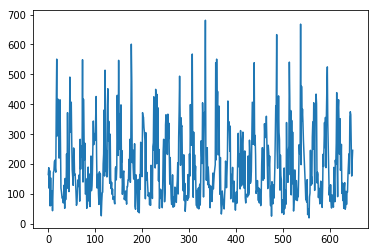

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34217.59584676827, 11225.311032341297, 4841.073002210442]
(array([230., 232.]), array([150., 570.]), array([ -2., 552.]), 365.0)
(array([341., 345.]), array([149., 557.]), array([ -3., 554.]), 268.0)
(array([431., 437.]), array([152., 541.]), array([ -2., 553.]), 160.0)
(array([315., 322.]), array([110., 521.]), array([ -2., 555.]), 209.0)
(array([0., 0.]), array([117., 502.]), array([ -3., 553.]), 246.0)
(0.0, 1.0, 1.0)


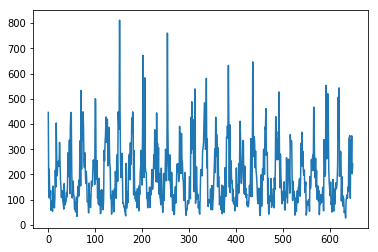

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[60532.51572555272, 44487.97823500272, 15513.534864319949]
(array([479., 482.]), array([-98., 306.]), array([-20., 426.]), 336.0)
(array([318., 321.]), array([-129.,  260.]), array([-20., 426.]), 267.0)
(array([787., 799.]), array([-139.,  278.]), array([-20., 427.]), 353.0)
(array([39., 40.]), array([-136.,  268.]), array([-20., 427.]), 203.0)
(array([0., 0.]), array([-153.,  257.]), array([-21., 428.]), 242.0)
(0.0, 0.4, 1.0)


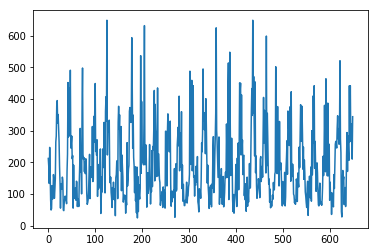

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[82548.36428505127, 2534.5895448663587, 6270.621788270257]
(array([416., 420.]), array([109., 503.]), array([ -9., 498.]), 273.0)
(array([201., 203.]), array([100., 493.]), array([ -9., 499.]), 310.0)
(array([790., 802.]), array([ 90., 490.]), array([ -9., 501.]), 322.0)
(array([18., 18.]), array([ 66., 459.]), array([ -9., 499.]), 210.0)
(array([0., 0.]), array([ 72., 467.]), array([ -9., 499.]), 344.0)
(0.0, 1.0, 1.0)


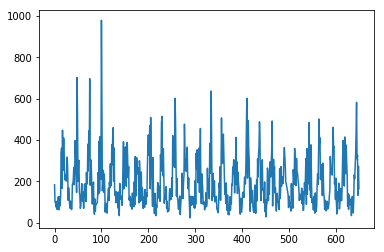

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[26112.052542111804, 73430.30381042618, 31097.834789766952]
(array([435., 438.]), array([305., 717.]), array([ 42., 718.]), 309.0)
(array([417., 422.]), array([315., 728.]), array([ 40., 720.]), 328.0)
(array([3., 3.]), array([296., 709.]), array([ 41., 722.]), 133.0)
(array([25., 26.]), array([276., 707.]), array([ 39., 719.]), 274.0)
(array([0., 0.]), array([292., 703.]), array([ 41., 718.]), 165.0)
(0.0, 0.4, 1.0)


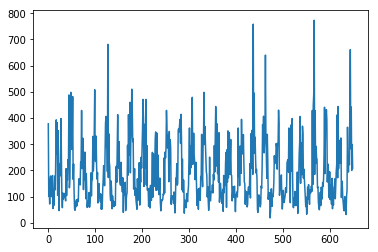

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[217485.05849747913, 17343.864147685043, 8467.707137455443]
(array([392., 395.]), array([214., 610.]), array([  2., 602.]), 283.0)
(array([747., 755.]), array([183., 568.]), array([  2., 604.]), 442.0)
(array([267., 271.]), array([202., 594.]), array([  2., 602.]), 200.0)
(array([1250., 1279.]), array([179., 567.]), array([  2., 603.]), 299.0)
(array([0., 0.]), array([159., 569.]), array([  2., 602.]), 209.0)
(0.0, 0.8, 1.0)


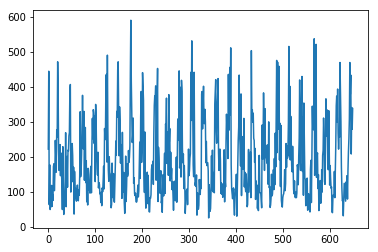

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[51107.4828232086, 4215.6905538147275, 7452.520470782021]
(array([628., 633.]), array([188., 593.]), array([ -5., 574.]), 434.0)
(array([240., 243.]), array([150., 535.]), array([ -5., 575.]), 208.0)
(array([40., 40.]), array([154., 550.]), array([ -5., 575.]), 341.0)
(array([379., 389.]), array([139., 507.]), array([ -5., 576.]), 279.0)
(array([0., 0.]), array([120., 524.]), array([ -5., 573.]), 338.0)
(0.0, 1.0, 1.0)


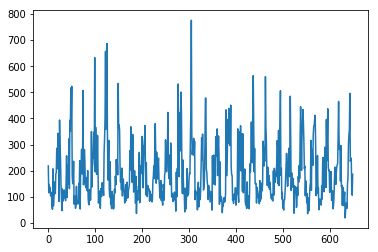

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[13002.702599676197, 10948.85845466315, 3776.8053164842763]
(array([282., 284.]), array([104., 517.]), array([-10., 485.]), 243.0)
(array([166., 168.]), array([103., 467.]), array([-10., 483.]), 248.0)
(array([31., 31.]), array([ 83., 462.]), array([-10., 482.]), 136.0)
(array([0., 0.]), array([ 68., 449.]), array([-11., 482.]), 106.0)
(array([0., 0.]), array([ 58., 446.]), array([-10., 481.]), 186.0)
(0.0, 1.0, 1.0)


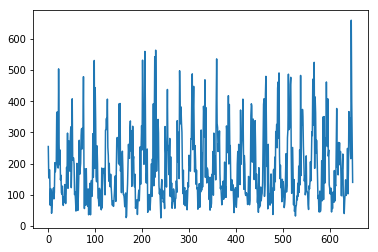

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[9159.097153907405, 53346.6310182177, 58728.400362545915]
(array([142., 143.]), array([-21., 369.]), array([-16., 473.]), 216.0)
(array([745., 753.]), array([ 20., 379.]), array([-16., 473.]), 660.0)
(array([268., 272.]), array([ -9., 363.]), array([-17., 473.]), 401.0)
(array([176., 180.]), array([ -1., 356.]), array([-17., 474.]), 262.0)
(array([211., 251.]), array([-15., 354.]), array([-17., 474.]), 140.0)
(0.0, 0.6, 0.8)


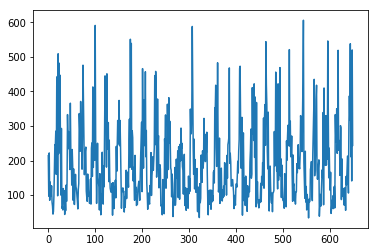

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[71169.60426637685, 53264.26224391117, 25785.382343054258]
(array([61., 62.]), array([295., 694.]), array([ 23., 707.]), 211.0)
(array([428., 433.]), array([335., 736.]), array([ 24., 705.]), 412.0)
(array([83., 84.]), array([285., 682.]), array([ 24., 705.]), 141.0)
(array([0., 0.]), array([299., 674.]), array([ 23., 704.]), 520.0)
(array([0., 0.]), array([276., 671.]), array([ 24., 705.]), 244.0)
(0.0, 0.4, 1.0)


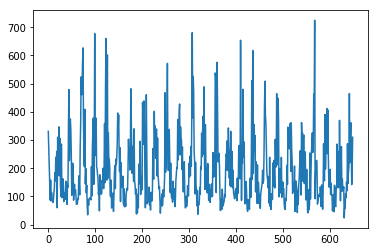

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[41003.59842327193, 32315.568067638716, 34922.08956759542]
(array([232., 234.]), array([-95., 341.]), array([-41., 311.]), 362.0)
(array([40., 40.]), array([-127.,  275.]), array([-40., 313.]), 269.0)
(array([142., 145.]), array([-114.,  300.]), array([-40., 312.]), 142.0)
(array([0., 0.]), array([-143.,  285.]), array([-40., 311.]), 200.0)
(array([0., 0.]), array([-130.,  280.]), array([-41., 313.]), 310.0)
(0.2, 0.6, 0.8)


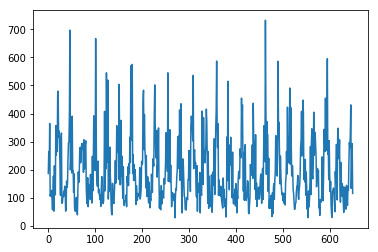

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[12135.797583036441, 14551.562192997433, 16298.39503400384]
(array([375., 378.]), array([ 23., 440.]), array([-14., 445.]), 431.0)
(array([12., 12.]), array([ 59., 458.]), array([-14., 446.]), 134.0)
(array([90., 91.]), array([ 33., 436.]), array([-14., 446.]), 222.0)
(array([181., 186.]), array([ 39., 439.]), array([-14., 446.]), 293.0)
(array([0., 0.]), array([ 28., 426.]), array([-14., 444.]), 116.0)
(0.0, 1.0, 1.0)


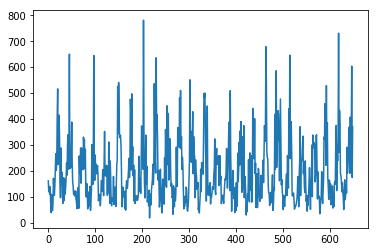

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[66472.31106446948, 91518.19878040606, 88927.04692016933]
(array([161., 163.]), array([-107.,  302.]), array([-36., 296.]), 239.0)
(array([36., 36.]), array([-135.,  281.]), array([-37., 295.]), 330.0)
(array([332., 337.]), array([-122.,  293.]), array([-36., 296.]), 604.0)
(array([0., 0.]), array([-143.,  271.]), array([-36., 295.]), 174.0)
(array([0., 0.]), array([-130.,  270.]), array([-36., 295.]), 370.0)
(0.0, 0.4, 0.4)


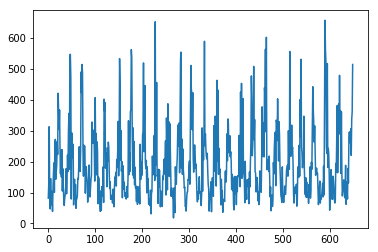

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[108246.99999402059, 25310.60847197647, 42817.757072782355]
(array([48., 48.]), array([ 65., 436.]), array([-18., 427.]), 306.0)
(array([2., 2.]), array([ 47., 433.]), array([-19., 426.]), 220.0)
(array([58., 59.]), array([ 37., 424.]), array([-18., 426.]), 337.0)
(array([68., 69.]), array([ 25., 411.]), array([-18., 428.]), 361.0)
(array([0., 0.]), array([ 17., 411.]), array([-18., 428.]), 514.0)
(0.0, 0.8, 0.8)


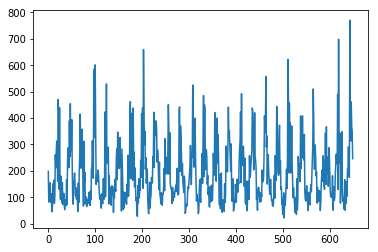

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[43819.85965289617, 48744.83708895455, 13168.210696390006]
(array([402., 405.]), array([440., 872.]), array([ 29., 802.]), 313.0)
(array([753., 760.]), array([300., 717.]), array([ 28., 803.]), 461.0)
(array([499., 506.]), array([364., 767.]), array([ 29., 801.]), 369.0)
(array([556., 570.]), array([301., 707.]), array([ 29., 803.]), 350.0)
(array([0., 0.]), array([301., 705.]), array([ 29., 802.]), 246.0)
(0.0, 0.6, 1.0)


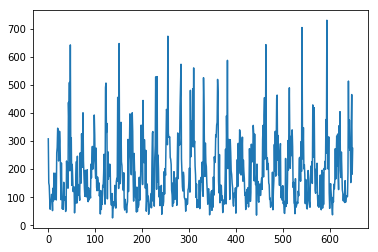

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40020.71581113676, 22919.493543309218, 33333.66269826518]
(array([109., 110.]), array([-15., 414.]), array([-18., 400.]), 152.0)
(array([39., 40.]), array([  1., 421.]), array([-19., 399.]), 353.0)
(array([518., 526.]), array([-24., 393.]), array([-18., 399.]), 466.0)
(array([34., 35.]), array([-40., 385.]), array([-19., 399.]), 182.0)
(array([0., 0.]), array([-47., 382.]), array([-19., 400.]), 274.0)
(0.0, 0.8, 0.8)


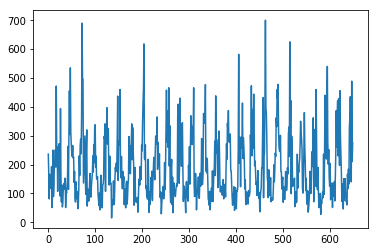

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[70112.47147346943, 18099.934688992515, 14360.97189182355]
(array([485., 489.]), array([168., 556.]), array([ -6., 560.]), 335.0)
(array([27., 28.]), array([181., 563.]), array([ -6., 560.]), 140.0)
(array([925., 940.]), array([163., 533.]), array([ -6., 560.]), 489.0)
(array([5., 6.]), array([147., 510.]), array([ -6., 560.]), 210.0)
(array([0., 0.]), array([127., 500.]), array([ -6., 560.]), 276.0)
(0.0, 0.8, 1.0)


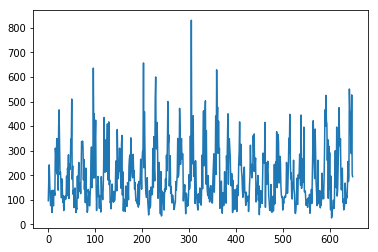

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[62467.64595941167, 36686.28737892957, 16880.9500485866]
(array([518., 522.]), array([299., 683.]), array([  9., 674.]), 350.0)
(array([280., 283.]), array([288., 687.]), array([  8., 673.]), 288.0)
(array([33., 33.]), array([272., 646.]), array([  8., 673.]), 527.0)
(array([244., 250.]), array([239., 651.]), array([  9., 676.]), 204.0)
(array([0., 0.]), array([239., 625.]), array([  9., 676.]), 194.0)
(0.0, 0.6, 1.0)


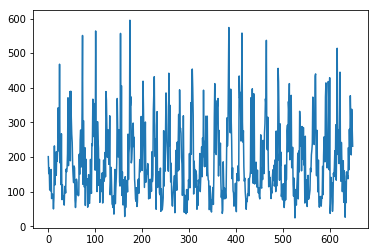

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[324624.0997453143, 14950.672322157843, 13171.112872129928]
(array([184., 185.]), array([-29., 354.]), array([-11., 388.]), 311.0)
(array([353., 357.]), array([  7., 384.]), array([-11., 387.]), 206.0)
(array([492., 500.]), array([-23., 339.]), array([-11., 388.]), 338.0)
(array([1498., 1535.]), array([-35., 357.]), array([-11., 389.]), 289.0)
(array([0., 0.]), array([-45., 330.]), array([-10., 387.]), 231.0)
(0.0, 1.0, 1.0)


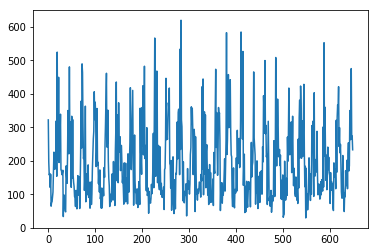

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[90693.5024352709, 7036.456307446038, 9716.741302581408]
(array([318., 320.]), array([126., 510.]), array([ -7., 542.]), 280.0)
(array([832., 841.]), array([ 97., 503.]), array([ -7., 542.]), 475.0)
(array([697., 707.]), array([104., 483.]), array([ -7., 543.]), 264.0)
(array([0., 0.]), array([ 86., 469.]), array([ -7., 541.]), 274.0)
(array([0., 0.]), array([ 60., 460.]), array([ -7., 542.]), 233.0)
(0.0, 1.0, 1.0)


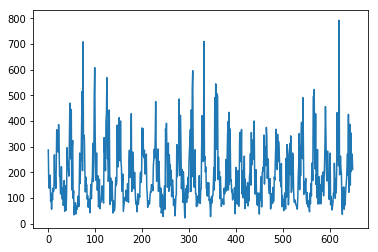

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[362323.90530153445, 4429.839208465563, 9116.984136060772]
(array([137., 138.]), array([ 58., 477.]), array([-14., 425.]), 354.0)
(array([205., 207.]), array([-20., 397.]), array([-14., 424.]), 203.0)
(array([200., 203.]), array([-14., 393.]), array([-14., 424.]), 239.0)
(array([1561., 1602.]), array([-34., 375.]), array([-14., 426.]), 271.0)
(array([0., 0.]), array([-31., 359.]), array([-14., 426.]), 211.0)
(0.0, 1.0, 1.0)


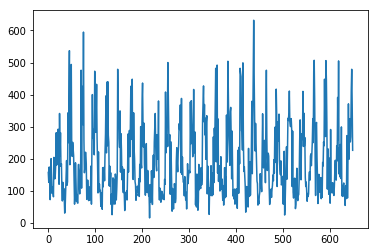

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[67089.22247864127, 15815.654118849086, 27773.800248007617]
(array([342., 344.]), array([105., 469.]), array([ -9., 473.]), 268.0)
(array([445., 450.]), array([ 88., 465.]), array([ -9., 471.]), 411.0)
(array([18., 19.]), array([ 81., 452.]), array([ -9., 473.]), 479.0)
(array([615., 631.]), array([ 48., 438.]), array([-10., 472.]), 368.0)
(array([0., 0.]), array([ 50., 424.]), array([ -9., 470.]), 226.0)
(0.0, 0.8, 0.8)


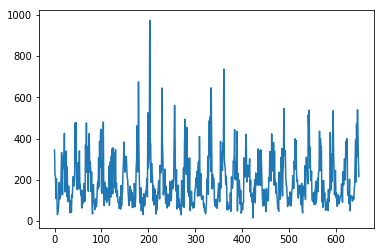

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[49333.192267863706, 8871.710894423935, 16780.070845704264]
(array([347., 350.]), array([129., 557.]), array([ -0., 594.]), 312.0)
(array([785., 793.]), array([183., 623.]), array([ -1., 593.]), 540.0)
(array([139., 141.]), array([165., 567.]), array([ -0., 593.]), 416.0)
(array([43., 44.]), array([163., 580.]), array([ -1., 593.]), 289.0)
(array([0., 0.]), array([132., 540.]), array([ -0., 594.]), 216.0)
(0.0, 1.0, 1.0)


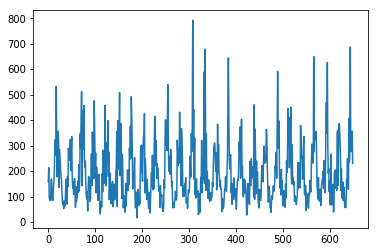

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[53745.59335505328, 99175.62184283427, 42263.812877340126]
(array([19., 19.]), array([385., 824.]), array([ 85., 815.]), 280.0)
(array([529., 535.]), array([441., 848.]), array([ 85., 816.]), 286.0)
(array([338., 343.]), array([379., 800.]), array([ 85., 816.]), 276.0)
(array([637., 653.]), array([380., 778.]), array([ 85., 815.]), 357.0)
(array([0., 0.]), array([371., 780.]), array([ 85., 816.]), 230.0)
(0.0, 0.0, 1.0)


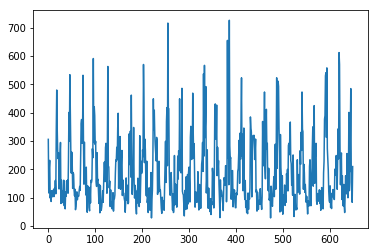

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[21425.25174059475, 16275.513513136986, 17806.37671102235]
(array([604., 609.]), array([ 72., 498.]), array([-13., 526.]), 485.0)
(array([127., 128.]), array([ 89., 497.]), array([-12., 527.]), 192.0)
(array([8., 8.]), array([ 61., 471.]), array([-13., 527.]), 203.0)
(array([5., 5.]), array([ 38., 451.]), array([-13., 527.]), 84.0)
(array([0., 0.]), array([ 20., 439.]), array([-12., 526.]), 210.0)
(0.0, 1.0, 1.0)


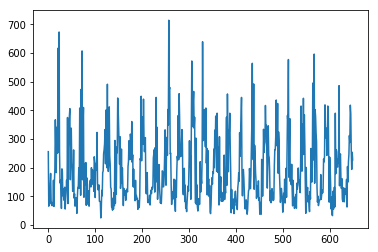

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[37402.34172425042, 10365.413231430804, 4501.528881798459]
(array([409., 412.]), array([100., 511.]), array([ -4., 539.]), 389.0)
(array([2., 2.]), array([197., 577.]), array([ -4., 541.]), 259.0)
(array([126., 128.]), array([124., 530.]), array([ -4., 540.]), 194.0)
(array([0., 0.]), array([155., 530.]), array([ -4., 538.]), 254.0)
(array([0., 0.]), array([111., 511.]), array([ -3., 538.]), 227.0)
(0.0, 1.0, 1.0)


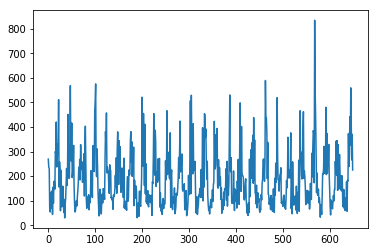

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[236478.09481398738, 10013.798193664228, 18912.342789365615]
(array([54., 54.]), array([219., 607.]), array([ -6., 587.]), 559.0)
(array([534., 540.]), array([183., 576.]), array([ -6., 589.]), 409.0)
(array([332., 338.]), array([194., 561.]), array([ -6., 589.]), 266.0)
(array([1278., 1312.]), array([158., 552.]), array([ -5., 587.]), 370.0)
(array([0., 0.]), array([167., 552.]), array([ -5., 587.]), 225.0)
(0.0, 1.0, 1.0)


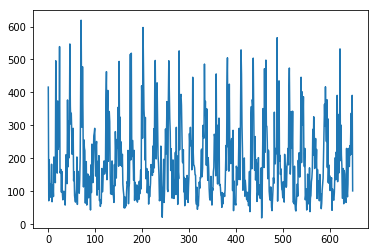

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[45601.273865079136, 11464.645891532931, 17007.23765357088]
(array([424., 428.]), array([ 58., 450.]), array([-11., 440.]), 284.0)
(array([150., 152.]), array([ 49., 423.]), array([-11., 440.]), 337.0)
(array([3., 3.]), array([ 32., 429.]), array([-11., 440.]), 212.0)
(array([728., 745.]), array([ 15., 400.]), array([-11., 439.]), 391.0)
(array([0., 0.]), array([  7., 393.]), array([-11., 441.]), 101.0)
(0.0, 1.0, 1.0)


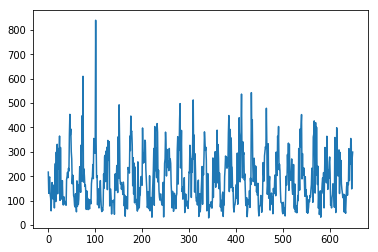

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40383.21956717189, 6868.21948386103, 15110.411726478884]
(array([248., 250.]), array([ 81., 445.]), array([-11., 429.]), 355.0)
(array([182., 183.]), array([ 83., 414.]), array([-11., 428.]), 332.0)
(array([144., 146.]), array([ 52., 401.]), array([-11., 428.]), 148.0)
(array([547., 561.]), array([ 44., 402.]), array([-11., 428.]), 273.0)
(array([0., 0.]), array([ 33., 376.]), array([-12., 427.]), 299.0)
(0.0, 1.0, 1.0)


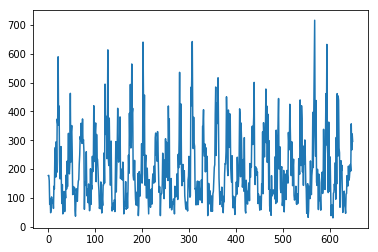

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[52820.766849869164, 14586.033561519633, 23060.321740107313]
(array([27., 27.]), array([  1., 401.]), array([-20., 386.]), 193.0)
(array([300., 303.]), array([ -3., 385.]), array([-20., 387.]), 357.0)
(array([501., 509.]), array([-10., 372.]), array([-20., 387.]), 266.0)
(array([24., 25.]), array([-28., 346.]), array([-20., 386.]), 322.0)
(array([0., 0.]), array([-18., 361.]), array([-20., 385.]), 296.0)
(0.0, 1.0, 1.0)


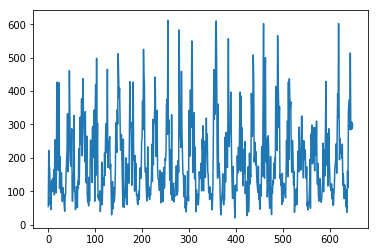

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64829.35108419599, 19402.17761785077, 1732.6814236204918]
(array([401., 404.]), array([199., 629.]), array([  9., 657.]), 284.0)
(array([564., 570.]), array([275., 688.]), array([  9., 653.]), 292.0)
(array([44., 45.]), array([237., 633.]), array([ 10., 655.]), 307.0)
(array([11., 12.]), array([232., 630.]), array([ 10., 655.]), 287.0)
(array([0., 0.]), array([214., 602.]), array([ 10., 656.]), 299.0)
(0.0, 1.0, 1.0)


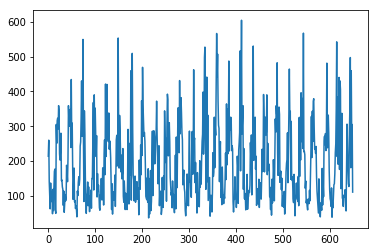

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[32261.96731329871, 45978.57593309984, 21375.60670190248]
(array([212., 214.]), array([285., 660.]), array([  7., 663.]), 181.0)
(array([711., 718.]), array([272., 675.]), array([  7., 662.]), 459.0)
(array([274., 278.]), array([270., 633.]), array([  7., 660.]), 262.0)
(array([18., 18.]), array([241., 623.]), array([  7., 661.]), 305.0)
(array([0., 0.]), array([214., 598.]), array([  7., 661.]), 111.0)
(0.0, 0.4, 1.0)


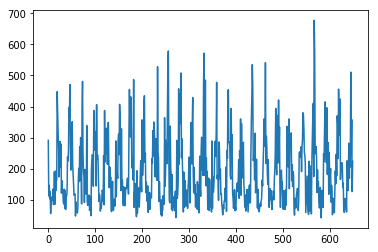

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44398.19890747867, 18684.128567272815, 24745.23686489282]
(array([593., 597.]), array([ 65., 447.]), array([-13., 509.]), 511.0)
(array([440., 445.]), array([ 26., 420.]), array([-13., 507.]), 245.0)
(array([9., 9.]), array([ 30., 400.]), array([-13., 509.]), 358.0)
(array([62., 63.]), array([ 31., 400.]), array([-13., 507.]), 126.0)
(array([0., 0.]), array([ 17., 389.]), array([-12., 508.]), 223.0)
(0.0, 0.8, 0.8)


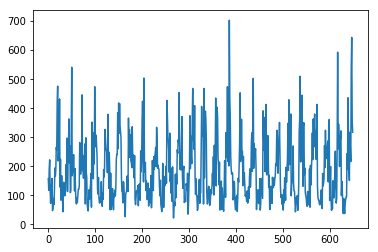

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[127900.33544405767, 51305.063588672216, 76268.64867453263]
(array([45., 45.]), array([107., 468.]), array([-13., 451.]), 216.0)
(array([254., 257.]), array([ 93., 456.]), array([-12., 450.]), 535.0)
(array([22., 22.]), array([ 61., 429.]), array([-13., 449.]), 644.0)
(array([144., 148.]), array([ 64., 419.]), array([-13., 450.]), 358.0)
(array([0., 0.]), array([ 35., 386.]), array([-13., 450.]), 317.0)
(0.0, 0.6, 0.6)


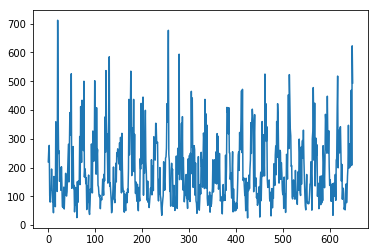

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[127123.66589455737, 104298.36206729655, 92958.07490890319]
(array([139., 140.]), array([-58., 336.]), array([-27., 464.]), 277.0)
(array([777., 786.]), array([-59., 326.]), array([-27., 465.]), 469.0)
(array([0., 0.]), array([-68., 327.]), array([-27., 466.]), 208.0)
(array([140., 143.]), array([-56., 307.]), array([-26., 466.]), 623.0)
(array([0., 0.]), array([-65., 314.]), array([-26., 466.]), 494.0)
(0.0, 0.4, 0.4)


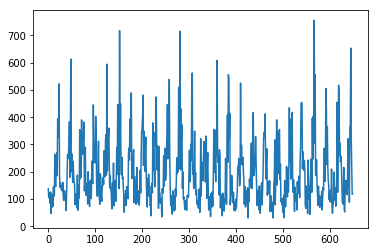

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[16137.21944501106, 31645.90228776937, 43716.5019263155]
(array([549., 553.]), array([ 82., 508.]), array([-12., 496.]), 653.0)
(array([548., 554.]), array([ 32., 440.]), array([-12., 493.]), 321.0)
(array([184., 187.]), array([ 29., 437.]), array([-12., 495.]), 229.0)
(array([154., 158.]), array([ 15., 425.]), array([-12., 495.]), 118.0)
(array([0., 0.]), array([ 10., 418.]), array([-12., 495.]), 119.0)
(0.0, 0.8, 0.8)


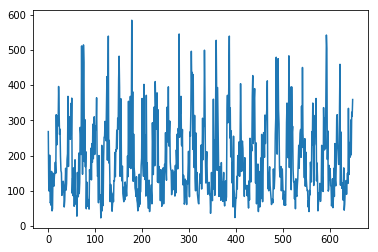

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[285424.32521009096, 21741.88366270886, 21166.011123411416]
(array([311., 313.]), array([  5., 374.]), array([-17., 386.]), 301.0)
(array([191., 193.]), array([-17., 354.]), array([-17., 384.]), 202.0)
(array([6., 6.]), array([-19., 347.]), array([-18., 386.]), 323.0)
(array([1389., 1421.]), array([-29., 344.]), array([-17., 387.]), 311.0)
(array([0., 0.]), array([-35., 325.]), array([-18., 386.]), 359.0)
(0.0, 0.8, 1.0)


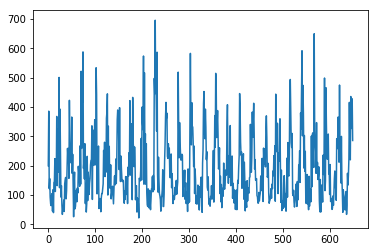

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[84068.7657229775, 21192.589031199986, 24250.408230863402]
(array([645., 649.]), array([ 72., 459.]), array([-16., 528.]), 436.0)
(array([504., 509.]), array([ 45., 422.]), array([-16., 528.]), 327.0)
(array([0., 0.]), array([ 39., 424.]), array([-15., 527.]), 334.0)
(array([40., 41.]), array([ -7., 397.]), array([-15., 528.]), 428.0)
(array([0., 0.]), array([ -2., 384.]), array([-16., 530.]), 286.0)
(0.0, 0.8, 1.0)


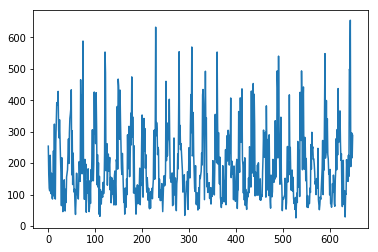

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[24291.971003558865, 188781.65876730764, 84350.67524975483]
(array([164., 166.]), array([451., 867.]), array([ 60., 879.]), 189.0)
(array([127., 128.]), array([464., 907.]), array([ 60., 876.]), 213.0)
(array([121., 122.]), array([467., 874.]), array([ 60., 878.]), 296.0)
(array([227., 233.]), array([457., 887.]), array([ 60., 879.]), 217.0)
(array([0., 0.]), array([448., 867.]), array([ 60., 879.]), 288.0)
(0.0, 0.0, 1.0)


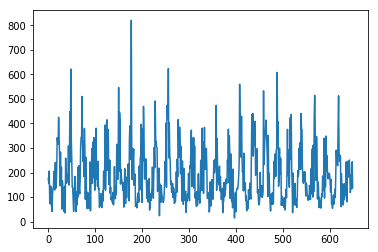

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[19624.132841023, 3716.8512610731837, 6569.552778773619]
(array([137., 138.]), array([-27., 344.]), array([-33., 327.]), 137.0)
(array([131., 132.]), array([-60., 328.]), array([-32., 329.]), 190.0)
(array([8., 8.]), array([-61., 321.]), array([-32., 329.]), 134.0)
(array([0., 0.]), array([-75., 308.]), array([-33., 328.]), 244.0)
(array([0., 0.]), array([-79., 319.]), array([-33., 327.]), 139.0)
(0.2, 1.0, 1.0)


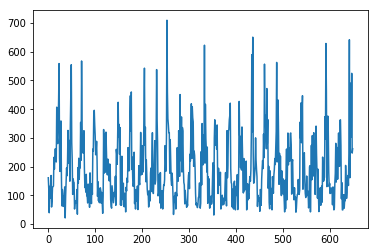

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[127571.33722364294, 15179.37623167229, 15857.890890956867]
(array([670., 675.]), array([141., 545.]), array([  1., 597.]), 491.0)
(array([36., 36.]), array([202., 587.]), array([  0., 597.]), 303.0)
(array([1190., 1207.]), array([165., 533.]), array([  1., 598.]), 525.0)
(array([139., 142.]), array([143., 523.]), array([ -0., 597.]), 247.0)
(array([0., 0.]), array([118., 514.]), array([  0., 596.]), 262.0)
(0.0, 1.0, 1.0)


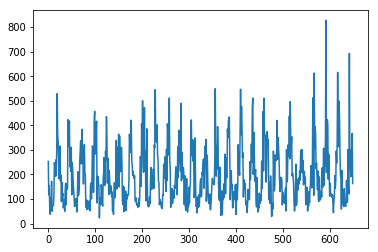

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[49442.099371808654, 7237.9297724875605, 15854.06999391896]
(array([14., 15.]), array([-29., 365.]), array([-30., 384.]), 191.0)
(array([85., 86.]), array([ 24., 423.]), array([-30., 383.]), 228.0)
(array([3., 3.]), array([-27., 375.]), array([-29., 381.]), 199.0)
(array([5., 6.]), array([-10., 372.]), array([-30., 384.]), 367.0)
(array([0., 0.]), array([-46., 362.]), array([-30., 383.]), 163.0)
(0.0, 1.0, 1.0)


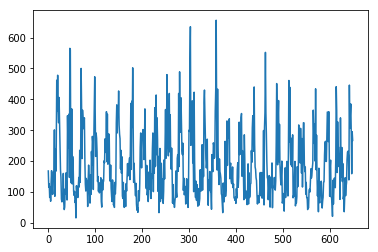

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[369646.8513284276, 8675.823575109735, 9117.266329114707]
(array([498., 502.]), array([ 61., 405.]), array([ -6., 451.]), 385.0)
(array([562., 567.]), array([ 37., 391.]), array([ -6., 449.]), 293.0)
(array([210., 213.]), array([ 40., 392.]), array([ -6., 449.]), 159.0)
(array([1573., 1616.]), array([ 14., 377.]), array([ -6., 450.]), 295.0)
(array([0., 0.]), array([ 15., 364.]), array([ -6., 450.]), 267.0)
(0.0, 1.0, 1.0)


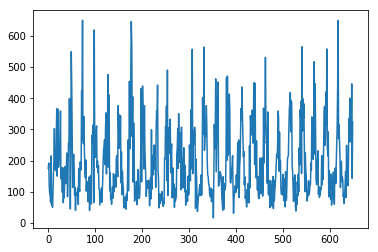

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[67431.9627892186, 13580.945993091369, 20228.78163492098]
(array([467., 470.]), array([ 67., 475.]), array([-15., 466.]), 327.0)
(array([44., 44.]), array([ 26., 400.]), array([-16., 466.]), 286.0)
(array([825., 837.]), array([ 49., 424.]), array([-15., 466.]), 446.0)
(array([63., 65.]), array([  9., 398.]), array([-15., 467.]), 143.0)
(array([0., 0.]), array([ 25., 395.]), array([-16., 467.]), 323.0)
(0.0, 0.8, 1.0)


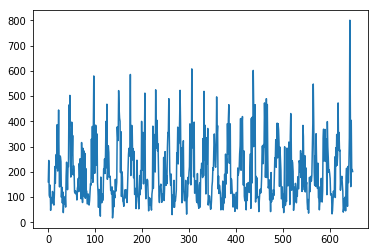

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18545.167207226223, 81793.61797753016, 30920.559837442986]
(array([179., 181.]), array([346., 815.]), array([  5., 739.]), 141.0)
(array([625., 632.]), array([276., 674.]), array([  4., 738.]), 404.0)
(array([183., 186.]), array([293., 702.]), array([  4., 739.]), 203.0)
(array([218., 223.]), array([266., 687.]), array([  4., 738.]), 209.0)
(array([0., 0.]), array([248., 654.]), array([  5., 739.]), 201.0)
(0.0, 0.2, 1.0)


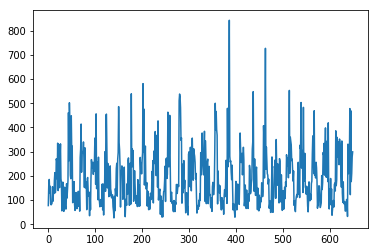

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[45528.62404051541, 8121.328658802321, 15822.535567384411]
(array([675., 680.]), array([ 89., 526.]), array([-13., 547.]), 469.0)
(array([262., 265.]), array([ 19., 404.]), array([-13., 548.]), 176.0)
(array([303., 308.]), array([ 43., 435.]), array([-12., 548.]), 210.0)
(array([0., 0.]), array([ 15., 402.]), array([-13., 548.]), 279.0)
(array([0., 0.]), array([  2., 412.]), array([-13., 548.]), 299.0)
(0.0, 1.0, 1.0)


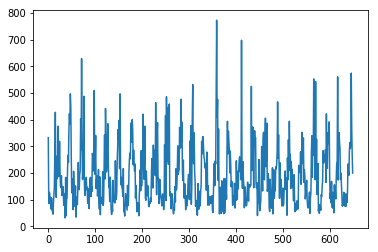

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[77772.05833778519, 16845.282491734884, 21606.511928363405]
(array([445., 448.]), array([125., 515.]), array([ -8., 589.]), 308.0)
(array([977., 987.]), array([118., 498.]), array([ -8., 588.]), 575.0)
(array([68., 69.]), array([110., 486.]), array([ -8., 591.]), 369.0)
(array([0., 0.]), array([107., 487.]), array([ -8., 590.]), 272.0)
(array([0., 0.]), array([ 90., 488.]), array([ -8., 591.]), 200.0)
(0.0, 0.8, 1.0)


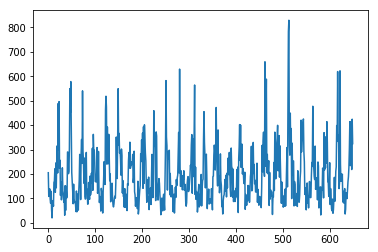

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[110601.80530145022, 22798.182164348626, 21300.096567975448]
(array([77., 77.]), array([ 81., 462.]), array([-13., 479.]), 248.0)
(array([712., 719.]), array([ 17., 401.]), array([-13., 479.]), 413.0)
(array([0., 0.]), array([ 11., 427.]), array([-13., 480.]), 218.0)
(array([943., 964.]), array([ -7., 391.]), array([-13., 480.]), 424.0)
(array([0., 0.]), array([ -6., 381.]), array([-12., 479.]), 324.0)
(0.0, 0.6, 1.0)


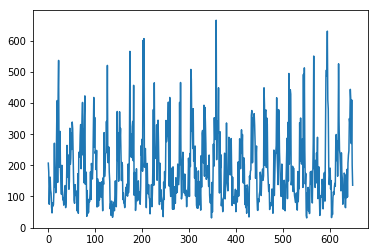

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[41793.454983280215, 18336.864643006356, 31825.1117960196]
(array([43., 44.]), array([ 25., 413.]), array([-18., 388.]), 411.0)
(array([192., 194.]), array([ -3., 360.]), array([-18., 387.]), 270.0)
(array([504., 512.]), array([ -4., 371.]), array([-18., 388.]), 410.0)
(array([0., 0.]), array([-12., 361.]), array([-17., 388.]), 200.0)
(array([0., 0.]), array([-22., 354.]), array([-18., 390.]), 136.0)
(0.0, 0.8, 0.6)


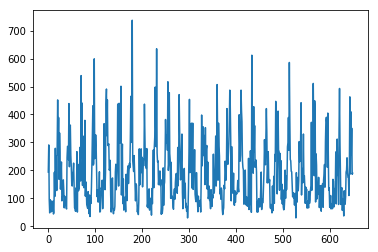

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18416.31589110983, 28118.006641143886, 21856.560153307066]
(array([469., 472.]), array([-40., 392.]), array([-17., 423.]), 410.0)
(array([461., 466.]), array([-99., 333.]), array([-17., 423.]), 255.0)
(array([254., 258.]), array([-90., 336.]), array([-17., 422.]), 351.0)
(array([184., 189.]), array([-88., 300.]), array([-17., 422.]), 186.0)
(array([0., 0.]), array([-89., 301.]), array([-17., 422.]), 190.0)
(0.2, 0.6, 1.0)


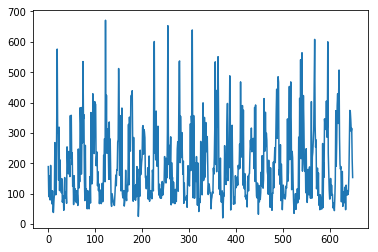

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[95896.44174818782, 11933.816671490922, 5615.573492438936]
(array([13., 13.]), array([186., 619.]), array([  1., 585.]), 343.0)
(array([410., 415.]), array([168., 582.]), array([  1., 586.]), 305.0)
(array([872., 884.]), array([151., 567.]), array([  2., 586.]), 315.0)
(array([75., 77.]), array([144., 559.]), array([  1., 586.]), 211.0)
(array([0., 0.]), array([130., 522.]), array([  2., 587.]), 153.0)
(0.0, 1.0, 1.0)


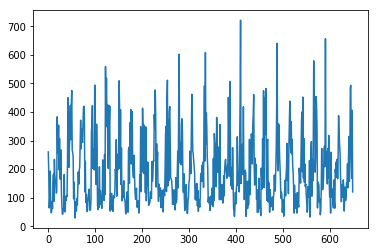

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[16495.411115308467, 18723.426397957843, 21809.800578236194]
(array([416., 419.]), array([118., 517.]), array([ -2., 532.]), 493.0)
(array([105., 106.]), array([130., 557.]), array([ -3., 534.]), 275.0)
(array([26., 26.]), array([100., 527.]), array([ -2., 532.]), 168.0)
(array([286., 293.]), array([107., 499.]), array([ -2., 532.]), 406.0)
(array([0., 0.]), array([ 78., 492.]), array([ -3., 533.]), 120.0)
(0.0, 1.0, 1.0)


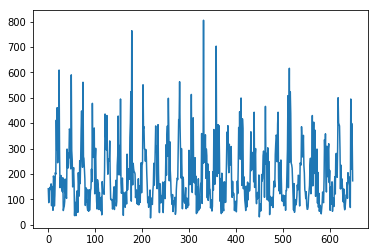

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[36815.868263676166, 69586.0937036011, 64984.13004040603]
(array([301., 303.]), array([-96., 302.]), array([-35., 317.]), 495.0)
(array([119., 121.]), array([-117.,  276.]), array([-35., 316.]), 219.0)
(array([113., 115.]), array([-119.,  283.]), array([-34., 317.]), 399.0)
(array([177., 181.]), array([-124.,  283.]), array([-34., 316.]), 340.0)
(array([0., 0.]), array([-134.,  271.]), array([-35., 317.]), 173.0)
(0.0, 0.4, 0.4)


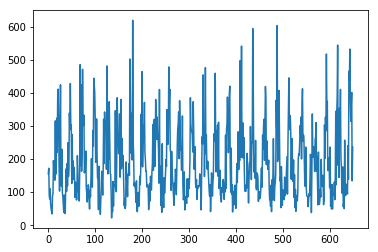

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18926.538578002095, 37220.61569347842, 14140.647545315802]
(array([246., 248.]), array([322., 692.]), array([ 18., 668.]), 314.0)
(array([322., 326.]), array([275., 648.]), array([ 18., 666.]), 365.0)
(array([574., 583.]), array([279., 662.]), array([ 18., 669.]), 401.0)
(array([95., 98.]), array([264., 633.]), array([ 18., 668.]), 134.0)
(array([0., 0.]), array([256., 616.]), array([ 18., 668.]), 236.0)
(0.0, 0.4, 1.0)


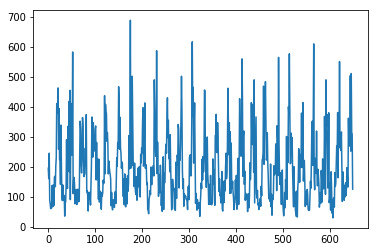

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[103906.15920171555, 15773.834126321477, 15594.18700897168]
(array([269., 271.]), array([174., 575.]), array([ -5., 606.]), 252.0)
(array([919., 929.]), array([183., 601.]), array([ -5., 606.]), 511.0)
(array([867., 880.]), array([170., 557.]), array([ -5., 606.]), 312.0)
(array([176., 181.]), array([167., 554.]), array([ -5., 607.]), 310.0)
(array([0., 0.]), array([147., 533.]), array([ -5., 607.]), 125.0)
(0.0, 0.8, 1.0)


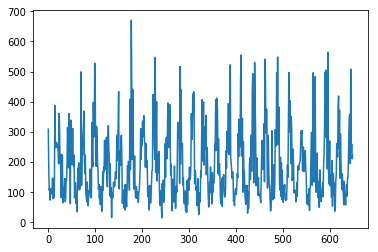

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[17976.883422586438, 23952.65707724997, 24225.090627207825]
(array([635., 640.]), array([ -8., 413.]), array([-22., 523.]), 508.0)
(array([289., 292.]), array([-49., 339.]), array([-22., 521.]), 234.0)
(array([206., 209.]), array([-33., 343.]), array([-22., 523.]), 260.0)
(array([78., 80.]), array([-55., 330.]), array([-21., 521.]), 211.0)
(array([0., 0.]), array([-60., 326.]), array([-22., 521.]), 223.0)
(0.0, 0.8, 1.0)


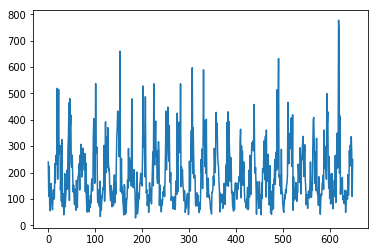

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18316.607938080342, 5277.163792199012, 6525.798670062259]
(array([343., 345.]), array([100., 482.]), array([-11., 486.]), 246.0)
(array([228., 231.]), array([112., 496.]), array([-10., 487.]), 336.0)
(array([283., 288.]), array([ 74., 469.]), array([-11., 484.]), 278.0)
(array([16., 17.]), array([ 64., 463.]), array([-10., 485.]), 109.0)
(array([0., 0.]), array([ 59., 428.]), array([-10., 487.]), 249.0)
(0.0, 1.0, 1.0)


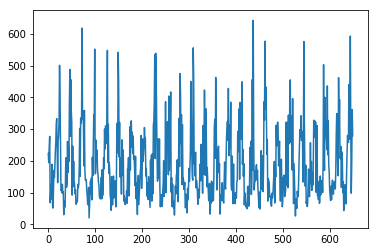

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[45583.01675321794, 15034.666231332882, 15042.359063329717]
(array([419., 422.]), array([-30., 381.]), array([-15., 422.]), 301.0)
(array([172., 174.]), array([ 27., 437.]), array([-15., 423.]), 98.0)
(array([181., 184.]), array([-15., 368.]), array([-15., 421.]), 185.0)
(array([0., 0.]), array([-24., 392.]), array([-16., 422.]), 361.0)
(array([0., 0.]), array([-25., 368.]), array([-15., 422.]), 279.0)
(0.0, 1.0, 1.0)


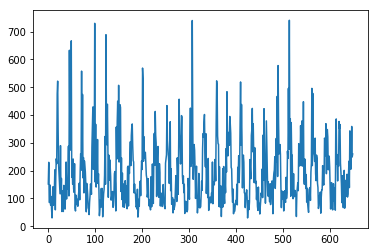

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[224759.86584105162, 9670.994230499065, 11977.489001975964]
(array([82., 83.]), array([ 37., 469.]), array([-15., 420.]), 205.0)
(array([191., 193.]), array([-38., 375.]), array([-15., 416.]), 266.0)
(array([190., 193.]), array([-15., 416.]), array([-14., 418.]), 359.0)
(array([1238., 1269.]), array([-31., 368.]), array([-15., 417.]), 249.0)
(array([0., 0.]), array([-38., 392.]), array([-15., 419.]), 260.0)
(0.0, 1.0, 1.0)


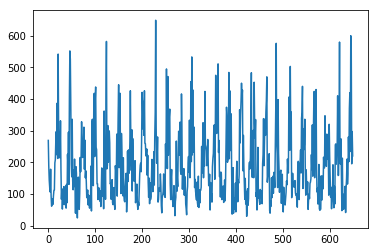

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[57373.89120057718, 35032.33297866691, 48812.49830047817]
(array([639., 644.]), array([106., 513.]), array([-10., 553.]), 600.0)
(array([176., 178.]), array([ 58., 470.]), array([-10., 552.]), 556.0)
(array([33., 33.]), array([ 76., 448.]), array([-10., 553.]), 195.0)
(array([550., 562.]), array([ 34., 437.]), array([-10., 554.]), 297.0)
(array([0., 0.]), array([ 35., 443.]), array([-11., 552.]), 220.0)
(0.0, 0.6, 0.6)


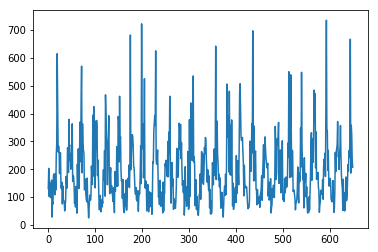

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[29157.22408065838, 76537.85642845582, 30677.515433777822]
(array([261., 263.]), array([327., 754.]), array([ 37., 753.]), 186.0)
(array([605., 612.]), array([345., 784.]), array([ 37., 757.]), 358.0)
(array([280., 285.]), array([327., 725.]), array([ 37., 755.]), 326.0)
(array([54., 56.]), array([329., 743.]), array([ 37., 755.]), 236.0)
(array([0., 0.]), array([299., 701.]), array([ 37., 755.]), 207.0)
(0.0, 0.2, 1.0)


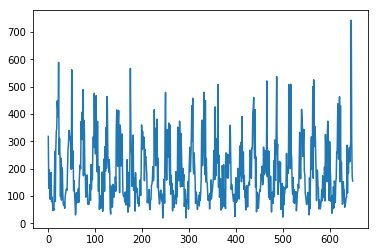

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64500.17462826167, 51480.08743176457, 57273.48144848107]
(array([347., 350.]), array([ 83., 438.]), array([ -9., 475.]), 300.0)
(array([708., 717.]), array([ 74., 418.]), array([ -9., 474.]), 743.0)
(array([799., 813.]), array([ 56., 426.]), array([ -9., 473.]), 310.0)
(array([390., 400.]), array([ 45., 410.]), array([-10., 474.]), 173.0)
(array([0., 0.]), array([ 36., 410.]), array([-10., 474.]), 155.0)
(0.0, 0.8, 0.8)


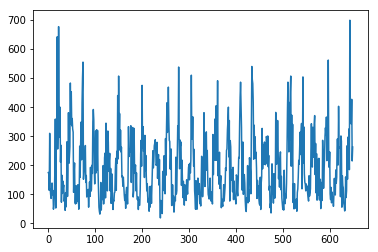

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[60066.93801451649, 47515.59480193868, 12897.329271008603]
(array([270., 272.]), array([409., 766.]), array([  8., 737.]), 361.0)
(array([224., 227.]), array([318., 711.]), array([  9., 736.]), 342.0)
(array([866., 880.]), array([343., 727.]), array([  8., 737.]), 427.0)
(array([109., 112.]), array([334., 677.]), array([  8., 737.]), 215.0)
(array([0., 0.]), array([331., 685.]), array([  9., 737.]), 263.0)
(0.0, 0.4, 1.0)


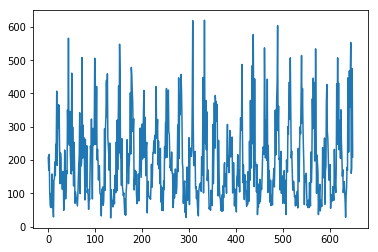

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[71705.6695579411, 26577.33548366289, 34530.84104321495]
(array([319., 321.]), array([116., 501.]), array([ -6., 503.]), 553.0)
(array([300., 303.]), array([109., 501.]), array([ -6., 505.]), 160.0)
(array([34., 34.]), array([110., 510.]), array([ -6., 505.]), 176.0)
(array([6., 6.]), array([111., 469.]), array([ -6., 505.]), 475.0)
(array([0., 0.]), array([ 83., 474.]), array([ -6., 505.]), 209.0)
(0.0, 0.6, 0.8)


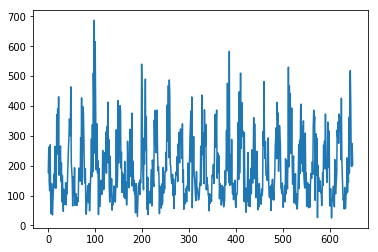

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[43098.1910345889, 108157.82234246447, 44728.103896635424]
(array([562., 566.]), array([382., 780.]), array([ 32., 783.]), 403.0)
(array([226., 228.]), array([386., 784.]), array([ 31., 779.]), 203.0)
(array([231., 235.]), array([388., 764.]), array([ 32., 782.]), 197.0)
(array([649., 665.]), array([380., 759.]), array([ 31., 780.]), 274.0)
(array([0., 0.]), array([355., 759.]), array([ 32., 781.]), 203.0)
(0.0, 0.2, 1.0)


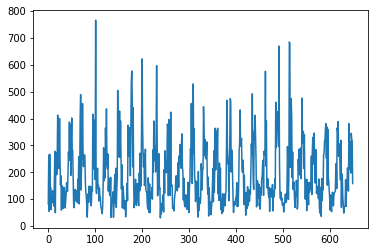

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[48731.1678085278, 5401.404430372971, 9764.849583926796]
(array([89., 89.]), array([ 34., 461.]), array([-12., 472.]), 197.0)
(array([607., 613.]), array([ 50., 463.]), array([-12., 471.]), 345.0)
(array([511., 518.]), array([ 29., 457.]), array([-12., 474.]), 323.0)
(array([0., 0.]), array([ 18., 459.]), array([-12., 474.]), 317.0)
(array([0., 0.]), array([  5., 419.]), array([-13., 473.]), 158.0)
(0.0, 1.0, 1.0)


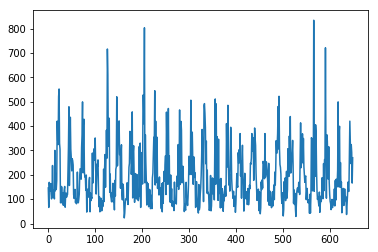

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34385.722797746675, 5273.601387646972, 3510.9345421315934]
(array([97., 98.]), array([146., 541.]), array([ -7., 527.]), 246.0)
(array([220., 222.]), array([125., 542.]), array([ -8., 527.]), 324.0)
(array([85., 86.]), array([110., 517.]), array([ -7., 525.]), 291.0)
(array([11., 11.]), array([ 74., 496.]), array([ -7., 526.]), 166.0)
(array([0., 0.]), array([ 78., 496.]), array([ -8., 524.]), 270.0)
(0.0, 1.0, 1.0)


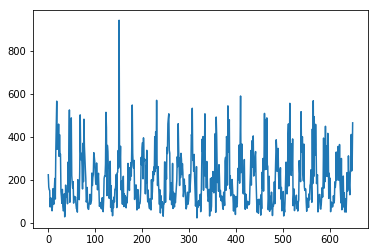

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[70857.75239112457, 28987.24877563115, 38385.18664989386]
(array([332., 334.]), array([-17., 388.]), array([-21., 401.]), 246.0)
(array([261., 264.]), array([ 10., 409.]), array([-21., 401.]), 411.0)
(array([33., 33.]), array([-32., 380.]), array([-21., 400.]), 241.0)
(array([18., 18.]), array([-19., 390.]), array([-21., 399.]), 273.0)
(array([0., 0.]), array([-47., 369.]), array([-21., 399.]), 465.0)
(0.0, 0.6, 0.6)


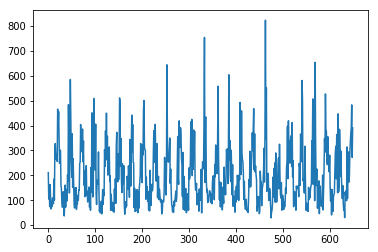

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47446.05128272794, 26423.357428827752, 37128.850999904316]
(array([230., 232.]), array([ 69., 466.]), array([-10., 454.]), 369.0)
(array([395., 399.]), array([ 33., 435.]), array([-11., 454.]), 389.0)
(array([729., 740.]), array([ 38., 428.]), array([-11., 454.]), 483.0)
(array([224., 229.]), array([ 18., 417.]), array([-11., 452.]), 272.0)
(array([0., 0.]), array([ -5., 414.]), array([-11., 454.]), 391.0)
(0.0, 0.8, 0.8)


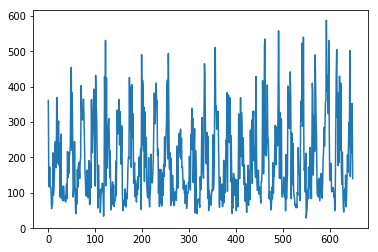

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[35833.79957277815, 8608.35885159261, 8612.01222520424]
(array([69., 70.]), array([140., 525.]), array([-10., 483.]), 217.0)
(array([396., 400.]), array([ 45., 443.]), array([-10., 482.]), 214.0)
(array([28., 28.]), array([ 70., 456.]), array([-10., 483.]), 333.0)
(array([245., 251.]), array([ 67., 430.]), array([-10., 482.]), 353.0)
(array([0., 0.]), array([ 49., 430.]), array([-10., 482.]), 140.0)
(0.0, 1.0, 1.0)


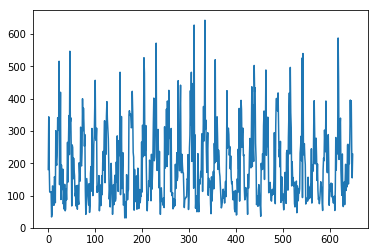

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[69858.87728879225, 14645.996464874344, 6820.469527829657]
(array([392., 395.]), array([177., 566.]), array([ -5., 568.]), 317.0)
(array([35., 35.]), array([200., 570.]), array([ -5., 568.]), 394.0)
(array([578., 588.]), array([187., 563.]), array([ -5., 571.]), 242.0)
(array([366., 375.]), array([174., 545.]), array([ -4., 567.]), 155.0)
(array([0., 0.]), array([156., 537.]), array([ -5., 569.]), 228.0)
(0.0, 0.8, 1.0)


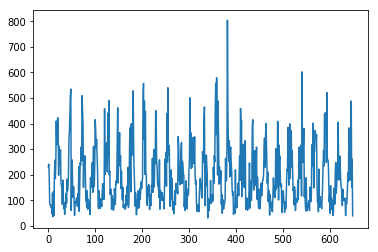

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[47135.2521542302, 29742.2188264043, 36095.616812745575]
(array([341., 344.]), array([-29., 352.]), array([-29., 360.]), 261.0)
(array([68., 69.]), array([-16., 342.]), array([-30., 361.]), 488.0)
(array([3., 3.]), array([-39., 344.]), array([-29., 361.]), 150.0)
(array([87., 89.]), array([-60., 314.]), array([-30., 362.]), 261.0)
(array([0., 0.]), array([-60., 311.]), array([-29., 360.]), 39.0)
(0.0, 0.8, 0.8)


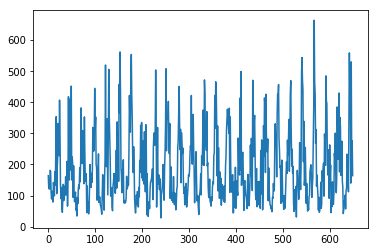

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44023.660456624995, 36025.86670040404, 21634.95790696282]
(array([110., 110.]), array([247., 619.]), array([ 14., 603.]), 140.0)
(array([233., 236.]), array([234., 616.]), array([ 14., 606.]), 530.0)
(array([44., 45.]), array([208., 588.]), array([ 13., 604.]), 215.0)
(array([0., 0.]), array([206., 594.]), array([ 13., 604.]), 276.0)
(array([0., 0.]), array([193., 556.]), array([ 13., 604.]), 164.0)
(0.0, 0.6, 1.0)


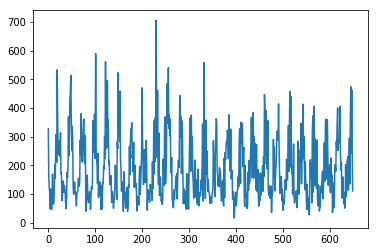

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50735.09638158577, 48656.82859781322, 38340.180428670836]
(array([664., 668.]), array([-43., 317.]), array([-28., 560.]), 474.0)
(array([128., 130.]), array([-28., 343.]), array([-28., 559.]), 243.0)
(array([73., 74.]), array([-44., 313.]), array([-28., 559.]), 463.0)
(array([46., 47.]), array([-38., 333.]), array([-27., 558.]), 247.0)
(array([0., 0.]), array([-66., 305.]), array([-28., 557.]), 110.0)
(0.0, 0.6, 1.0)


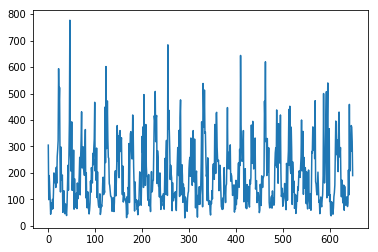

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64569.31129672995, 3468.546714100092, 12483.007719326382]
(array([340., 342.]), array([ 90., 497.]), array([ -8., 496.]), 281.0)
(array([24., 24.]), array([110., 517.]), array([ -9., 497.]), 379.0)
(array([46., 47.]), array([ 91., 486.]), array([ -9., 497.]), 373.0)
(array([92., 94.]), array([ 95., 479.]), array([ -8., 498.]), 318.0)
(array([0., 0.]), array([ 65., 464.]), array([ -8., 497.]), 190.0)
(0.0, 1.0, 1.0)


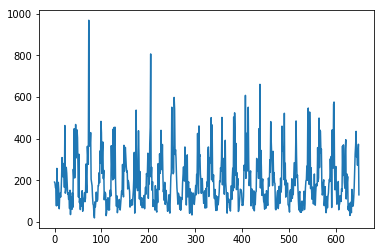

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[285161.12117985514, 7978.106775642426, 7118.058049099357]
(array([96., 96.]), array([148., 576.]), array([  0., 560.]), 313.0)
(array([282., 285.]), array([146., 551.]), array([  1., 558.]), 272.0)
(array([557., 566.]), array([129., 538.]), array([  1., 560.]), 334.0)
(array([1500., 1536.]), array([101., 529.]), array([  1., 559.]), 373.0)
(array([0., 0.]), array([ 71., 495.]), array([  1., 558.]), 130.0)
(0.0, 1.0, 1.0)


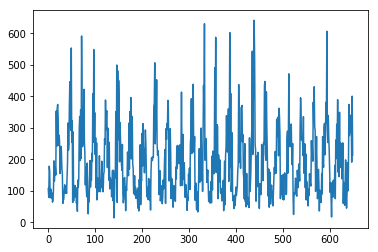

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[56580.759205947616, 26157.259336975618, 28085.408332832878]
(array([198., 200.]), array([-35., 341.]), array([-19., 395.]), 340.0)
(array([551., 557.]), array([-20., 359.]), array([-18., 394.]), 314.0)
(array([197., 200.]), array([-28., 301.]), array([-18., 394.]), 191.0)
(array([0., 0.]), array([-26., 310.]), array([-18., 396.]), 400.0)
(array([0., 0.]), array([-39., 322.]), array([-18., 396.]), 213.0)
(0.0, 0.8, 0.8)


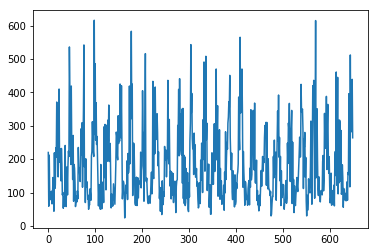

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[95574.48671904225, 4175.271056374848, 6409.6636793120015]
(array([36., 37.]), array([110., 529.]), array([  1., 591.]), 281.0)
(array([91., 92.]), array([243., 644.]), array([  1., 592.]), 350.0)
(array([249., 252.]), array([166., 543.]), array([  2., 591.]), 337.0)
(array([952., 973.]), array([186., 566.]), array([  1., 591.]), 439.0)
(array([0., 0.]), array([147., 528.]), array([  1., 591.]), 264.0)
(0.0, 1.0, 1.0)


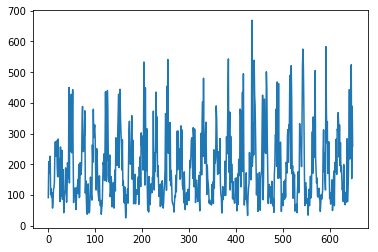

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[56753.494304237865, 15844.819237531085, 29965.782398384174]
(array([1., 2.]), array([116., 487.]), array([-11., 484.]), 294.0)
(array([370., 374.]), array([104., 507.]), array([-11., 485.]), 524.0)
(array([68., 69.]), array([ 91., 485.]), array([-11., 484.]), 153.0)
(array([70., 71.]), array([ 70., 467.]), array([-11., 482.]), 389.0)
(array([0., 0.]), array([ 47., 452.]), array([-11., 484.]), 258.0)
(0.0, 0.8, 0.8)


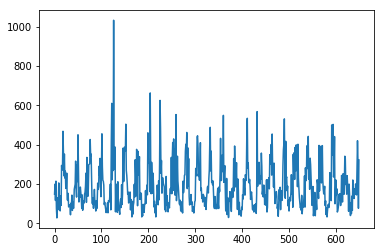

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40314.137552348104, 41421.63674048261, 39023.691107354956]
(array([249., 251.]), array([-51., 334.]), array([-30., 342.]), 269.0)
(array([429., 434.]), array([-76., 298.]), array([-31., 343.]), 420.0)
(array([6., 6.]), array([-84., 311.]), array([-31., 344.]), 311.0)
(array([12., 12.]), array([-101.,  291.]), array([-31., 342.]), 76.0)
(array([0., 0.]), array([-106.,  305.]), array([-30., 342.]), 322.0)
(0.0, 0.6, 0.8)


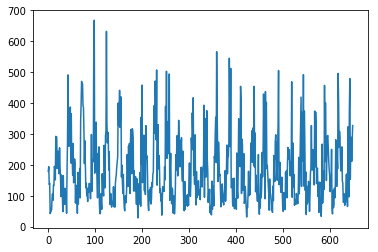

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[33692.52537593011, 8559.658261680033, 13732.314706813355]
(array([329., 331.]), array([ 84., 502.]), array([-17., 445.]), 268.0)
(array([50., 51.]), array([-18., 377.]), array([-17., 445.]), 289.0)
(array([185., 188.]), array([ 23., 419.]), array([-18., 446.]), 211.0)
(array([260., 267.]), array([ -4., 372.]), array([-17., 446.]), 279.0)
(array([0., 0.]), array([-12., 373.]), array([-17., 446.]), 327.0)
(0.0, 1.0, 1.0)


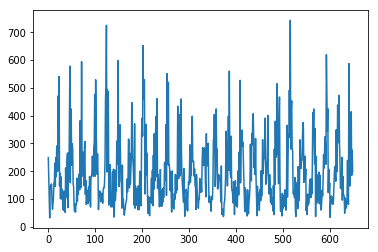

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[29241.051036639885, 43050.764926565505, 35280.153791890225]
(array([293., 295.]), array([-108.,  320.]), array([-28., 330.]), 317.0)
(array([378., 382.]), array([-123.,  295.]), array([-28., 330.]), 414.0)
(array([6., 6.]), array([-124.,  300.]), array([-28., 331.]), 185.0)
(array([6., 6.]), array([-135.,  283.]), array([-28., 330.]), 276.0)
(array([0., 0.]), array([-126.,  291.]), array([-29., 330.]), 199.0)
(0.0, 0.8, 0.8)


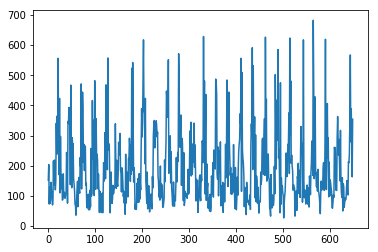

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[45213.11815654058, 53280.29954974594, 16195.950308950016]
(array([329., 331.]), array([307., 748.]), array([ -2., 741.]), 279.0)
(array([115., 116.]), array([320., 771.]), array([ -1., 742.]), 389.0)
(array([112., 114.]), array([297., 735.]), array([ -2., 743.]), 261.0)
(array([199., 203.]), array([272., 698.]), array([ -2., 742.]), 163.0)
(array([0., 0.]), array([225., 685.]), array([ -1., 742.]), 354.0)
(0.0, 0.4, 1.0)


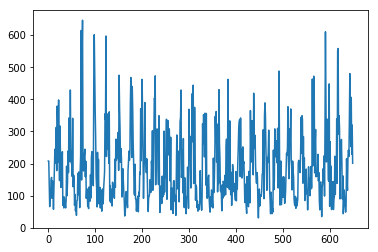

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[85315.49813019592, 6406.250363179328, 14752.250999636473]
(array([334., 337.]), array([-25., 385.]), array([-12., 435.]), 253.0)
(array([49., 49.]), array([ 66., 486.]), array([-12., 436.]), 406.0)
(array([611., 620.]), array([  3., 410.]), array([-13., 435.]), 229.0)
(array([0., 0.]), array([ 32., 416.]), array([-13., 435.]), 320.0)
(array([0., 0.]), array([ -4., 403.]), array([-12., 434.]), 201.0)
(0.0, 1.0, 1.0)


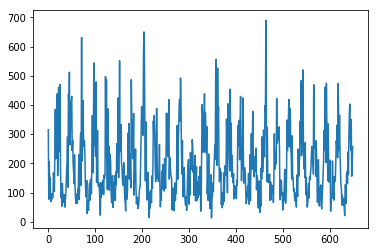

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[36324.34852682602, 3672.990381317184, 6369.1660913676715]
(array([224., 226.]), array([ 57., 448.]), array([-13., 454.]), 245.0)
(array([588., 594.]), array([ 49., 444.]), array([-13., 454.]), 350.0)
(array([325., 330.]), array([ 42., 428.]), array([-13., 453.]), 156.0)
(array([24., 24.]), array([ 29., 419.]), array([-13., 453.]), 191.0)
(array([0., 0.]), array([ 13., 413.]), array([-13., 454.]), 257.0)
(0.0, 1.0, 1.0)


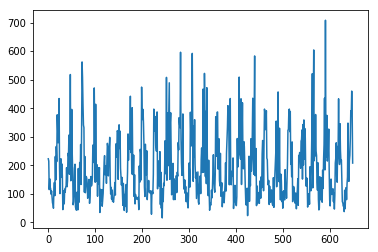

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[80550.87537552774, 13183.841386256352, 27182.548772533522]
(array([522., 525.]), array([101., 489.]), array([-11., 498.]), 391.0)
(array([2., 2.]), array([102., 506.]), array([-10., 497.]), 375.0)
(array([217., 220.]), array([ 86., 474.]), array([-10., 498.]), 460.0)
(array([0., 0.]), array([ 50., 462.]), array([-10., 497.]), 380.0)
(array([0., 0.]), array([ 37., 445.]), array([-11., 497.]), 208.0)
(0.0, 1.0, 1.0)


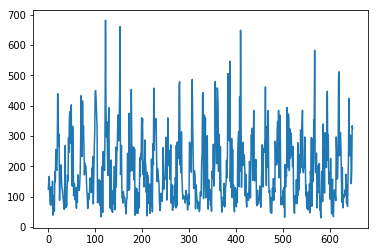

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64299.78133304892, 8356.135445623684, 7604.069408296753]
(array([436., 439.]), array([108., 486.]), array([-10., 487.]), 303.0)
(array([34., 35.]), array([111., 481.]), array([-10., 486.]), 143.0)
(array([525., 533.]), array([ 67., 464.]), array([-10., 487.]), 186.0)
(array([71., 73.]), array([ 51., 448.]), array([-10., 486.]), 334.0)
(array([0., 0.]), array([ 54., 447.]), array([-10., 486.]), 324.0)
(0.0, 1.0, 1.0)


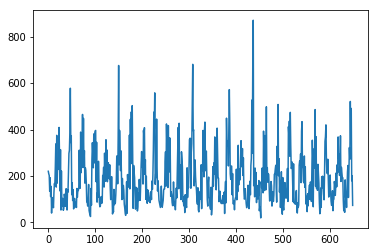

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[35581.153094831796, 36121.50698090605, 23154.352408588136]
(array([41., 41.]), array([163., 624.]), array([ -1., 622.]), 347.0)
(array([302., 305.]), array([258., 669.]), array([ -1., 623.]), 491.0)
(array([51., 52.]), array([201., 614.]), array([ -1., 626.]), 179.0)
(array([35., 35.]), array([201., 605.]), array([ -1., 624.]), 201.0)
(array([0., 0.]), array([161., 572.]), array([ -1., 625.]), 73.0)
(0.0, 0.6, 1.0)


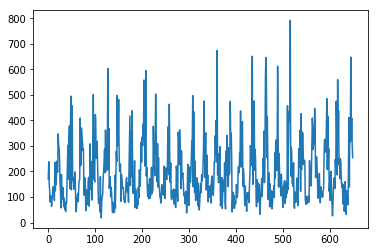

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[82742.32663654815, 19189.946215609598, 37518.74828368251]
(array([355., 358.]), array([150., 567.]), array([ -7., 538.]), 648.0)
(array([612., 618.]), array([103., 518.]), array([ -7., 539.]), 324.0)
(array([697., 708.]), array([101., 521.]), array([ -7., 541.]), 409.0)
(array([0., 0.]), array([ 77., 502.]), array([ -7., 538.]), 305.0)
(array([0., 0.]), array([ 71., 483.]), array([ -7., 540.]), 254.0)
(0.0, 0.8, 0.8)


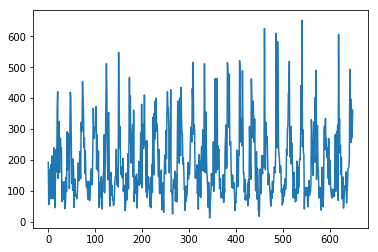

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[56940.82718803801, 24774.031000540155, 4698.439300386528]
(array([227., 228.]), array([294., 672.]), array([ 19., 661.]), 256.0)
(array([164., 166.]), array([264., 665.]), array([ 18., 659.]), 396.0)
(array([0., 0.]), array([259., 660.]), array([ 19., 660.]), 270.0)
(array([440., 451.]), array([245., 639.]), array([ 19., 661.]), 280.0)
(array([0., 0.]), array([240., 621.]), array([ 18., 660.]), 361.0)
(0.0, 0.8, 1.0)


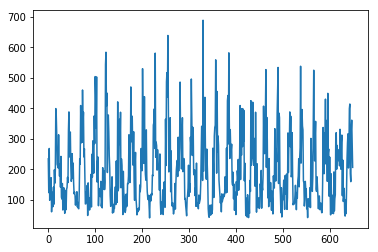

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[67144.31686721963, 7992.469198113735, 9761.75784160504]
(array([62., 62.]), array([ 99., 495.]), array([-13., 472.]), 159.0)
(array([627., 634.]), array([ 53., 449.]), array([-13., 471.]), 330.0)
(array([23., 23.]), array([ 63., 466.]), array([-13., 471.]), 361.0)
(array([6., 6.]), array([ 39., 408.]), array([-14., 472.]), 288.0)
(array([0., 0.]), array([ 43., 408.]), array([-13., 470.]), 206.0)
(0.0, 1.0, 1.0)


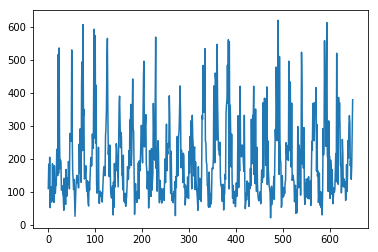

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50222.44486206999, 11892.250583813322, 16902.91643954475]
(array([67., 67.]), array([ 31., 434.]), array([-25., 398.]), 201.0)
(array([30., 30.]), array([ -9., 386.]), array([-25., 399.]), 138.0)
(array([37., 37.]), array([-16., 385.]), array([-26., 398.]), 180.0)
(array([33., 34.]), array([-31., 377.]), array([-25., 398.]), 273.0)
(array([0., 0.]), array([-45., 352.]), array([-26., 399.]), 379.0)
(0.0, 0.8, 1.0)


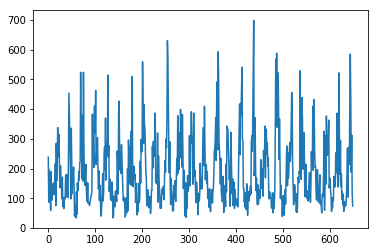

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[24350.345306837287, 134358.65669196547, 66377.64366765355]
(array([179., 180.]), array([379., 782.]), array([ 33., 774.]), 433.0)
(array([350., 354.]), array([404., 776.]), array([ 33., 775.]), 188.0)
(array([414., 421.]), array([375., 773.]), array([ 33., 775.]), 313.0)
(array([0., 0.]), array([376., 750.]), array([ 32., 773.]), 119.0)
(array([0., 0.]), array([341., 738.]), array([ 33., 776.]), 74.0)
(0.0, 0.2, 1.0)


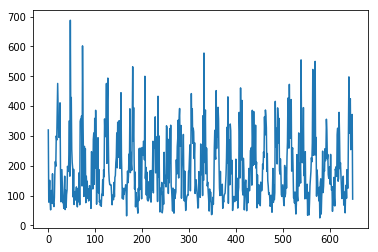

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[55682.30383051813, 14370.070046514482, 19095.303364202464]
(array([158., 159.]), array([ 55., 462.]), array([-10., 427.]), 254.0)
(array([367., 371.]), array([ 15., 407.]), array([-10., 426.]), 345.0)
(array([605., 614.]), array([ 28., 400.]), array([-11., 428.]), 329.0)
(array([788., 810.]), array([  2., 379.]), array([-10., 429.]), 372.0)
(array([0., 0.]), array([ 13., 372.]), array([-10., 427.]), 88.0)
(0.0, 1.0, 1.0)


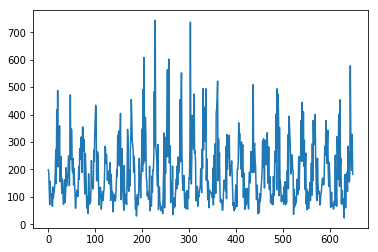

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[40550.62180067973, 12996.694534722263, 4559.890196693297]
(array([484., 487.]), array([ 95., 509.]), array([  0., 548.]), 340.0)
(array([8., 8.]), array([206., 597.]), array([  0., 549.]), 229.0)
(array([133., 135.]), array([134., 515.]), array([ -0., 548.]), 197.0)
(array([19., 19.]), array([154., 543.]), array([  0., 549.]), 328.0)
(array([0., 0.]), array([126., 500.]), array([ -0., 549.]), 182.0)
(0.0, 1.0, 1.0)


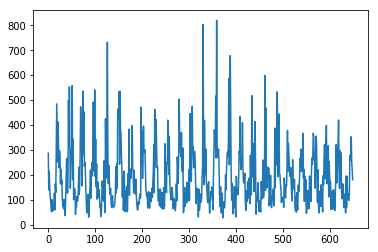

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31011.20792095914, 12445.11837017965, 12473.65235999061]
(array([132., 133.]), array([  4., 418.]), array([-17., 416.]), 261.0)
(array([577., 583.]), array([-64., 337.]), array([-18., 416.]), 353.0)
(array([320., 325.]), array([-55., 358.]), array([-18., 414.]), 252.0)
(array([0., 0.]), array([-61., 368.]), array([-18., 414.]), 222.0)
(array([0., 0.]), array([-65., 351.]), array([-18., 413.]), 181.0)
(0.0, 0.8, 1.0)


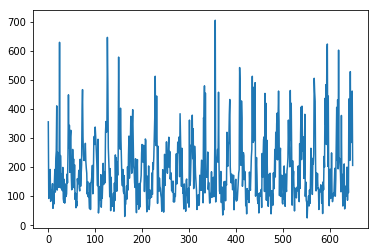

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[121362.87664127152, 15659.058203831844, 7657.015903741798]
(array([352., 355.]), array([192., 626.]), array([ 16., 667.]), 284.0)
(array([476., 481.]), array([302., 704.]), array([ 16., 664.]), 353.0)
(array([976., 991.]), array([205., 608.]), array([ 16., 667.]), 374.0)
(array([47., 48.]), array([259., 657.]), array([ 16., 666.]), 462.0)
(array([0., 0.]), array([185., 595.]), array([ 17., 666.]), 206.0)
(0.0, 1.0, 1.0)


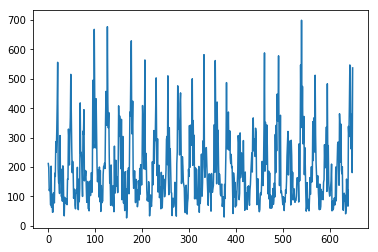

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[95525.13483750103, 98505.55821270999, 36889.9275718408]
(array([25., 25.]), array([437., 842.]), array([ 50., 830.]), 350.0)
(array([222., 225.]), array([437., 836.]), array([ 49., 828.]), 261.0)
(array([134., 136.]), array([434., 852.]), array([ 49., 828.]), 379.0)
(array([29., 30.]), array([437., 840.]), array([ 50., 832.]), 181.0)
(array([0., 0.]), array([410., 835.]), array([ 50., 830.]), 537.0)
(0.0, 0.2, 1.0)


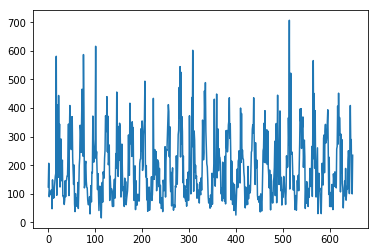

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[23061.013683492685, 32842.54969332814, 12770.333456143748]
(array([172., 173.]), array([181., 558.]), array([  2., 568.]), 259.0)
(array([492., 498.]), array([215., 586.]), array([  2., 571.]), 290.0)
(array([84., 86.]), array([173., 543.]), array([  2., 570.]), 110.0)
(array([0., 0.]), array([167., 542.]), array([  2., 570.]), 100.0)
(array([0., 0.]), array([142., 532.]), array([  3., 569.]), 235.0)
(0.0, 0.6, 1.0)


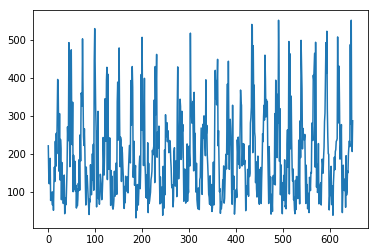

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[54335.01178258625, 19663.75541607383, 15247.043711187154]
(array([157., 158.]), array([184., 583.]), array([  7., 615.]), 279.0)
(array([280., 283.]), array([291., 654.]), array([  8., 615.]), 552.0)
(array([477., 484.]), array([221., 583.]), array([  8., 616.]), 238.0)
(array([0., 0.]), array([227., 608.]), array([  8., 616.]), 206.0)
(array([0., 0.]), array([214., 560.]), array([  7., 615.]), 287.0)
(0.0, 0.8, 1.0)


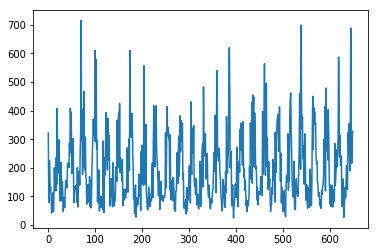

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[66920.84127812034, 37620.02609127837, 48467.18188913873]
(array([485., 489.]), array([ 70., 459.]), array([-11., 486.]), 689.0)
(array([646., 653.]), array([ 94., 480.]), array([-11., 488.]), 344.0)
(array([67., 68.]), array([ 74., 449.]), array([-11., 487.]), 216.0)
(array([23., 24.]), array([ 64., 447.]), array([-11., 486.]), 290.0)
(array([0., 0.]), array([ 68., 416.]), array([-11., 488.]), 328.0)
(0.0, 0.8, 0.8)


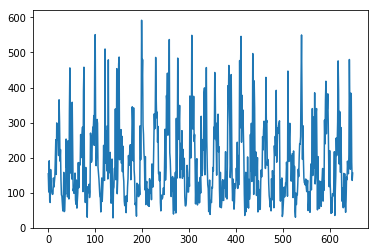

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[93711.33366324643, 17176.454042334684, 18933.845717247317]
(array([233., 234.]), array([  9., 364.]), array([-13., 409.]), 384.0)
(array([613., 621.]), array([-28., 364.]), array([-13., 407.]), 382.0)
(array([267., 271.]), array([-20., 338.]), array([-13., 410.]), 187.0)
(array([725., 743.]), array([-42., 327.]), array([-13., 410.]), 135.0)
(array([0., 0.]), array([-41., 328.]), array([-13., 409.]), 156.0)
(0.0, 0.6, 1.0)


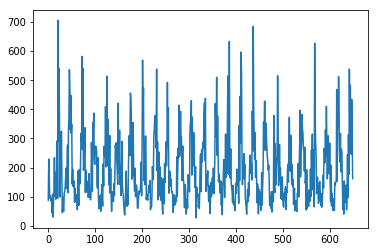

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[18959.697829059307, 11121.052538157286, 9291.98482212976]
(array([533., 537.]), array([146., 549.]), array([ -3., 560.]), 362.0)
(array([177., 178.]), array([163., 574.]), array([ -3., 560.]), 246.0)
(array([252., 255.]), array([159., 529.]), array([ -3., 561.]), 434.0)
(array([252., 259.]), array([161., 546.]), array([ -3., 560.]), 291.0)
(array([0., 0.]), array([133., 528.]), array([ -3., 559.]), 162.0)
(0.0, 1.0, 1.0)


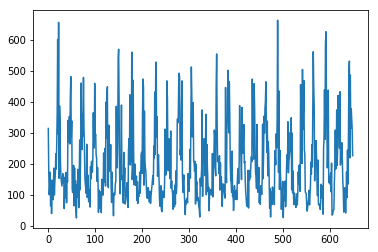

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[81239.53995907406, 10209.058650976109, 2778.5222804984196]
(array([416., 419.]), array([188., 603.]), array([ 16., 631.]), 315.0)
(array([634., 640.]), array([265., 656.]), array([ 17., 632.]), 378.0)
(array([319., 323.]), array([205., 600.]), array([ 17., 632.]), 342.0)
(array([827., 847.]), array([206., 613.]), array([ 16., 633.]), 310.0)
(array([0., 0.]), array([196., 578.]), array([ 17., 632.]), 226.0)
(0.0, 1.0, 1.0)


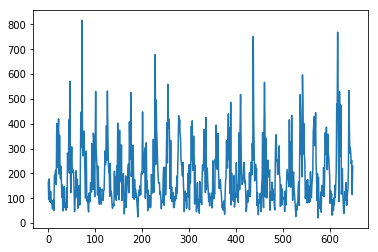

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[28221.066193563376, 2346.8977903014716, 3718.649246803105]
(array([361., 363.]), array([ 60., 509.]), array([-13., 472.]), 279.0)
(array([460., 465.]), array([ 58., 469.]), array([-13., 472.]), 239.0)
(array([384., 390.]), array([ 34., 442.]), array([-13., 472.]), 252.0)
(array([0., 0.]), array([  9., 419.]), array([-12., 472.]), 115.0)
(array([0., 0.]), array([ -8., 391.]), array([-13., 472.]), 230.0)
(0.0, 1.0, 1.0)


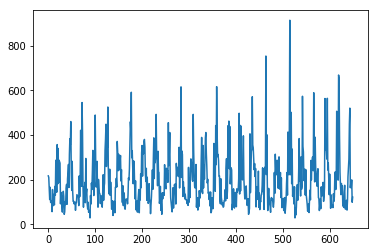

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[22827.300682719924, 8653.836703618634, 2699.9247192656303]
(array([250., 252.]), array([ 98., 534.]), array([-15., 475.]), 183.0)
(array([251., 254.]), array([ 26., 448.]), array([-14., 476.]), 165.0)
(array([21., 21.]), array([ 29., 434.]), array([-14., 476.]), 199.0)
(array([330., 338.]), array([  4., 417.]), array([-14., 476.]), 99.0)
(array([0., 0.]), array([-15., 415.]), array([-13., 474.]), 122.0)
(0.0, 1.0, 1.0)


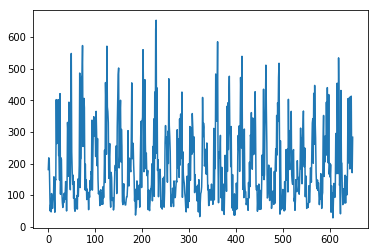

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[24494.131747984735, 10074.98352866603, 8643.79746015984]
(array([198., 200.]), array([ 96., 517.]), array([ -8., 522.]), 187.0)
(array([409., 413.]), array([149., 543.]), array([ -8., 526.]), 413.0)
(array([303., 308.]), array([ 92., 502.]), array([ -8., 526.]), 183.0)
(array([6., 6.]), array([105., 510.]), array([ -8., 525.]), 171.0)
(array([0., 0.]), array([ 87., 494.]), array([ -8., 526.]), 283.0)
(0.2, 1.0, 1.0)


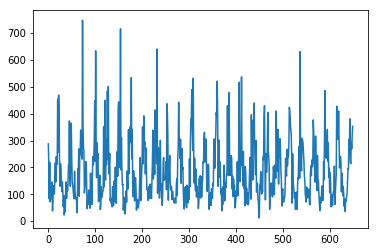

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[71379.11793675061, 4684.529493947188, 7418.409692120236]
(array([265., 267.]), array([111., 535.]), array([ -9., 499.]), 214.0)
(array([148., 149.]), array([ 77., 474.]), array([ -9., 500.]), 296.0)
(array([593., 601.]), array([ 91., 475.]), array([ -9., 500.]), 269.0)
(array([0., 0.]), array([ 71., 456.]), array([ -9., 497.]), 317.0)
(array([0., 0.]), array([ 71., 450.]), array([-10., 498.]), 353.0)
(0.0, 1.0, 1.0)


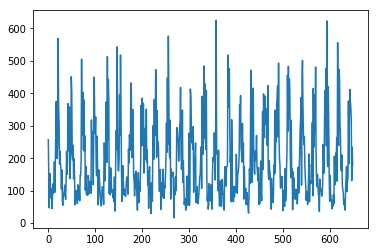

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31491.060254947282, 30404.622795574076, 24118.60643165546]
(array([84., 84.]), array([-69., 319.]), array([-28., 358.]), 358.0)
(array([533., 538.]), array([-114.,  278.]), array([-28., 359.]), 324.0)
(array([204., 208.]), array([-101.,  289.]), array([-28., 359.]), 131.0)
(array([232., 238.]), array([-117.,  270.]), array([-28., 359.]), 234.0)
(array([0., 0.]), array([-98., 285.]), array([-29., 360.]), 179.0)
(0.2, 0.6, 1.0)


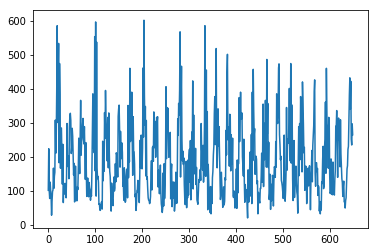

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[44947.29163504402, 13353.84114923769, 4606.278450149932]
(array([599., 603.]), array([232., 625.]), array([ -3., 602.]), 422.0)
(array([40., 41.]), array([226., 586.]), array([ -3., 601.]), 252.0)
(array([217., 220.]), array([204., 584.]), array([ -3., 603.]), 235.0)
(array([18., 19.]), array([191., 572.]), array([ -3., 603.]), 297.0)
(array([0., 0.]), array([183., 571.]), array([ -3., 604.]), 265.0)
(0.0, 1.0, 1.0)


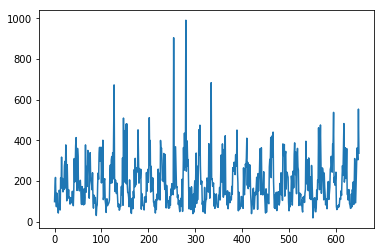

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[112454.42441177422, 28958.30621976911, 46784.20151857024]
(array([85., 85.]), array([ 65., 459.]), array([-17., 448.]), 362.0)
(array([15., 16.]), array([ 42., 457.]), array([-16., 447.]), 311.0)
(array([437., 444.]), array([ 28., 456.]), array([-17., 448.]), 304.0)
(array([36., 37.]), array([ 19., 432.]), array([-17., 446.]), 553.0)
(array([0., 0.]), array([  2., 406.]), array([-17., 448.]), 336.0)
(0.0, 0.8, 0.8)


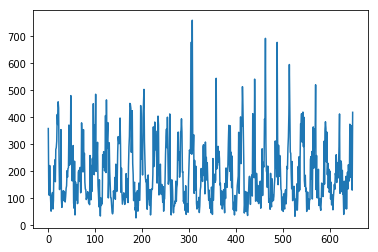

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[50438.28385610146, 18181.678715592, 22913.59835595931]
(array([133., 134.]), array([ 95., 484.]), array([-17., 433.]), 177.0)
(array([177., 179.]), array([ 11., 393.]), array([-17., 434.]), 369.0)
(array([115., 117.]), array([ 45., 421.]), array([-17., 433.]), 265.0)
(array([0., 0.]), array([ 24., 391.]), array([-17., 433.]), 130.0)
(array([0., 0.]), array([ 20., 388.]), array([-16., 432.]), 418.0)
(0.0, 0.8, 1.0)


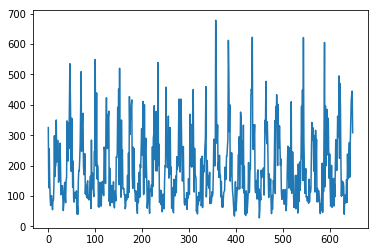

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[330319.4704867252, 85556.32084591969, 26783.320475063556]
(array([508., 512.]), array([-66., 330.]), array([ -8., 462.]), 352.0)
(array([671., 678.]), array([-82., 301.]), array([ -8., 462.]), 415.0)
(array([552., 561.]), array([-86., 287.]), array([ -8., 463.]), 433.0)
(array([1630., 1670.]), array([-98., 280.]), array([ -8., 462.]), 445.0)
(array([0., 0.]), array([-110.,  276.]), array([ -8., 462.]), 308.0)
(0.0, 0.0, 1.0)


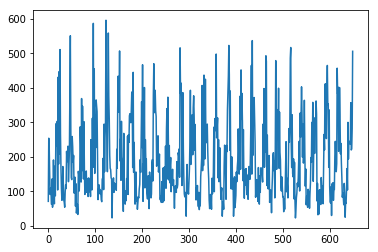

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[241672.13269541552, 20768.208155842207, 21185.97787607942]
(array([475., 478.]), array([ 56., 448.]), array([ -8., 458.]), 357.0)
(array([399., 404.]), array([ 58., 440.]), array([ -8., 458.]), 220.0)
(array([327., 331.]), array([ 32., 419.]), array([ -8., 460.]), 223.0)
(array([1214., 1243.]), array([ 18., 417.]), array([ -8., 459.]), 283.0)
(array([0., 0.]), array([ 21., 401.]), array([ -8., 460.]), 506.0)
(0.0, 0.8, 0.8)


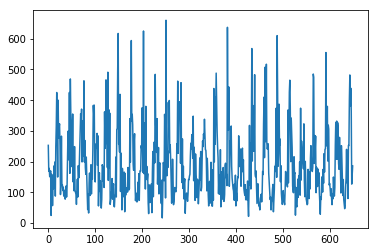

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[31978.312683560896, 42396.08902922432, 22409.03084586109]
(array([520., 524.]), array([262., 658.]), array([  9., 645.]), 439.0)
(array([667., 674.]), array([243., 627.]), array([  9., 647.]), 363.0)
(array([84., 86.]), array([226., 633.]), array([  8., 646.]), 127.0)
(array([6., 6.]), array([216., 606.]), array([  8., 646.]), 155.0)
(array([0., 0.]), array([207., 597.]), array([  9., 646.]), 186.0)
(0.0, 0.4, 1.0)


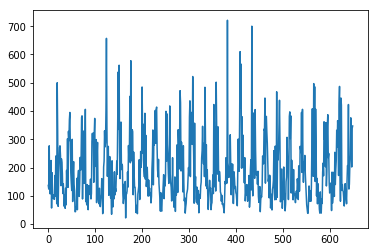

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[69605.94501389435, 18524.648329697087, 19284.027341673922]
(array([337., 339.]), array([ 10., 423.]), array([-10., 436.]), 376.0)
(array([484., 490.]), array([  6., 431.]), array([-10., 433.]), 325.0)
(array([526., 535.]), array([-15., 425.]), array([-10., 434.]), 202.0)
(array([635., 650.]), array([-35., 384.]), array([-10., 435.]), 339.0)
(array([0., 0.]), array([-32., 381.]), array([-10., 435.]), 347.0)
(0.0, 1.0, 1.0)


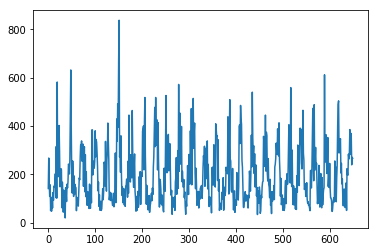

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[86717.77169666786, 2005.6470644699039, 7095.07575703781]
(array([130., 131.]), array([111., 516.]), array([ -6., 506.]), 370.0)
(array([561., 567.]), array([ 92., 492.]), array([ -7., 507.]), 359.0)
(array([671., 681.]), array([ 88., 496.]), array([ -6., 506.]), 239.0)
(array([0., 0.]), array([ 85., 474.]), array([ -7., 508.]), 270.0)
(array([0., 0.]), array([ 50., 451.]), array([ -7., 505.]), 266.0)
(0.0, 1.0, 1.0)


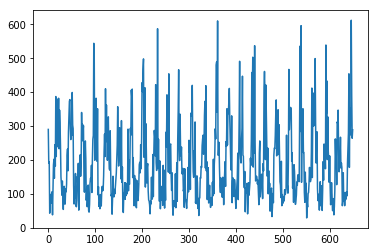

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[54993.447292357276, 45230.54735145032, 47753.83897208941]
(array([298., 300.]), array([ 64., 424.]), array([-13., 433.]), 329.0)
(array([589., 595.]), array([ 24., 380.]), array([-13., 433.]), 612.0)
(array([730., 741.]), array([ 19., 387.]), array([-13., 435.]), 388.0)
(array([0., 0.]), array([ -4., 376.]), array([-13., 435.]), 264.0)
(array([0., 0.]), array([ 18., 366.]), array([-13., 434.]), 289.0)
(0.0, 0.6, 0.8)


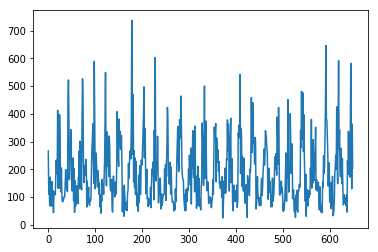

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[37710.72483081931, 52684.42059972861, 40274.01768502871]
(array([689., 694.]), array([-22., 356.]), array([-13., 568.]), 582.0)
(array([442., 447.]), array([ -2., 349.]), array([-14., 569.]), 372.0)
(array([362., 368.]), array([-20., 340.]), array([-14., 570.]), 130.0)
(array([89., 91.]), array([-47., 350.]), array([-13., 569.]), 363.0)
(array([0., 0.]), array([-24., 330.]), array([-14., 569.]), 204.0)
(0.0, 0.4, 0.8)


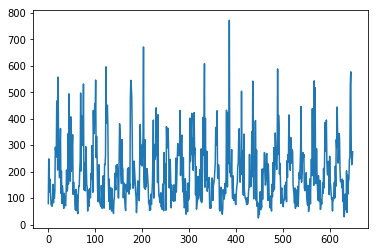

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[65837.65058825092, 41110.96947730949, 18476.75078900961]
(array([212., 214.]), array([238., 656.]), array([ 11., 680.]), 577.0)
(array([56., 57.]), array([304., 721.]), array([ 12., 677.]), 286.0)
(array([437., 444.]), array([256., 669.]), array([ 11., 677.]), 226.0)
(array([379., 388.]), array([254., 673.]), array([ 11., 680.]), 235.0)
(array([0., 0.]), array([263., 643.]), array([ 12., 679.]), 275.0)
(0.0, 0.4, 1.0)


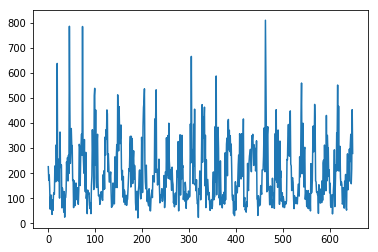

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[55429.41971600654, 20496.29173411031, 33648.27639129104]
(array([124., 125.]), array([ 39., 426.]), array([-22., 401.]), 355.0)
(array([77., 78.]), array([-13., 386.]), array([-20., 400.]), 158.0)
(array([6., 6.]), array([ -9., 395.]), array([-21., 401.]), 217.0)
(array([143., 146.]), array([-45., 391.]), array([-21., 401.]), 453.0)
(array([0., 0.]), array([-20., 366.]), array([-21., 400.]), 279.0)
(0.0, 0.8, 0.8)


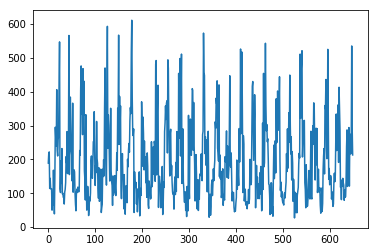

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34197.102427280224, 23872.264235853978, 32787.80519681394]
(array([290., 292.]), array([ 34., 418.]), array([-14., 418.]), 216.0)
(array([264., 266.]), array([ 33., 411.]), array([-14., 416.]), 263.0)
(array([221., 224.]), array([ 20., 384.]), array([-14., 417.]), 535.0)
(array([139., 142.]), array([-11., 379.]), array([-14., 418.]), 291.0)
(array([0., 0.]), array([-15., 391.]), array([-14., 418.]), 213.0)
(0.0, 0.8, 0.8)


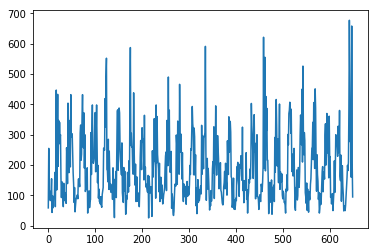

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[56841.90031740027, 65562.74395635641, 63073.73979724255]
(array([460., 463.]), array([-32., 330.]), array([-24., 409.]), 332.0)
(array([225., 227.]), array([-60., 306.]), array([-23., 408.]), 160.0)
(array([170., 172.]), array([-48., 287.]), array([-22., 408.]), 658.0)
(array([76., 77.]), array([-64., 300.]), array([-24., 408.]), 207.0)
(array([0., 0.]), array([-75., 285.]), array([-24., 410.]), 95.0)
(0.0, 0.6, 0.8)


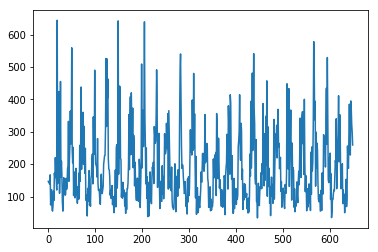

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[170594.40967555635, 53871.58251395178, 22103.959108575385]
(array([549., 554.]), array([-64., 340.]), array([ -7., 450.]), 395.0)
(array([410., 415.]), array([-101.,  278.]), array([ -7., 452.]), 372.0)
(array([634., 644.]), array([-90., 281.]), array([ -7., 450.]), 323.0)
(array([1095., 1125.]), array([-108.,  286.]), array([ -7., 451.]), 298.0)
(array([0., 0.]), array([-126.,  287.]), array([ -7., 450.]), 259.0)
(0.0, 0.2, 1.0)


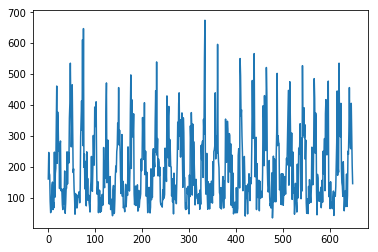

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[17902.298636610525, 7452.200983273646, 15757.691414842964]
(array([117., 118.]), array([ 71., 456.]), array([-11., 438.]), 258.0)
(array([347., 351.]), array([ 44., 428.]), array([-11., 438.]), 405.0)
(array([368., 373.]), array([ 37., 410.]), array([-11., 440.]), 308.0)
(array([0., 0.]), array([ 25., 413.]), array([-11., 437.]), 204.0)
(array([0., 0.]), array([  5., 392.]), array([-11., 436.]), 145.0)
(0.0, 1.0, 1.0)


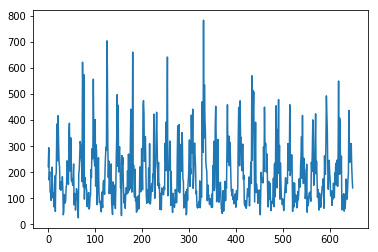

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[163315.55081390386, 6373.013035936106, 3644.6257899610705]
(array([331., 334.]), array([101., 499.]), array([ -9., 500.]), 262.0)
(array([10., 10.]), array([107., 505.]), array([ -8., 499.]), 310.0)
(array([6., 6.]), array([ 90., 501.]), array([ -8., 499.]), 221.0)
(array([973., 997.]), array([ 66., 478.]), array([ -8., 497.]), 175.0)
(array([0., 0.]), array([ 55., 459.]), array([ -9., 500.]), 140.0)
(0.0, 1.0, 1.0)


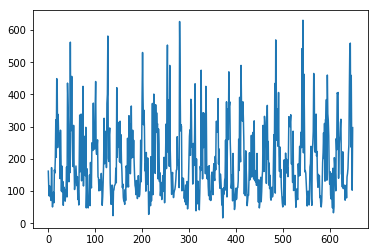

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[64287.60518079305, 76773.80819410118, 35958.26724641192]
(array([285., 287.]), array([348., 746.]), array([ 48., 724.]), 237.0)
(array([875., 885.]), array([333., 716.]), array([ 49., 723.]), 459.0)
(array([0., 0.]), array([337., 705.]), array([ 49., 724.]), 230.0)
(array([123., 126.]), array([315., 700.]), array([ 49., 723.]), 103.0)
(array([0., 0.]), array([306., 687.]), array([ 49., 723.]), 297.0)
(0.0, 0.2, 1.0)


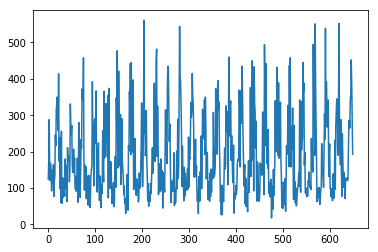

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[22233.054517905013, 25743.08690970238, 31361.137501452915]
(array([483., 487.]), array([ 12., 396.]), array([-15., 440.]), 354.0)
(array([397., 402.]), array([ 29., 393.]), array([-14., 440.]), 452.0)
(array([186., 189.]), array([ 11., 378.]), array([-14., 441.]), 386.0)
(array([177., 182.]), array([  8., 366.]), array([-14., 440.]), 299.0)
(array([0., 0.]), array([ -9., 341.]), array([-14., 440.]), 193.0)
(0.0, 0.6, 0.8)


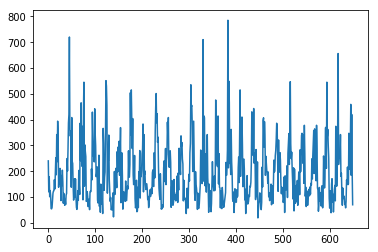

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[34453.91880307024, 20381.861994289313, 23919.65754755314]
(array([660., 665.]), array([ 65., 467.]), array([-13., 537.]), 459.0)
(array([34., 35.]), array([ 83., 482.]), array([-13., 537.]), 184.0)
(array([162., 164.]), array([ 57., 439.]), array([-12., 537.]), 420.0)
(array([0., 0.]), array([ 56., 440.]), array([-13., 539.]), 194.0)
(array([0., 0.]), array([ 20., 422.]), array([-13., 537.]), 70.0)
(0.0, 1.0, 1.0)


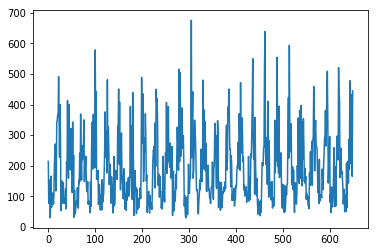

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.
[60166.79327687515, 11045.104235924402, 22717.950614263893]
(array([295., 298.]), array([149., 537.]), array([-11., 501.]), 435.0)
(array([104., 105.]), array([ 85., 480.]), array([-10., 501.]), 217.0)
(array([71., 72.]), array([ 89., 474.]), array([-11., 501.]), 294.0)
(array([18., 18.]), array([ 73., 462.]), array([-10., 499.]), 165.0)
(array([0., 0.]), array([ 64., 450.]), array([-10., 502.]), 445.0)
(0.0, 1.0, 1.0)


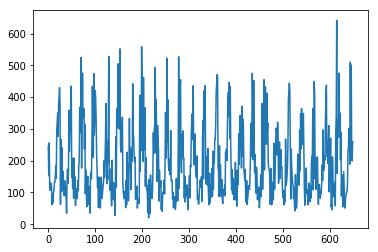

Initializing models...
Initialization finished.
Starting forward filtering...
Forward filtering completed.
Starting backward smoothing...
Backward smoothing completed.


ValueError: scale < 0

In [7]:
from scipy.special import expit
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
variance_level_results = []
import sys
from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
from sklearn.metrics import mean_squared_error

import os
D=26
rmse_vec_cv = []
#with suppress_stdout():
rmse_vec = []
sim_data_var = []
N_SIM = 1000
sim_results_pi = []
sim_results_mse = []
for sim_num in np.arange(1000):
            sim_n_t_d,sim_var = sim_data(D,10,False)
            sim_data_var.append(sim_var)
            train = sim_n_t_d
            


            train = np.array(train)
            train_n_t_d = train.reshape((-1,D))
            ts = train_n_t_d.sum(axis=1)
            data_to_be_scaled_down  = train_n_t_d[len(ts)-D:]




            delayed_data = []
            count = D
            for i in range(len(data_to_be_scaled_down)):
                tmp = data_to_be_scaled_down[i][:count].tolist()
                while len(tmp) <D:
                    tmp.append(0)
                delayed_data.append(tmp)
                count -=1 


            training_data = np.append(train_n_t_d[:len(ts)-D],delayed_data,axis=0)

            k = np.array(train_n_t_d).shape[1 ]
            alphas = np.ones(k)

            for i in range(len(ts)-D):
                alphas += train_n_t_d[i]

            
           
            #######
            # MODEL 1: Delay
            ########
            delay_model_samples = []
            for s_ in range(N_SIM):
                model_1_delay = []
                count = D
                p_vec_noise = np.random.dirichlet(alphas)
                for i in range(len(delayed_data)):
                    delay_forecast = np.sum(delayed_data[i])/np.sum(p_vec_noise[:count])
                    model_1_delay.append(np.round(delay_forecast,2))
                    count -= 1
                delay_model_samples.append(model_1_delay)
            
            delay_model_samples = np.array(delay_model_samples)
            

            #######
            # MODEL 2 : Forecast
            ########
            
            LO=5
            process_training_data = np.append(ts[:len(ts)-D],model_1_delay[:D-LO],axis=0)
            from pydlm import dlm, trend, seasonality, dynamic, autoReg, longSeason
            myDLM = dlm(process_training_data)
           # myDLM = myDLM + seasonality(26, name='7day', w=1.0)
            myDLM = myDLM + autoReg(degree=2, data=process_training_data, name='ar2', w=1.0)
            myDLM.fit()
            (process_model_forecast, predictVar) = myDLM.predictN(N=LO, date=myDLM.n-1)
            
            #######
            # MODEL 2
            ########
            forecast_model_samples = []
            for s_ in range(N_SIM):
                model_2_delay = []
                count = D
                for i in np.arange(LO,0,-1):
                    tmp = np.random.normal(process_model_forecast[LO-i],np.sqrt(predictVar[LO-i]))
                    model_2_delay.append(np.round(tmp,2))
                    count -= 1

                forecast_model_samples.append(np.append(model_1_delay[:D-LO],model_2_delay))
            
            forecast_model_samples = np.array(forecast_model_samples)
            
                
            model_average = bayes_estimate_prob(np.sum(delayed_data,axis=1),forecast_model_samples,alphas,LO,N_SIM)
            
            model_average = np.transpose(np.array(model_average).reshape((-1,LO)))
            delay_model_samples = np.transpose(np.array(delay_model_samples))
            forecast_model_samples = np.transpose(np.array(forecast_model_samples))
            
            delay_sim_res = delay_model_samples
            fcast_sim_res = forecast_model_samples
            avg_sim_res = model_average
            LO_av = avg_sim_res
            LO_delay = delay_sim_res[D-LO:]
            LO_fcast = fcast_sim_res[D-LO:]
            LO_truth = ts[len(ts)-LO:]
            
            sim_results_mse.append([mean_squared_error(np.mean(LO_delay,axis=1),LO_truth),\
                                   mean_squared_error(np.mean(LO_fcast,axis=1),LO_truth),\
                                   mean_squared_error(np.mean(LO_av,axis=1),LO_truth)])
            print (sim_results_mse[-1])
            av_cp = 0
            fcast_cp = 0
            delay_cp = 0
            for i in range(LO):
                LO_av_ci = np.round(np.percentile(LO_av[i],[2.5,97.5]))
                LO_fcast_ci = np.round(np.percentile(LO_fcast[i],[2.5,97.5]))
                LO_delay_ci = np.round(np.percentile(LO_delay[i],[2.5,97.5]))
                print (LO_delay_ci,LO_fcast_ci,LO_av_ci, LO_truth[i])
                if LO_av_ci[0] <= LO_truth[i] <= LO_av_ci[1]:
                    av_cp +=1

                if LO_fcast_ci[0] <= LO_truth[i] <= LO_fcast_ci[1]:
                    fcast_cp +=1

                if LO_delay_ci[0] <= LO_truth[i] <= LO_delay_ci[1]:
                    delay_cp +=1


            av_cp = 1.*av_cp/LO
            fcast_cp = 1.*fcast_cp/LO
            delay_cp = 1.*delay_cp/LO

            print (delay_cp,fcast_cp,av_cp)
            sim_results_pi.append([delay_cp,fcast_cp,av_cp])
    


        

In [8]:
#### sim_results_pi = np.array(sim_results_pi)
print np.mean(sim_results_pi,axis=0)

sim_results_mse = np.array(sim_results_mse)
print np.round(np.mean(sim_results_mse,axis=0)/1000)


[0.00687285 0.77182131 0.93608247]
[773.  27.  23.]
